In [113]:
%matplotlib notebook
from matplotlib import rcParams
# Set the font of the plots:
rcParams['font.family'] = 'Helvetica'
rcParams['font.sans-serif'] = ['Helvetica']
import matplotlib.pyplot as plt
import networkx as nx
import toverboom
import toverboom.lineageGraph
import toverboom.optimizeLayout
import toverboom.preprocessing
import pandas as pd
import collections
from toverboom.ancestry import create_ancestry_graph,\
                               visualize_ancestry,\
                               add_wildtype_state,\
                               visualize_distance_graph,\
                               time_expand
import pandas as pd
import pygraphviz

import matplotlib as mpl
import numpy as np
#mpl.rcParams['figure.dpi'] = 200

In [114]:
pwd

'/home/buysdb/repos/Analysis/cnv_normaliser'

# Parameters:

In [115]:
replicate = 'APKS3'
alias = '2'
# use other replicates to find out if clones already exist before the first timepoint:
createSharedTimepoint=False  

### Description of the clusters/states 

In [116]:
df = pd.read_pickle(f'./figures/resources/{alias}_copy_number_states.pickle.gz')
df.head()

,chromosome,cluster,binIndex,startCoordinate,endCoordinate,copyNumber
5,chr11,1,0,2.000000e+12,6.375000e+13,2.0
6,chr12,1,0,2.500000e+11,3.550000e+13,2.0
7,chr12,1,1,3.550000e+13,4.525000e+13,2.0
8,chr12,1,2,4.525000e+13,6.425000e+13,2.0
9,chr13,1,0,2.500000e+11,4.725000e+13,2.0


### Every cell is assigned to a single state

In [117]:
cell_info = pd.read_pickle(f'./figures/resources/{alias}_cell_info.pickle.gz')
cell_info.head()

cellId replicate  passage plate  cell  state
APKS2 14 1-1 292  (APKS2, 14, 1-1, 292)     APKS2       14   1-1   292      1
             326  (APKS2, 14, 1-1, 326)     APKS2       14   1-1   326      2
             132  (APKS2, 14, 1-1, 132)     APKS2       14   1-1   132      1
             213  (APKS2, 14, 1-1, 213)     APKS2       14   1-1   213      1
             15    (APKS2, 14, 1-1, 15)     APKS2       14   1-1    15     10

In [118]:
plate_types = {}
plate_ranges_cnv=collections.defaultdict(set)
for tp,plate, cell in cell_info.loc[replicate].index:
    plate_ranges_cnv[(tp,plate)].add(cell)
    if cell>96:
        plate_types[tp,plate]=384
for tp_plate in plate_ranges_cnv:
    if not tp_plate in plate_types:
        plate_types[tp_plate]=96
    

In [119]:
pd.DataFrame({'plate':plate_types})

plate
3  1-1    384
   2-1    384
7  1-1     96
   1-2     96
   1-3     96
   1-4     96
15 1-1    384
   2-1    384
19 1-1    384
   2-1     96
   2-2     96
   2-3     96
   2-4     96
23 1-1    384

In [120]:
def  format_sample_name(sample, offset=0):
    library,cell_id = sample.split('_')
    replicate, timepoint, plate = library.split('-',2)
    timepoint = int(timepoint.replace('P',''))
    plate = plate.replace('NLA','').replace('P','').replace('L','-')
    cell_id=int(cell_id)
    return replicate,timepoint, plate, cell_id+offset

In [121]:

bf = pd.read_pickle('bafs_segmented.pickle.gz')
bf.index = pd.MultiIndex.from_tuples([format_sample_name(i) for i in bf.index])



In [122]:
if False:
    seg = ('chr4', (1, 371))
    baf_df = {}
    for cell in bf[bf[seg]<0.05].index:
        if not cell in cell_info.index:
            baf_df[cell] = {'state':3, 'passage':cell[-3]}
    for cell in bf[bf[seg]>0.95].index:
        if not cell in cell_info.index:
            baf_df[cell] = {'state':4, 'passage':cell[-3]}
    cell_info = pd.concat( (cell_info, pd.DataFrame(baf_df).T))

# Tree inference

### Adding state 0, a completely wild-type state which will be used as the root of the copy number tree

To extract a good tree later the tree should start at a diploid state

In [123]:
df = add_wildtype_state(df)

In [124]:
# Count the presence of states across replicates
replicateClusters = {}
for r in cell_info.index.levels[0]:
    replicateClusters[r] = list(
        set(
            cell_info.loc[r]['state'])) + [0] # Add state zero as dummy
    
# replicate / state counter
replicateToStateCounter = collections.defaultdict( collections.Counter )
for (rep, timempoint, plate, cell),data in cell_info.iterrows():
    replicateToStateCounter[data['state']][(rep,timempoint)]+=1

lists = {'state':[],'replicate':[],'count':[] }
for cluster in replicateToStateCounter:
    for r, cnt in replicateToStateCounter[cluster].items():
        lists['replicate'].append(r)
        lists['state'].append(cluster)
        lists['count'].append(cnt)
        

allClusters = [0]
for x in replicateClusters.values():
    allClusters+=x
allClusters = sorted(list(set(allClusters)))

In [125]:
# Dataframe containing the abundance of every state (columns) across every replicate/timepoint (rows)
rsc = pd.DataFrame(replicateToStateCounter).sort_index(0).sort_index(1)
rsc.head()

1   2      3     4     5    6     7    8    9    10  ...   43  44  \
APKS1 10  11.0  33    NaN   NaN   7.0  1.0   1.0  NaN  NaN  NaN  ...  NaN NaN   
      22   NaN   3   27.0   6.0   NaN  NaN   NaN  NaN  NaN  NaN  ...  NaN NaN   
      25   NaN  11  303.0  88.0   NaN  NaN   1.0  NaN  2.0  NaN  ...  2.0 NaN   
APKS2 5   18.0  10    NaN   NaN  11.0  6.0  10.0  NaN  NaN  2.0  ...  NaN NaN   
      8   51.0  15    NaN   NaN  21.0  3.0  15.0  3.0  NaN  1.0  ...  NaN NaN   

          45   46  47  48  49  50  51   52  
APKS1 10 NaN  NaN NaN NaN NaN NaN NaN  1.0  
      22 NaN  NaN NaN NaN NaN NaN NaN  NaN  
      25 NaN  2.0 NaN NaN NaN NaN NaN  1.0  
APKS2 5  NaN  NaN NaN NaN NaN NaN NaN  NaN  
      8  NaN  NaN NaN NaN NaN NaN NaN  NaN  

[5 rows x 52 columns]

<IPython.core.display.Javascript object>


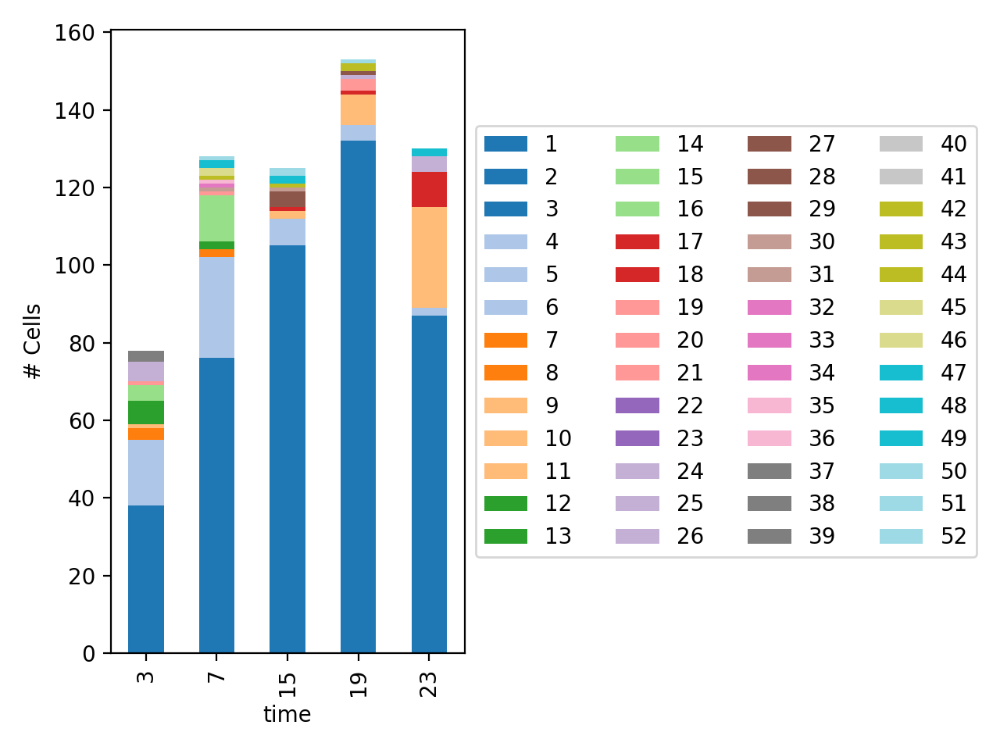

<IPython.core.display.Javascript object>


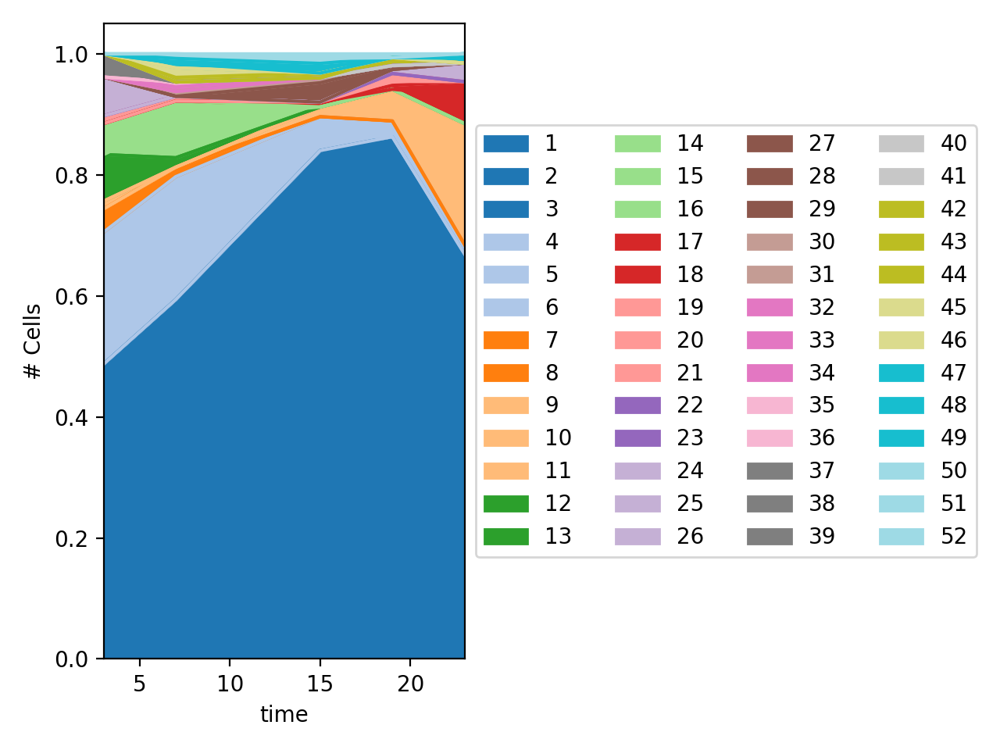

In [126]:
rsc.loc[replicate].sort_index(1).plot(kind='bar', stacked=True,colormap='tab20')
ax = plt.gca()
ax.legend(loc="center left",ncol=4,bbox_to_anchor=(1, 0.5))
ax.set_xlabel('time')
ax.set_ylabel('# Cells')
plt.tight_layout()
plt.show()

(rsc.loc[replicate].T / rsc.loc[replicate].sum(1)).T.sort_index(1).plot.area(colormap='tab20')
ax = plt.gca()
ax.legend(loc="center left",ncol=4,bbox_to_anchor=(1, 0.5))
ax.set_xlabel('time')
ax.set_ylabel('# Cells')
plt.tight_layout()

In [127]:
# Select only states which exist in this replicate:
cell_info = cell_info.loc[replicate]
df = df[df['cluster'].isin(replicateClusters[replicate])]

### Create ancestry graph which describes the distance between the copy number states

In [128]:
ancestry = create_ancestry_graph( df )

### Extract only CNV edges, and export to graphml

In [129]:
## Write distance graph
visualize_distance_graph(ancestry, prefix = f'./figures/{replicate}_{alias}')
reducedGraph = nx.DiGraph()
for u,v,w in ancestry.edges(data=True):
    if w['dtype']=='cnv':
        reducedGraph.add_edge(u,v,**w)

### Time expansion
constuct a graph where every node is a copy number clone at a point in time, instead of a node per copy number clone. This adds a time-dimension to our ancestry graph. This code also adds a "extinct" attribute which is set to `True` when the clone was seen last

All sampled timepoints are stored in the set `allTimePoints`

for all copy number states  the times of presence is stored in `cnvToTimePointMapping` this is a dictionary of lists, cnv->observed timepoints

then for all copy number states the last timepoint of presence is stored in `cloneExtinction`



In [130]:
expandedGraph = time_expand(reducedGraph, replicate, replicateToStateCounter, createSharedTimepoint=createSharedTimepoint, timePunish=0.001,same_tp_punish=10)

In [131]:
# Add radius attribute containing the relative abundance of the clone at every timepoint
for node in expandedGraph:
    
    state, timepoint = node
    cells_at_tp = cell_info[cell_info['passage']==timepoint]
    
    if cells_at_tp.shape[0]==0:
        continue
    
    cells_with_this_state = cells_at_tp[cells_at_tp['state']==state]
    ratio  = cells_with_this_state.shape[0] / cells_at_tp.shape[0]
    nx.set_node_attributes(expandedGraph, {node:ratio},'ratio')

In [132]:
agraph = nx.drawing.nx_agraph.to_agraph(expandedGraph)
agraph.layout(prog='dot')
for a,b in agraph.iteredges():
    d = agraph.get_edge(a,b).attr['distance']
    agraph.get_edge(a ,b).attr['label'] = d
    
agraph.write(f'./figures/{replicate}_{alias}_cnv_expanded_distance.dot')
agraph.draw(f'./figures/{replicate}_{alias}_cnv_expanded_distance.png')


### Extract an arborescence using Chu Liu Edmonds

Extract a minimum spanning `arborescence` from the time expanded graph,
this will extract a tree where every node in the time expanded graph is present, the amount of incoming edges for all but the root is 1. The copy-number distance is `minimized`.


In [133]:
e = nx.algorithms.tree.branchings.Edmonds(expandedGraph)
lineage_tree_graph = e.find_optimum(attr='distance',
                                    kind='min',
                                    preserve_attrs=True,style='arborescence')
# Preserve attrs does not work...
for node in lineage_tree_graph:
    nx.set_node_attributes(lineage_tree_graph, {node:expandedGraph.nodes[node]})


agraph = nx.drawing.nx_agraph.to_agraph(lineage_tree_graph)
agraph.layout(prog='dot')

for a,b in agraph.iteredges():
    d = agraph.get_edge(a,b).attr['distance']
    agraph.get_edge(a ,b).attr['label'] = d
    
agraph.write(f'./figures/{replicate}_{alias}_cnv_tree.dot')
agraph.draw(f'./figures/{replicate}_{alias}_cnv_tree.png')


# Tree visualisation

### Optimize the layout
Try to move the nodes vertically to reduce the amount of overlapping edges

<IPython.core.display.Javascript object>


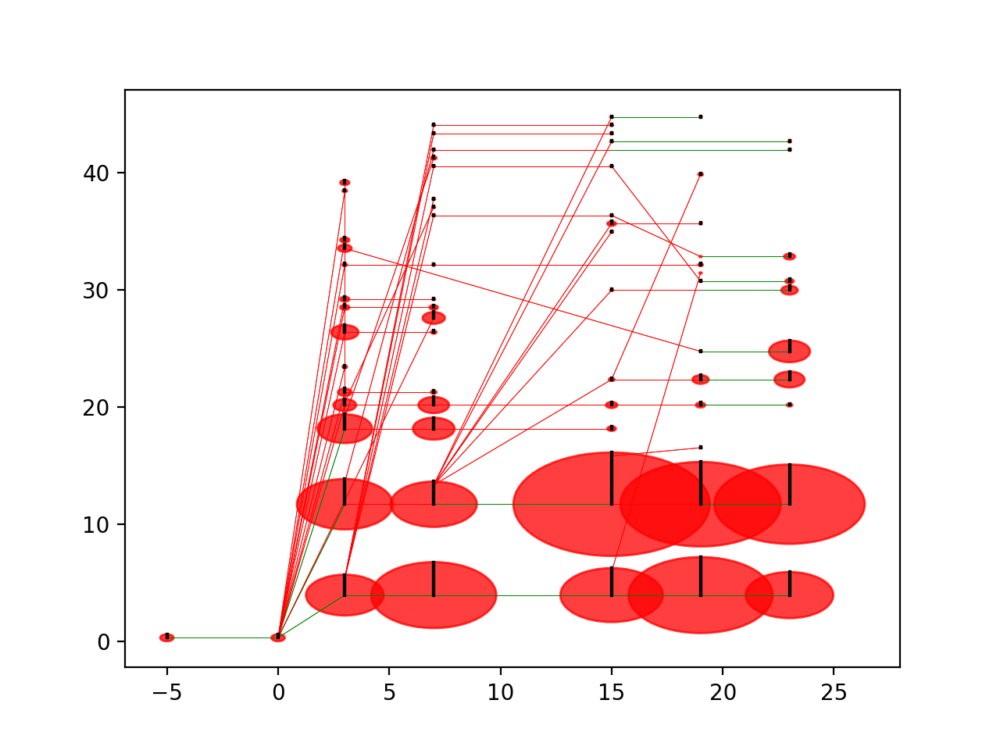

In [134]:
lg = toverboom.lineageGraph.LineageGraph(lineage_tree_graph)
# Create a figure for our plot:
fig, ax = plt.subplots()

# Find the best layout
toverboom.optimizeLayout.optimize_layout(lg,visualize_progress_ax=ax, visualize_progress_fig=fig,no_optim=True)

### Bezier surface correspoding to the relative amount of cells 

In [135]:
# customise clone order layout manually:

allClones = set([ cluster for cluster,tp in lg.graph ]) - set([0])
bigClones = set()

#if replicate=='APKS1':
#    lg.trellisOrder = [ 33,6,5,1,13, 3, 27, 34, 0, 9,2,28,  4, 22, 36, 14,7,21]
#    bigClones = [2,3,4]

<IPython.core.display.Javascript object>


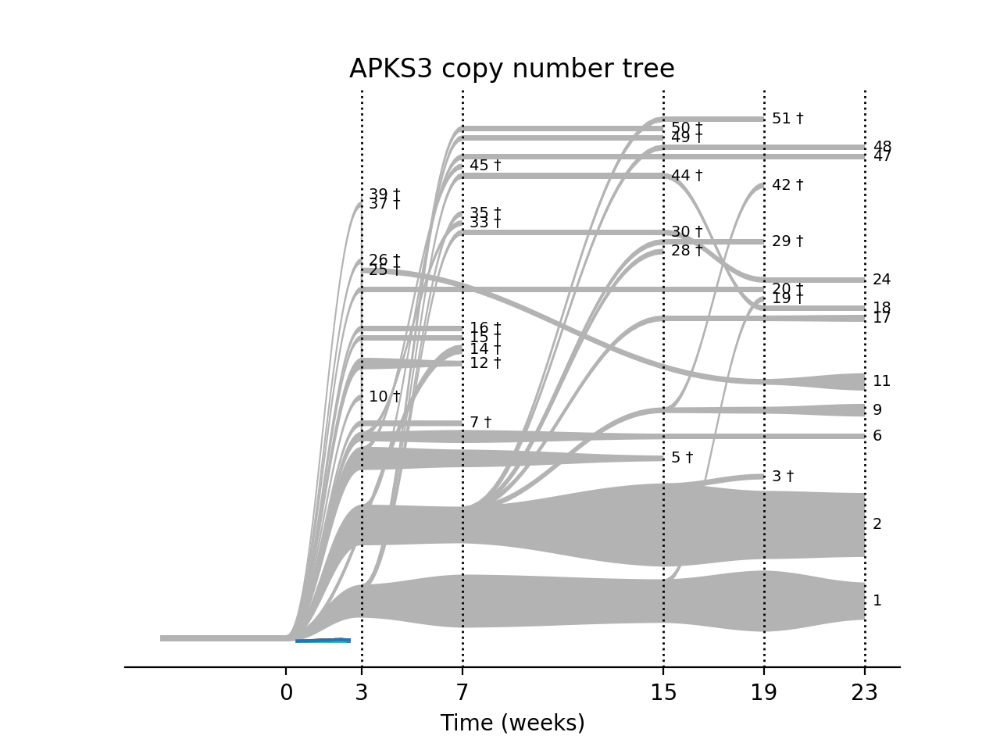

In [136]:
# Plot the polygons of the tree
fig, ax = plt.subplots()

# wavyness controls how wavy the segments of the tree are 
wavyness=0.4
# xDistance controls the stretch in the x direction 
lg.xDistance=10
lg.verticalSpacing = 0.4

lg.plotEdges(ax, bezier=True,wavyness=wavyness,stepCount=30,plotArgs={'linewidth':0}, offsetCentroid=True)
lg.plotPatches(ax=ax,wavyness=wavyness)

# Remove plot spines:
toverboom.lineageGraph.despine(ax)
# Scale labels to plot size:
toverboom.lineageGraph.format_x_axis_labels(ax)

# Add labels to the clones:
lg.annotateNodes(ax,plotArgs={'size':10,'weight':'bold'},x_offset = 3,nodesToAnnotate=[
     (cluster,tp) for cluster,tp in lg.graph if cluster!=0 and cluster in bigClones
])

# Add labels to the clones:
lg.annotateNodes(ax,plotArgs={'size':7},x_offset = 3,nodesToAnnotate=[
     (cluster,tp) for cluster,tp in lg.graph if cluster!=0 and cluster not in bigClones
])


fig.canvas.draw()
lg.plot_vertical_lines(ax, cell_info['passage'].unique(), c='k')
lg.plot_xticks(ax, [x for x in cell_info['passage'].unique()])
plt.title(f'{replicate} copy number tree')
ax.set_xlabel(f'Time (weeks)')
pass

# Add lineage marker information

In [137]:
df = pd.read_pickle(f'./resources/{replicate}_barcodeAbundanceGeneration.pickle.gz')

In [138]:
# Abundances of clones:
def dfToFreq(df, clone):
    frequencies = []
    generations = []
    sel = df[ df['barcode']==clone ]
    for timePoint in sel['generation']:
        try:
            freq = sel['frequency'][ sel['generation']==timePoint ].values[0]
        except:
            freq = 0
        frequencies.append(freq)
        generations.append(timePoint)
    return pd.DataFrame( [frequencies, generations], index=['frequency', 'generation']).transpose()
    

cloneOrder = df['barcode'].unique()

totalFrequencies = collections.Counter()
for clone in df['barcode'].unique():
    r = dfToFreq(df, clone)
    for i,row in r.iterrows():
        totalFrequencies[row.generation]+= row.frequency

generationToTimeFactor = 25/max(df['generation']) 
timePoints = sorted( df['generation']*generationToTimeFactor )



In [139]:
df['passage'] = df['generation']*generationToTimeFactor
df.set_index('barcode',inplace=True)

In [140]:
cellBarcodes = pd.read_pickle('./resources/cellToBarcode.pickle').loc[replicate]


In [141]:
pwd

'/home/buysdb/repos/Analysis/cnv_normaliser'

In [142]:
cnvOrig = pd.read_pickle('./resources/singleCellCNVClustering.pickle.gz').loc[replicate]

In [143]:
cnvOrig.index=pd.MultiIndex.from_tuples([(tp,plate,int(cell)) for tp,plate,cell in cnvOrig.index])

In [144]:

#offset by 1 (barcodes start at 1, cnvs at 0)
cell_info.index=pd.MultiIndex.from_tuples([(tp,plate,int(cell)+1)  for tp,plate,cell in cell_info.index])

In [145]:
cellCnv = cell_info.copy()
cellCnv['cluster'] = cellCnv['state']

In [146]:
graph = lineage_tree_graph

In [147]:
cellBarcodes.join(cellCnv, how='left')

barcode  source                 cellId  \
3  1-1 174  AACTTCAACTTAAACGACAGGGATA  SNV_PD   (APKS3, 3, 1-1, 173)   
       322  AAAATCAGGAGTACAGATATTACGA  SNV_PD   (APKS3, 3, 1-1, 321)   
       343  AGCCGTAGTAATATTTAGATCCCTA  SNV_PD                    NaN   
   2-1 185  AAAATAAATTAAACATTCAAGTGCA  NLA-SC   (APKS3, 3, 2-1, 184)   
7  1-1 4    ATTGTAATAGTAATTTACAAGGCGA  NLA_PD     (APKS3, 7, 1-1, 3)   
...                               ...     ...                    ...   
23 1-1 315  AATTACATTATTATATAAATAGCTA  SNV_PD  (APKS3, 23, 1-1, 314)   
       344  ATTCCTATAAGAATCACTAACTCAA  NLA_PD  (APKS3, 23, 1-1, 343)   
       364  ATTCCTATAAGAATCACTAACTCAA  SNV_PD  (APKS3, 23, 1-1, 363)   
       375  ATTCCTATAAGAATCACTAACTCAA  SNV_PD  (APKS3, 23, 1-1, 374)   
       378  ATTCCTATAAGAATCACTAACTCAA  SNV_PD  (APKS3, 23, 1-1, 377)   

           replicate  passage plate   cell  state  cluster  
3  1-1 174     APKS3      3.0   1-1  173.0    5.0      5.0  
       322     APKS3      3.0   1-1  321.0   39.0     39.0  
       343       NaN      NaN   NaN    NaN    NaN      NaN  
   2-1 185     APKS3      3.0   2-1  184.0    1.0      1.0  
7  1-1 4       APKS3      7.0   1-1    3.0    7.0      7.0  
...              ...      ...   ...    ...    ...      ...  
23 1-1 315     APKS3     23.0   1-1  314.0    1.0      1.0  
       344     APKS3     23.0   1-1  343.0   11.0     11.0  
       364     APKS3     23.0   1-1  363.0   11.0     11.0  
       375     APKS3     23.0   1-1  374.0   11.0     11.0  
       378     APKS3     23.0   1-1  377.0   11.0     11.0  

[118 rows x 9 columns]

In [148]:
cnvToBarcode = collections.defaultdict(collections.Counter)
for cell, row in cellBarcodes.join(cellCnv, how='inner').iterrows():
    if not pd.isnull(row['cluster']) and not pd.isnull(row['barcode']):
        cnvToBarcode[int(row['cluster'])][row['barcode']]+=1
        
cnvToBarcode = pd.DataFrame.from_dict(cnvToBarcode).fillna(0)

In [149]:
cnvAbundance = collections.defaultdict(dict)
for lineage,timepoint in graph:
    data = graph.nodes[lineage,timepoint ]
    cnvAbundance[lineage][timepoint] = data.get('ratio',0)
cnvAbundance = pd.DataFrame.from_dict(cnvAbundance).fillna(0).sort_index(1).sort_index(0)

In [150]:
currentAssocMap = cnvToBarcode.copy()
for barcode,row in currentAssocMap.iterrows():
    currentAssocMap.loc[barcode] = currentAssocMap.loc[barcode]/currentAssocMap.loc[barcode].sum()

for idx in list(set( df.index.unique() ) - set(currentAssocMap.index)):
    currentAssocMap.loc[idx]  = np.zeros( currentAssocMap.shape[1] )

In [151]:
# Create barcode, passage to frequency matrix
barcodeOrder = list(set(df.index))
passages = np.array(sorted(list(set(df['passage']))))
bulkMatrix = pd.DataFrame( np.zeros( (len(barcodeOrder), len(passages))), barcodeOrder,passages)
for bc, row in df.iterrows():
    bulkMatrix.loc[bc][row['passage']] = row['frequency'] 


In [152]:
freeBarcodeClones = (currentAssocMap>0).sum(1)>1 # These barcode clones have parameters 

In [153]:
# Required:
# For CNV clone X at timepoint T we need to find the relative occurence of barcode B within that clone 
# So the parameters we try to fit are:
#
# relOcc [0-1] for every barcode subclone in a copy number clone, 
# All clones where we have more than one barcode have relOcc free parameters

# assume all  single cells add up to 100% of the population
# and the barcodes also add up to 100%

# We need to associate each CNV clone to barcode clones (cnvToBarcode)
# Then distribute the barcode clones over the CNV clones
# The output is a dictionary of (CNV clone / timepoint) by barcode contribution 


scaledBarcodeCloneAbundance = collections.defaultdict(dict) # CNVClone, tp -> barcode -> abundance
interpolatedCNVabundance = collections.defaultdict(dict) # CNVClone -> tp-> abundance

makePlots=False
from scipy import interpolate
from scipy.interpolate import interp1d
currentAssocMap = cnvToBarcode.copy()
#currentAssocMap[set( df.index.unique() ) - set(cnvToBarcode.index)]

for cNVClone in cnvAbundance:
    
    if not cNVClone in currentAssocMap.columns:
        # There are no barcodes associated
        continue
    
    associatedBarcodes = currentAssocMap[cnvToBarcode[cNVClone]>0]
    
    timeInterpolated = [x for x in sorted(df['passage'].unique()) if x>=0 and x<=max(cnvAbundance.index)]
    interpolatedCNVlin = interp1d(cnvAbundance[cNVClone].index, cnvAbundance[cNVClone])
    interpolatedCNVcube = interp1d(cnvAbundance[cNVClone].index, cnvAbundance[cNVClone], kind='cubic')
    interpolatedCNVspline = interpolate.InterpolatedUnivariateSpline(
        cnvAbundance[cNVClone].index, cnvAbundance[cNVClone]
    )
    
    if makePlots:
        fig, ax = plt.subplots()
        plt.plot(
            cnvAbundance[cNVClone].index, cnvAbundance[cNVClone], 'o', 
            timeInterpolated, interpolatedCNVcube(timeInterpolated), '-', 
            timeInterpolated, interpolatedCNVlin(timeInterpolated), '--',
            timeInterpolated, np.clip(interpolatedCNVspline(timeInterpolated),0,1), '.'
        )

    
    interpolatedCNVabundance[cNVClone]={t:v for t,v in zip(timeInterpolated, interpolatedCNVcube(timeInterpolated))}
    associatedBarcodesOverTime = df.loc[[x for x in list(associatedBarcodes.index) if x in df.index]]
    total = collections.Counter()
    #fig, ax = plt.subplots()
    totalFreqAtTp = collections.Counter()
    for barcode in set(associatedBarcodesOverTime.index.unique()):
        x=[]
        y=[]

        for passage, frequency in zip(
            associatedBarcodesOverTime.loc[[barcode]]['passage'], 
            associatedBarcodesOverTime.loc[[barcode]]['frequency']):
            x.append(passage)
            y.append(frequency)
            totalFreqAtTp[passage]+=frequency
            total[passage] += frequency
        plt.plot(x,y, label=barcode)
        
    # Scale the barcode clones to 100% of the clone:
    for barcode in set(associatedBarcodesOverTime.index.unique()):

        for passage, frequency in zip(
            associatedBarcodesOverTime.loc[[barcode]]['passage'], 
            associatedBarcodesOverTime.loc[[barcode]]['frequency']):
            
            scaledBarcodeCloneAbundance[(cNVClone,passage)][barcode] = frequency/totalFreqAtTp[passage]
    
    if makePlots:
        plt.legend(['data', 'cubic', 'linear','spline'], loc='best')

        plt.scatter(total.keys(), total.values(), label='All associated barcodes combined', marker='+')
        plt.title(cNVClone)
        plt.show()

        #tf = pd.DataFrame.from_dict( scaledBarcodeCloneAbundance ).fillna(0)[cNVClone]
    #tf.T.plot(legend=False)




In [154]:
tf = pd.DataFrame.from_dict( scaledBarcodeCloneAbundance ).fillna(0)
iCNVabundance = pd.DataFrame(interpolatedCNVabundance).T
# Remove spurious negative values
iCNVabundance[iCNVabundance<0] = 0
# Make sure the frequencies add up to one 
iCNVabundance = (iCNVabundance / iCNVabundance.sum(0).T)
iCNVabundance = iCNVabundance.reindex(sorted(iCNVabundance.columns), axis=1)
iBulkMatrix = (bulkMatrix/bulkMatrix.sum(0).T)

In [155]:

allClones = set([ cluster for cluster,tp in lg.graph ]) - set([0])
bigClones = set([1,4,2,3,5])

In [156]:
# Instantiate the lineage graph object

barcodeOrder = None

if replicate=='APKS1':
    
    if alias=='2':
        lg.trellisOrder = (1,

         6,
         5,
         21,
         7,52,
         28,
         9,
         2,
         0,
         13,
         33,
         36,
         4,
         22,
         46,
         27,
         43,
         3,
         40,
         41,
         34,14
         )
    
    #set order of barcodes to be displayed
    barcode_order = [ 'ATTGCTATGCGAATTATCAGAGAGA','ATACGCAAATCCACAGACACTGTAA','AAAAACAAGTTCATAGTCATCGACA',
           'ACTTGGAATTTGAAATACAAGAAAA', 'ATCAAAAGTAATACTAAGACGTATA',
           'ATCTATACTAGAATTAAGAACTATA', 'AAATAAATTAAAACGTAAAACATCA',
           'AACTCAAAAATCACTGCAACCAAGA', 
           'ACTGATAGCAAAACCAATAACGACA']

elif replicate=='APKS2':
    
    
    lg.trellisOrder = (
     25,
     16,

     5,
        26,
     7,
     10,

     38,
     32,

     20,
     21,

     0,
      35,30,
     1,


     18,
     19,
        8,
         23,15,
     31,
     12,
     6,
     2,
     37)
    
    #lg.trellisOrder = initial_order
    barcode_order = [
        
        'ACTTGGAATTTGAAATACAAGAAAA', 'AGAACAAACCTAATAACGAAATTCA',
       'ATTGCGAATGCAACATCGAGAGCTA', 'AATAAAACCCATATCTTGATCGGAA',
       'ATGCAAAACTCAATTGATAGAGGTA', 'ACCAGTAAGAGCACCAGTAAGCGCA',
       'ATTTGAAAGTTTAAATGTATTAAGA', 'AACCAGATAAGCAAGTTTAGGTTGA',
       'AGGCGAACAAACATACTAACACGTA', 'AAACTCAATAATACTCTTAAAACGA',
       'ATGCTGACCCGAACGCTAAAATTTA', 'AAACAGATCAACAACCAAATACGAA',
       'ACCACAACGGCAATTGCAACCATCA', 'AAGGACAGATCTATTTCCATTAATA',
       'ACCTGAAAACCAATTAAAAAGATCA', 'ATTATAATCGATAACTAAATAGACA',
       'AACACTAGTGACAGTTACAAATGAA', 'AAGTAAAGAGGAAACAAGACAAATA',
       'ACCAGTATTATTAGTGAAAATATCA', 'ACTGAGAGGCAAAAGTTCAAAATCA',
       'ACGTATATCCGAATGTAGATTTCTA', 'AAGCATAGAAAGACTGTCAAGTATA',
       'ACAATTAGGCGGAAAGGCACTGGAA', 'AATGTGATGCACACAGTGACCTAGA',
       'ATAAAAATAATTATTCAGACTTCTA', 'ATATAAAACATAAAGTTCAAAGAGA',
       'ACAGTCATCTAAATTCCGAAGGCAA', 'AGCATTATGTACATTCTAAAAGGCA',
       'ACAAACAGTTATATCATCATTCTGA', 'ACACGAATCTATATCGCCATAACTA',
       'AGGATCAGACCTAGTACTAGGCAGA', 'ACGAGTAAACGAAAAATAATAACAA',
       'AGGAGCACTCCGACAACGATGGAAA', 'ACACATAATAGAACGTTGACTTACA',
       'AACCGAAGCGACAACATAAGAACAA'
    
    ]


elif replicate=='APKS3':
    barcode_order = ['AATGTGATCTGCACATCGACGCGAA','AGCACTATCCAGAAACGAAGTTTAA','AAAGATAGACACAGAGCTAGAAACA', 
       'AACAAAAAACCTAAATATATCTTGA', 'AAATTAAAAAGAAGTCCAAAAGCTA',
       'ACATACAAAACTAAATGAAAGAGGA', 'AGCCGTAGTAATATTTAGATCCCTA',
       'AATCCGACTCACAAGGCTATAGGAA', 'ATCTCTATCAGTACAATAATCTTAA',
       'AACATAAATACTATTATTAGCCGGA', 'ATAATAAAGGCCATAATAAACTGAA',
       'AATTACATTATTATATAAATAGCTA', 'ATACGGAAGCTTATATCAATCGCGA',
       'AACGCGATTCCGAGCATAATTACAA', 'ATAACGATACGCATACTCAATGCCA',
       'AAAAATAAATGAATTATTAAATGCA', 'AACCTCAACCCAACTGTAACACTAA',
       'AAAATGAAGTGTAACCCGAAATAGA', 
       'AACAACACGAAAAAATGTAAAGAAA', 'ACGAAGAAGCCAAACTAAACTTGTA',
       'ATCACAAGTTTGAGTAGGAGGAATA', 'AATAAAATAAAAACCGATAGAACCA',
       'ATATTTAAGACTATTAGAACGTCAA', 'AGCAAAATACGGACGCGGACCGGGA',
       'ACTGCAACCCTAAAAGTCACCCGAA', 'AACCTAAGACGCATATGAAACGATA',
       'ATTGTAATAGTAATTTACAAGGCGA', 'ATTCCTATAAGAATCACTAACTCAA',
       'ACTACGAGTATAAAATAGAATAGAA', 'ATTCTCACGTAAAACGGAATCTGAA',
       'AAATACACATTGACATCCAAGTACA']

    bigClones = set([1,2])
    
    lg.trellisOrder = (47,
         17,
         3,
         28,
         2,
                       9,
         42,
         29,
         48,
         51,
         
         15,
         16,

         14,
         33,
         26,
         6,
         0,
         39,
         37,
         10,
         24,
         30,
         35,
         1,
                       19,
         
                       50,
         49,
         
         
         44,
         18,
         20,
         7,
         12,25,11,5,45)


if barcode_order is not None:
    missing_barcodes_in_order = set(tf.index).difference(set(barcode_order))
    over_supplied_barcodes = set(barcode_order).difference(set(tf.index))
    if len(over_supplied_barcodes):
        print(f'ignoring supplied barcodes from order: {over_supplied_barcodes}')
        barcode_order = [bc for bc in barcode_order if not bc in over_supplied_barcodes]
    if len(missing_barcodes_in_order):
        print(f'Appending missing barcodes to order: {missing_barcodes_in_order}')
        barcode_order+= list(missing_barcodes_in_order)
    tf = tf.reindex(barcode_order)

<IPython.core.display.Javascript object>


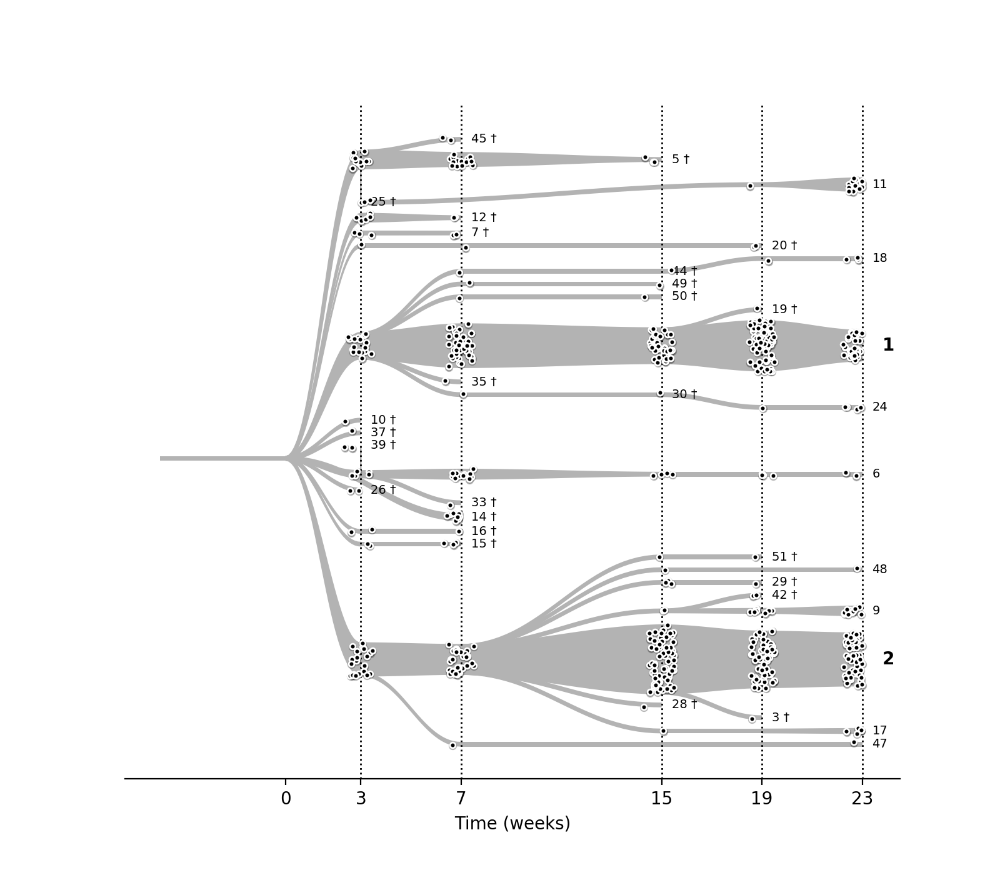

In [157]:
# Plot the polygons of the tree
fig, ax = plt.subplots(figsize=(8,7))

cellData = cellCnv.copy()
cellData['tp'] = cellData['passage']

if False:
    cellData['color'] = [{
        3:'r', 16:'r', 20:'r' ,
        5:'c',  21:'c',
        2:'orange'}.get(cluster,'grey') for cluster in cellData['cluster'] ]

# wavyness controls how wavy the segments of the tree are 
wavyness=0.4
# xDistance controls the stretch in the x direction 
lg.xDistance=10
lg.verticalSpacing = 1



lg.plot_xticks(ax, [x for x in cellData['tp'].unique()])
lg.plot_vertical_lines(ax, cellData['tp'].unique(), c='k')
lg.annotateNodes(ax,plotArgs={'size':10, 'weight':'bold'}, 
             # Use the nodesToAnnotate argument to select which nodes to annotate
             nodesToAnnotate=[
                 (cluster,tp)
                  for cluster,tp in lg.graph if cluster in bigClones],
             x_offset = 8 # How much to move the labels to the right
            )

lg.annotateNodes(ax,plotArgs={'size':7}, 
             # Use the nodesToAnnotate argument to select which nodes to annotate
             nodesToAnnotate=[
                 (cluster,tp)
                  for cluster,tp in lg.graph if cluster in allClones-bigClones],
             x_offset = 4 # How much to move the labels to the right
            )

ax.set_xlabel('Time (weeks)')


lg.plotEdges(ax, bezier=True,wavyness=wavyness,stepCount=30,plotArgs={'linewidth':0}, offsetCentroid=True)
lg.plotPatches(ax=ax,wavyness=wavyness)

plt.pause(2)
plt.savefig(f'./figures/{replicate}_{alias}.cnv_tree_bck.png')
plt.savefig(f'./figures/{replicate}_{alias}.cnv_tree_bck.svg')


lg.plotSingleCells(cellData,plotPatches=False,enableShadow=True,ax=ax,fig=fig,defaultCellSize=10,cellJitter=5)

# Remove plot spines:
toverboom.lineageGraph.despine(ax)
# Scale labels to plot size:
toverboom.lineageGraph.format_x_axis_labels(ax)

plt.pause(2)
plt.savefig(f'./figures/{replicate}_{alias}.cnv_tree.png')
plt.savefig(f'./figures/{replicate}_{alias}.cnv_tree.svg')


<IPython.core.display.Javascript object>


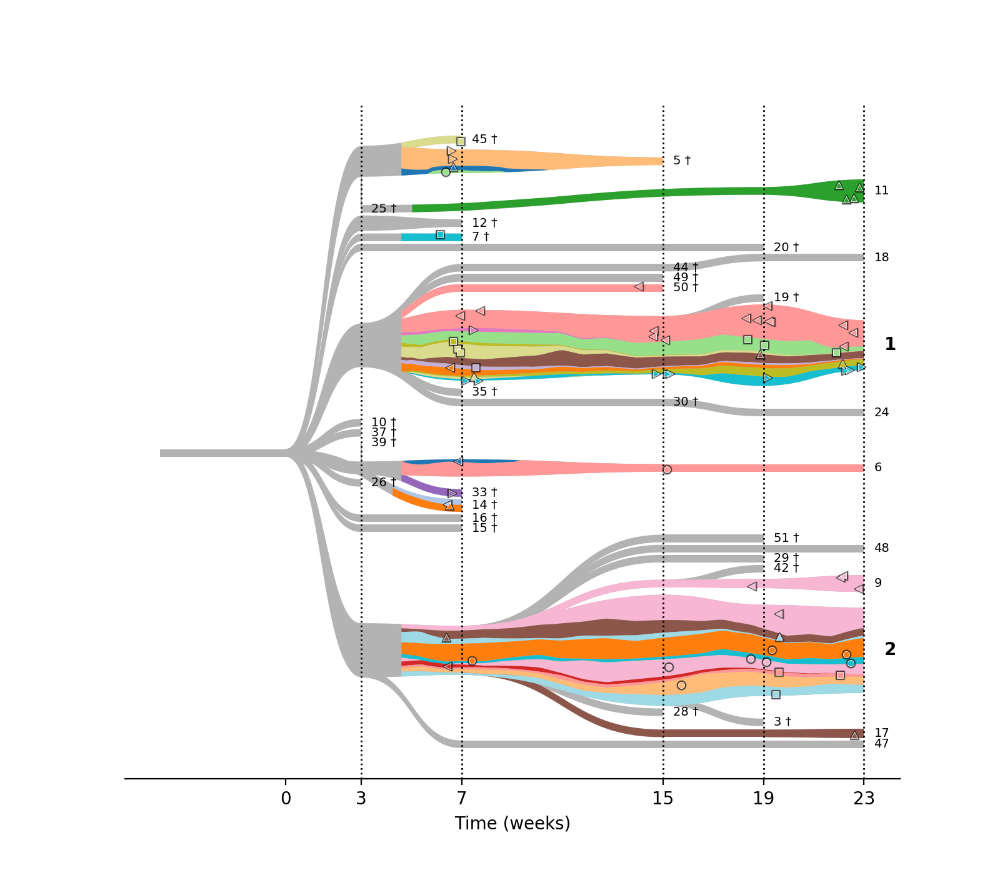

In [158]:
# Plot the polygons of the tree
fig, ax = plt.subplots(figsize=(8,7))

# wavyness controls how wavy the segments of the tree are 
wavyness=0.4
# xDistance controls the stretch in the x direction 
lg.xDistance=10
lg.verticalSpacing = 1

lg.plotEdges(ax, bezier=True,wavyness=wavyness,stepCount=30,plotArgs={'linewidth':1}, offsetCentroid=True)
lg.plotPatches(ax=ax,wavyness=wavyness)

# Remove plot spines:
toverboom.lineageGraph.despine(ax)
# Scale labels to plot size:
toverboom.lineageGraph.format_x_axis_labels(ax)

# Add labels to the clones:
cellCnvBarcode = cellCnv.join(cellBarcodes)
cloneColorsMarkers = lg.plot_stack(cellCnvBarcode, tf, ax, fig)



cellData = cellCnvBarcode
cellData['tp'] = [passage for passage, plate, cell in list(cellData.index)]

# Remove plot spines:
toverboom.lineageGraph.despine(ax)

# Scale labels to plot size:
toverboom.lineageGraph.format_x_axis_labels(ax)

# Add vertical lines to indicate sampled timepoints
lg.plot_xticks(ax, [x for x in cellData['tp'].unique()])
lg.plot_vertical_lines(ax, cellData['tp'].unique(), c='k')
lg.annotateNodes(ax,plotArgs={'size':10, 'weight':'bold'}, 
             # Use the nodesToAnnotate argument to select which nodes to annotate
             nodesToAnnotate=[
                 (cluster,tp)
                  for cluster,tp in lg.graph if cluster in bigClones],
             x_offset = 8 # How much to move the labels to the right
            )

lg.annotateNodes(ax,plotArgs={'size':7}, 
             # Use the nodesToAnnotate argument to select which nodes to annotate
             nodesToAnnotate=[
                 (cluster,tp)
                  for cluster,tp in lg.graph if cluster in allClones-bigClones],
             x_offset = 4 # How much to move the labels to the right
            )

ax.set_xlabel('Time (weeks)')
fig.canvas.draw()
plt.pause(1)
plt.savefig(f'./figures/{replicate}_{alias}.barcoded_tree.png',dpi=200)
plt.savefig(f'./figures/{replicate}_{alias}.barcoded_tree.svg')

In [159]:
# Plot sSNVs on top of the tree


In [160]:
#df_ssnvs = pd.read_pickle('/media/buysdb/eightA/data/organoids/sc_rg_variants.pickle.gz')
#df_ssnvs.index = pd.MultiIndex.from_tuples(( format_sample_name(i, offset=1) for i in df_ssnvs.index ))

In [161]:
#df_ssnvs = pd.read_pickle('/media/buysdb/eightA/data/organoids/sc_variant_data.pickle.gz')
#Offset:
df_ssnvs = pd.read_pickle('/media/buysdb/eightA/data/organoids/positive_verdict_calls.pickle.gz') 
df_ssnvs.index = pd.MultiIndex.from_tuples([ (k[0],k[1],k[2],k[3]+1) for k in df_ssnvs.index])

In [162]:

def plotsnv(snv_chrom,snv_pos):

    #snv_chrom = 'chr3'
    #snv_pos = 166750079 

    # Plot the polygons of the tree
    fig, ax = plt.subplots(figsize=(6,7))

    cellData = cellCnv.copy()
    cellData['tp'] = cellData['passage']

    


    snv_to_plot = df_ssnvs[snv_chrom,snv_pos].copy()
    snv_to_plot.columns = [f'{snv_chrom}_{snv_pos}']
     # Join with snv data:

    cellData = cellData.join(snv_to_plot.loc[replicate])

    grey = (0,0.1,0.1,0.2)
    state_colors = {

       np.nan :grey,
        1: 'red',
        0: 'blue'

    }
    cellData['color'] = [state_colors.get(v,grey) for c,v in cellData[f'{snv_chrom}_{snv_pos}'].items()]

    state_markers = {

       np.nan : '^',
        1: 'o',
        0: 's'

    }
    cellData['marker'] = [state_markers.get(v,'^') for c,v in cellData[f'{snv_chrom}_{snv_pos}'].items()]


    state_sizes = {

       np.nan : 20,
        1: 40,
        0: 40

    }
    cellData['size'] = [state_sizes.get(v,20) for c,v in cellData[f'{snv_chrom}_{snv_pos}'].items()]
    state_order = {

       np.nan : 20,
        1: 50,
        0: 50

    }
    cellData['z-order'] = [state_order.get(v,10) for c,v in cellData[f'{snv_chrom}_{snv_pos}'].items()]


    lw = {

        1: 0.5,
        0: 0.5
    }
    cellData['edge_width']  = [lw.get(v,0) for c,v in cellData[f'{snv_chrom}_{snv_pos}'].items()]


    # wavyness controls how wavy the segments of the tree are 
    wavyness=0.4
    # xDistance controls the stretch in the x direction 
    lg.xDistance=10
    lg.verticalSpacing = 1


    lg.plot_xticks(ax, [x for x in cellData['tp'].unique()])
    lg.plot_vertical_lines(ax, cellData['tp'].unique(), c='k')
    lg.annotateNodes(ax,plotArgs={'size':10, 'weight':'bold'}, 
                 # Use the nodesToAnnotate argument to select which nodes to annotate
                 nodesToAnnotate=[
                     (cluster,tp)
                      for cluster,tp in lg.graph if cluster in bigClones],
                 x_offset = 8 # How much to move the labels to the right
                )

    lg.annotateNodes(ax,plotArgs={'size':7}, 
                 # Use the nodesToAnnotate argument to select which nodes to annotate
                 nodesToAnnotate=[
                     (cluster,tp)
                      for cluster,tp in lg.graph if cluster in allClones-bigClones],
                 x_offset = 4 # How much to move the labels to the right
                )

    ax.set_xlabel('Time (weeks)')
    ax.set_title(f'{snv_chrom}:{snv_pos}')
    ax.set_xlim( left=0)

    lg.plotEdges(ax, bezier=True,wavyness=wavyness,stepCount=30,plotArgs={'linewidth':0}, offsetCentroid=True)
    lg.plotPatches(ax=ax,wavyness=wavyness,facecolor=(226/255,229/255,233/255,1))



    lg.plotSingleCells(cellData,
                       plotPatches=False,
                       enableShadow=False,ax=ax,fig=fig,defaultCellSize=10,cellJitter=5)

    # Remove plot spines:
    toverboom.lineageGraph.despine(ax)
    # Scale labels to plot size:
    toverboom.lineageGraph.format_x_axis_labels(ax)
    
    
    #plt.pause(2)
    
    plt.savefig(f'./figures/{replicate}_{alias}.snv_{snv_chrom}_{snv_pos}_tree.png', dpi=400)
    plt.savefig(f'./figures/{replicate}_{alias}.snv_{snv_chrom}_{snv_pos}_tree.svg')



<IPython.core.display.Javascript object>


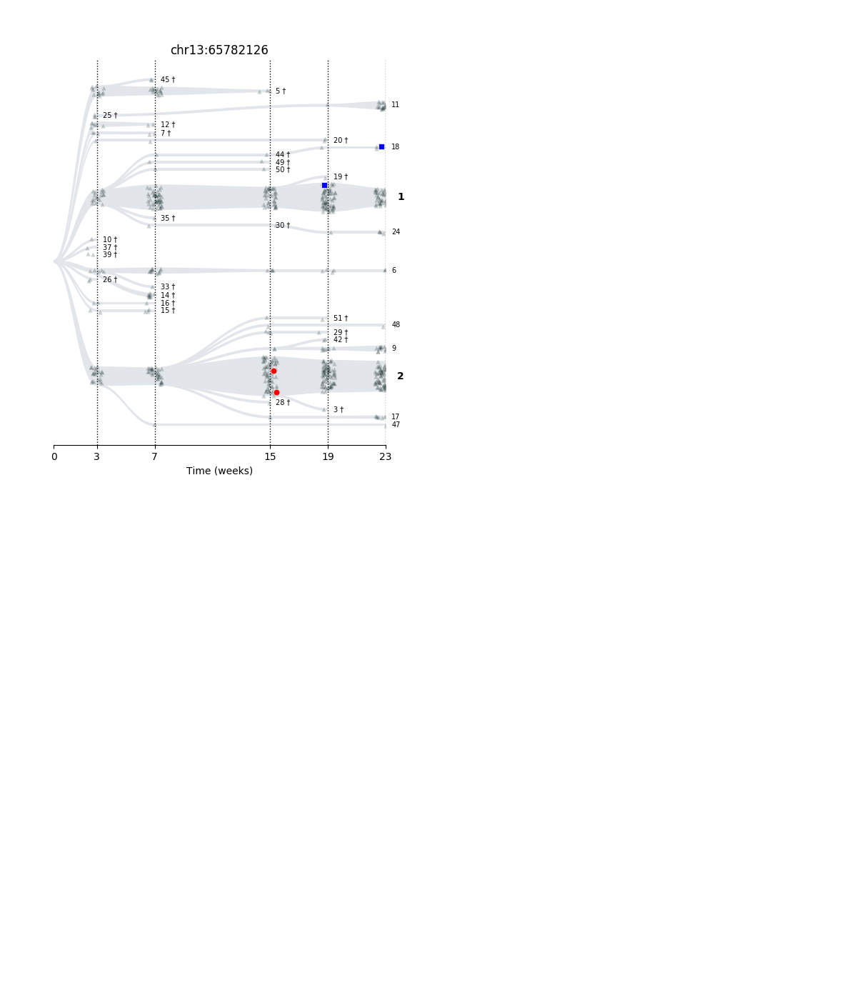

/home/buysdb/.local/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2874: PerformanceWarning: indexing past lexsort depth may impact performance.
  return runner(coro)


<IPython.core.display.Javascript object>


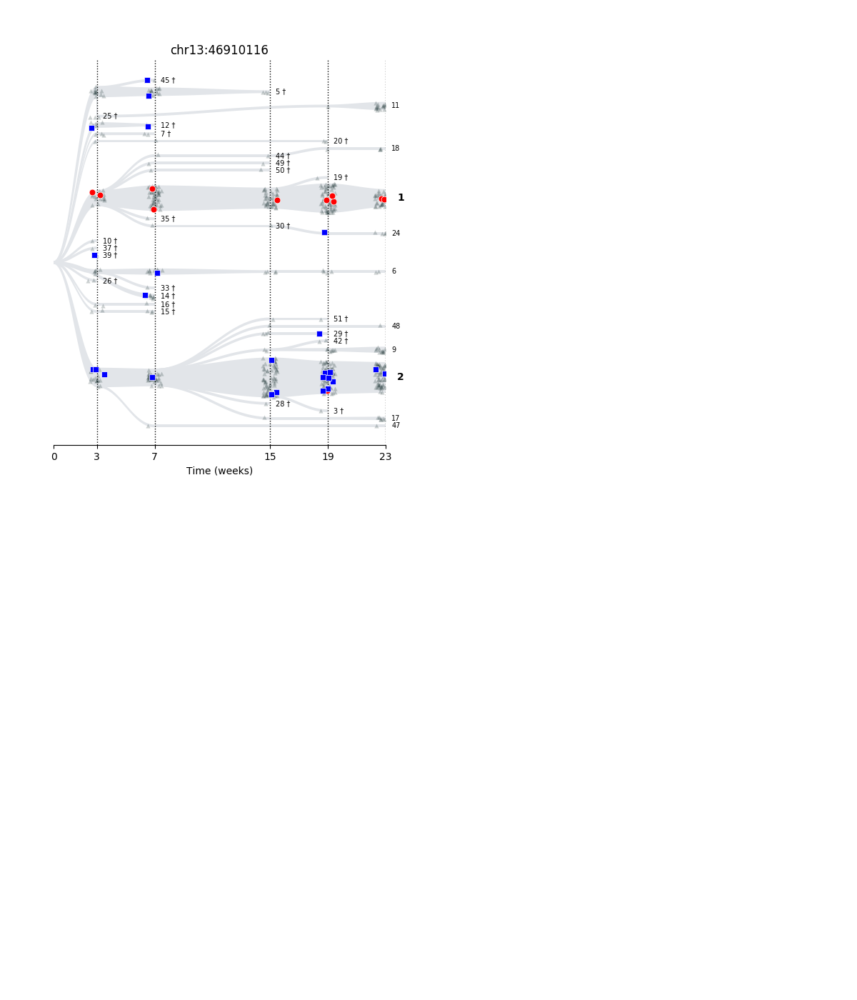

<IPython.core.display.Javascript object>


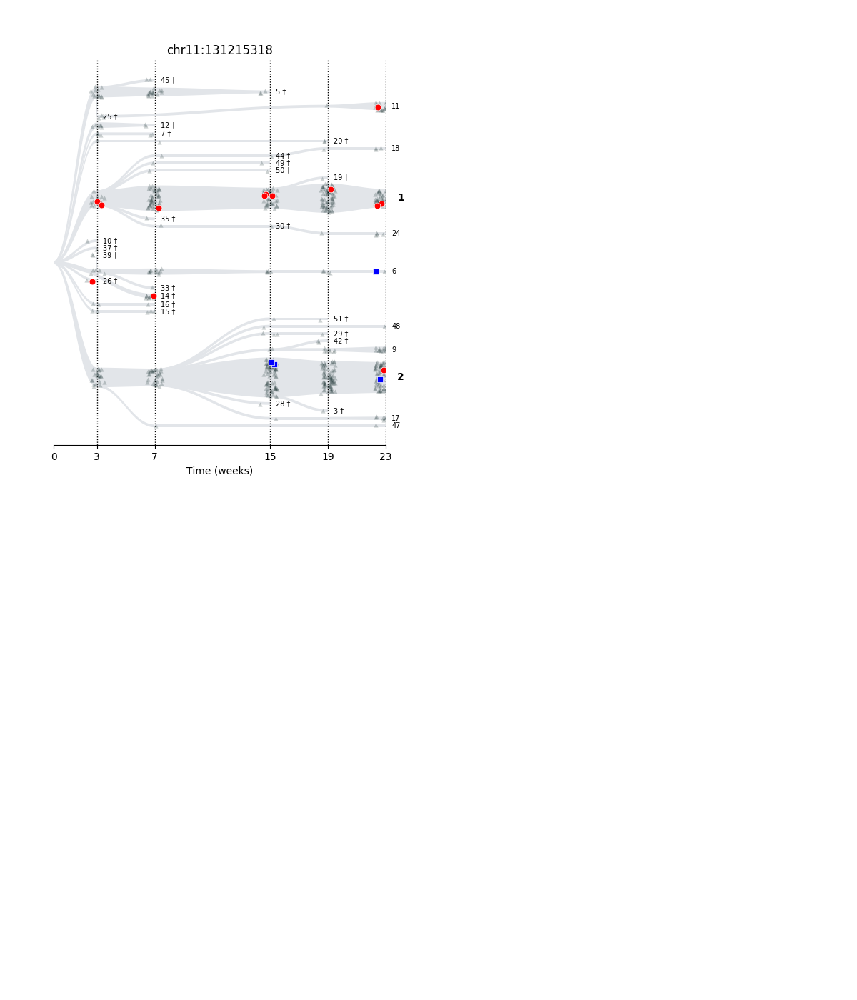

<IPython.core.display.Javascript object>


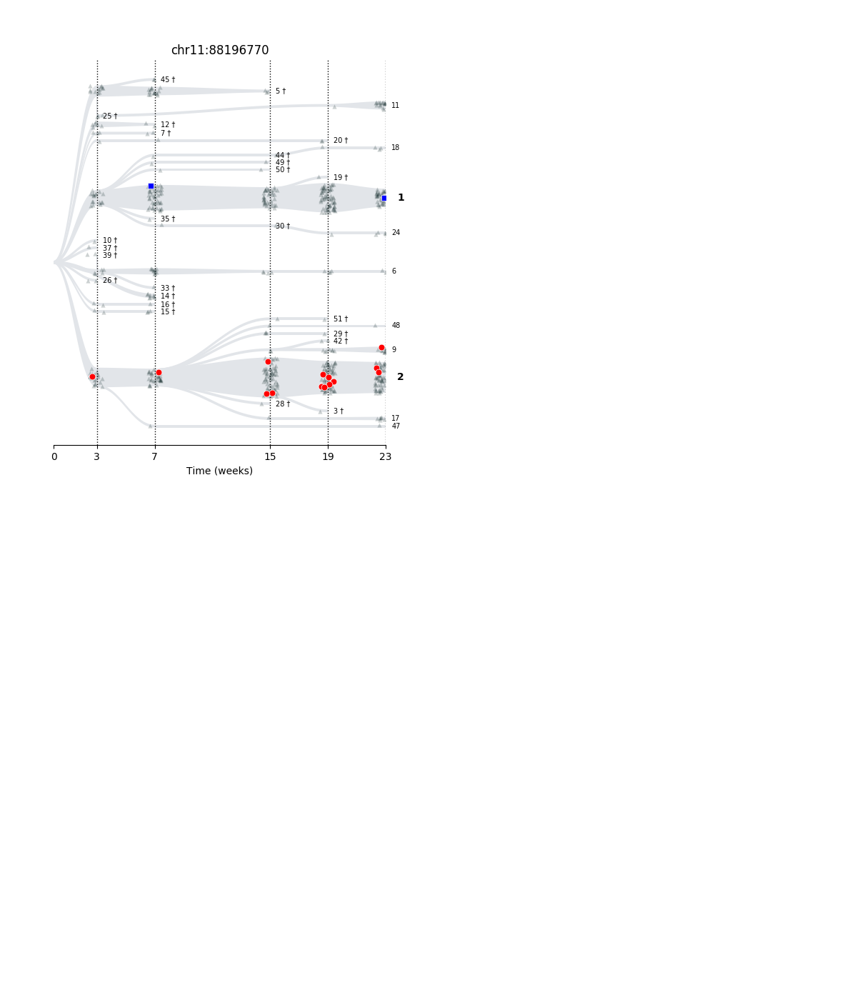

<IPython.core.display.Javascript object>


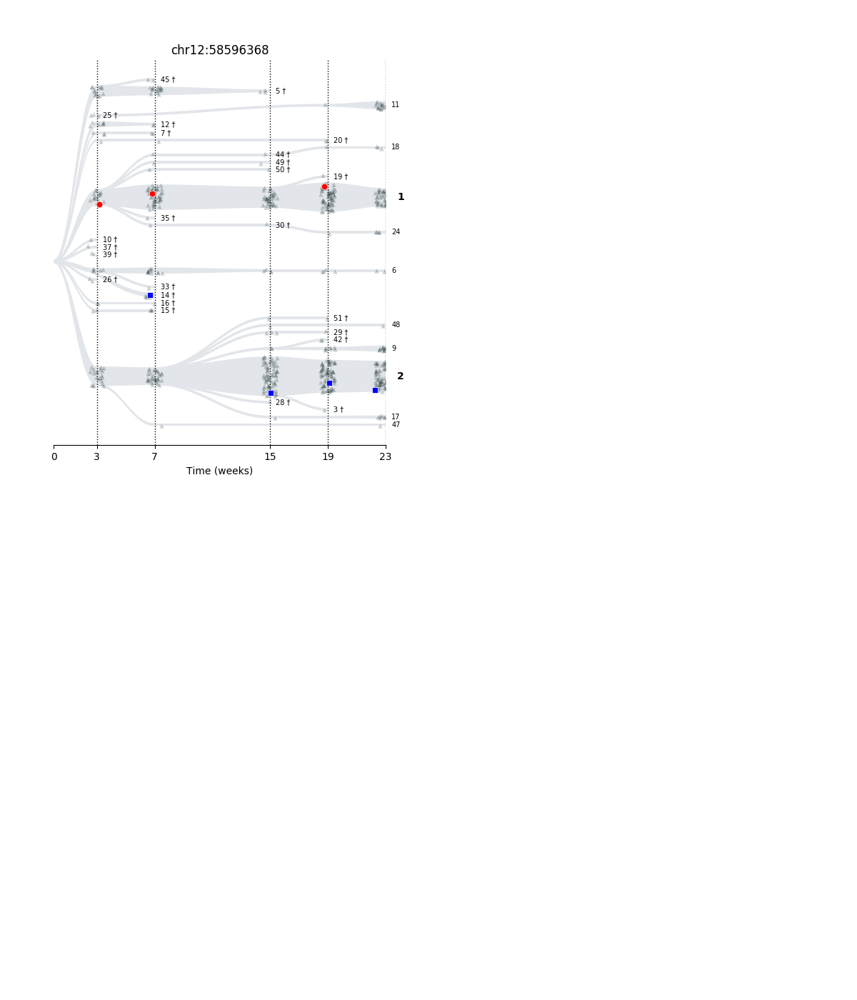

<IPython.core.display.Javascript object>


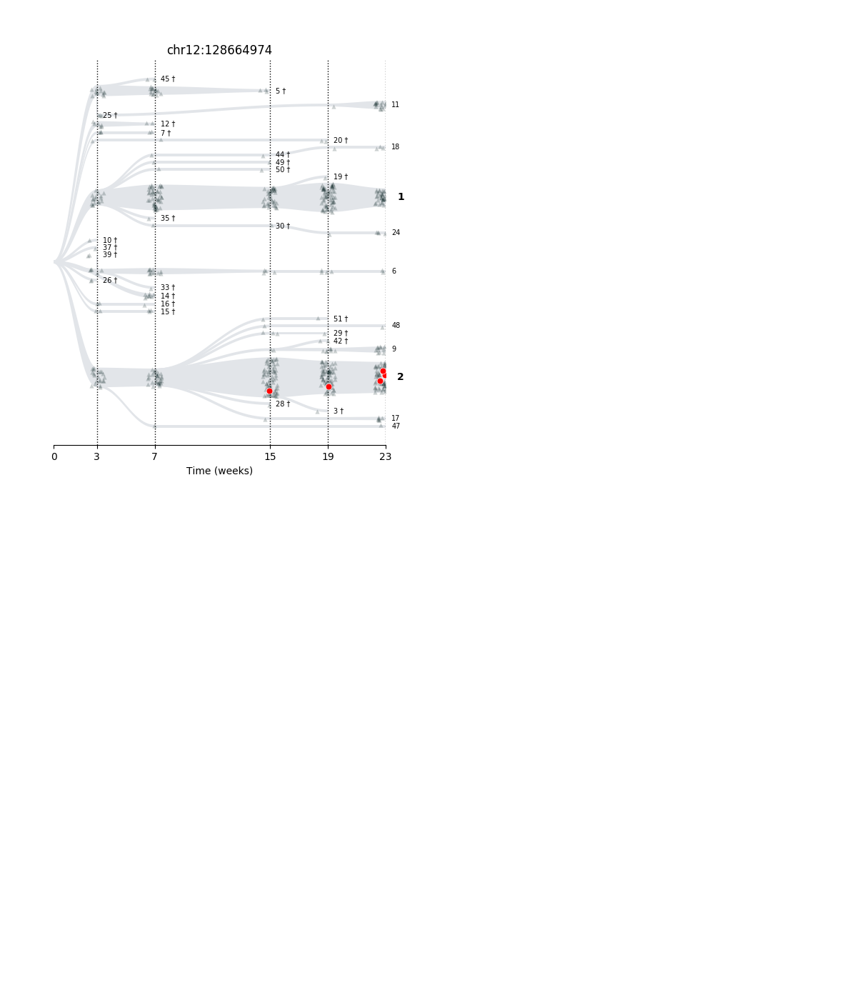

<IPython.core.display.Javascript object>


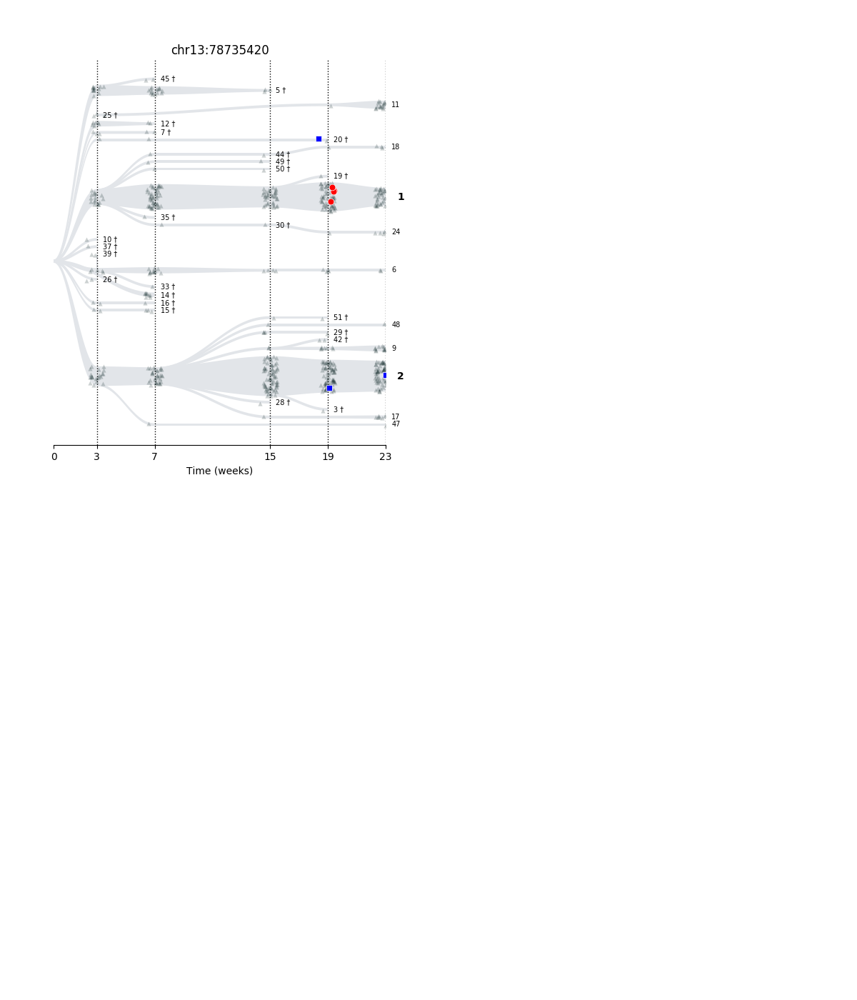

<IPython.core.display.Javascript object>


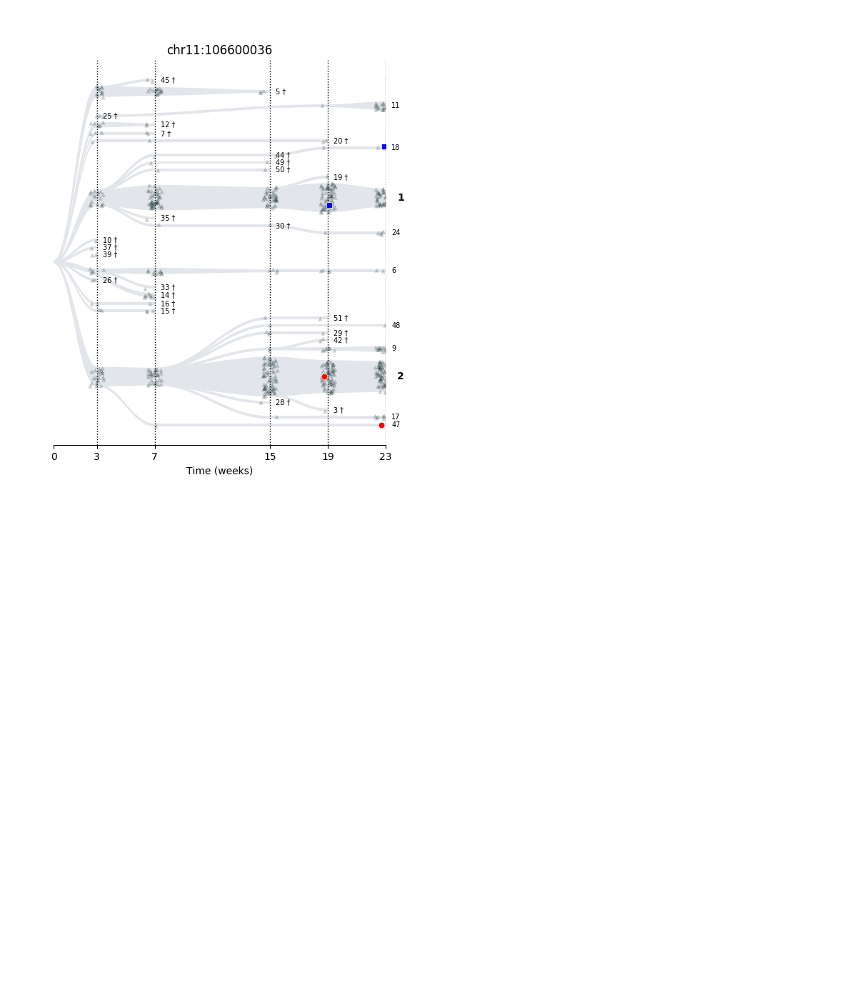

<IPython.core.display.Javascript object>


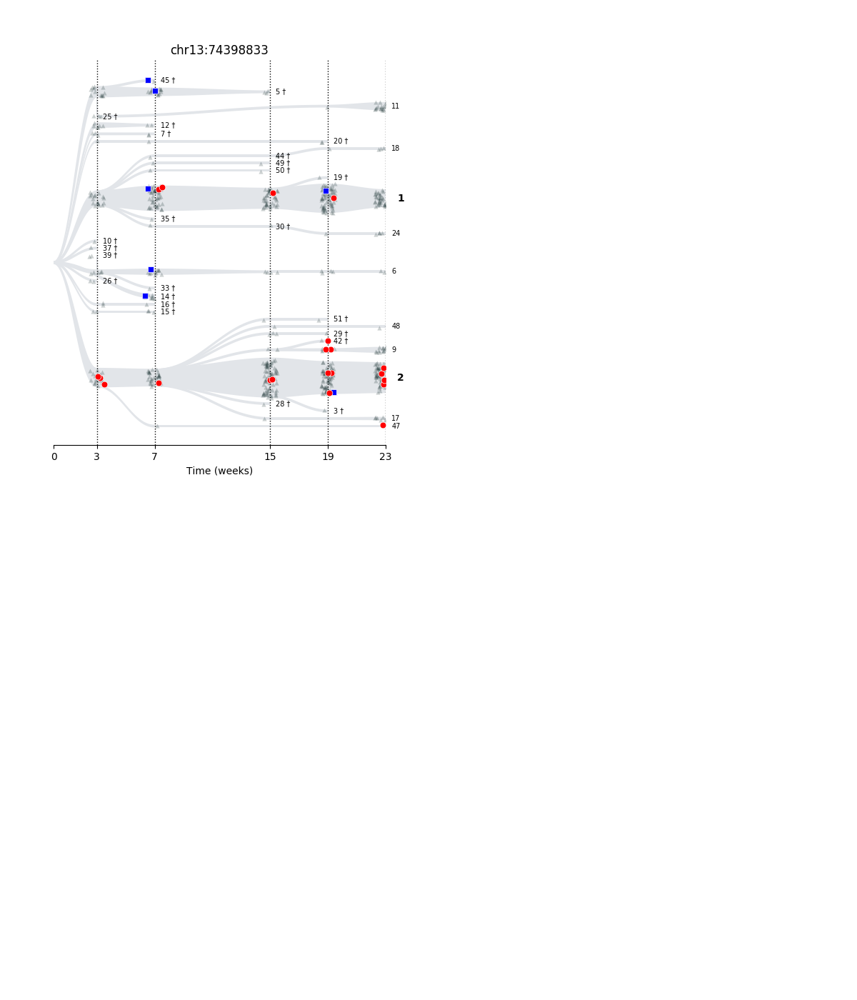

<IPython.core.display.Javascript object>


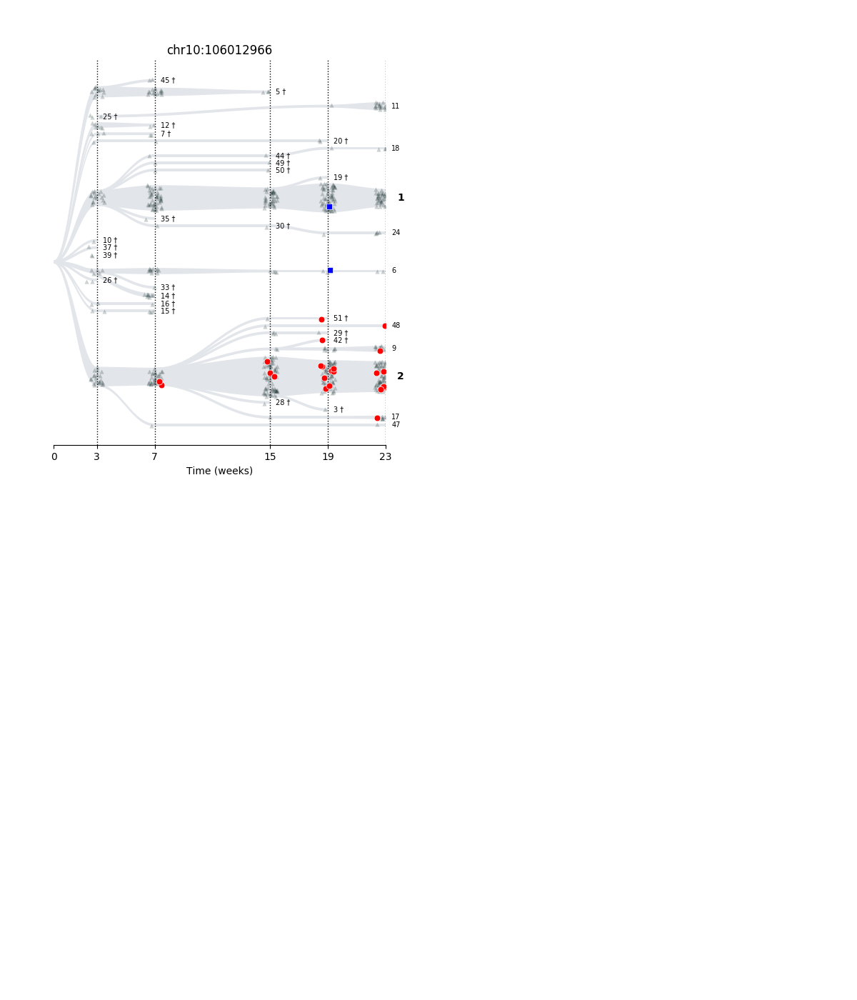

<IPython.core.display.Javascript object>


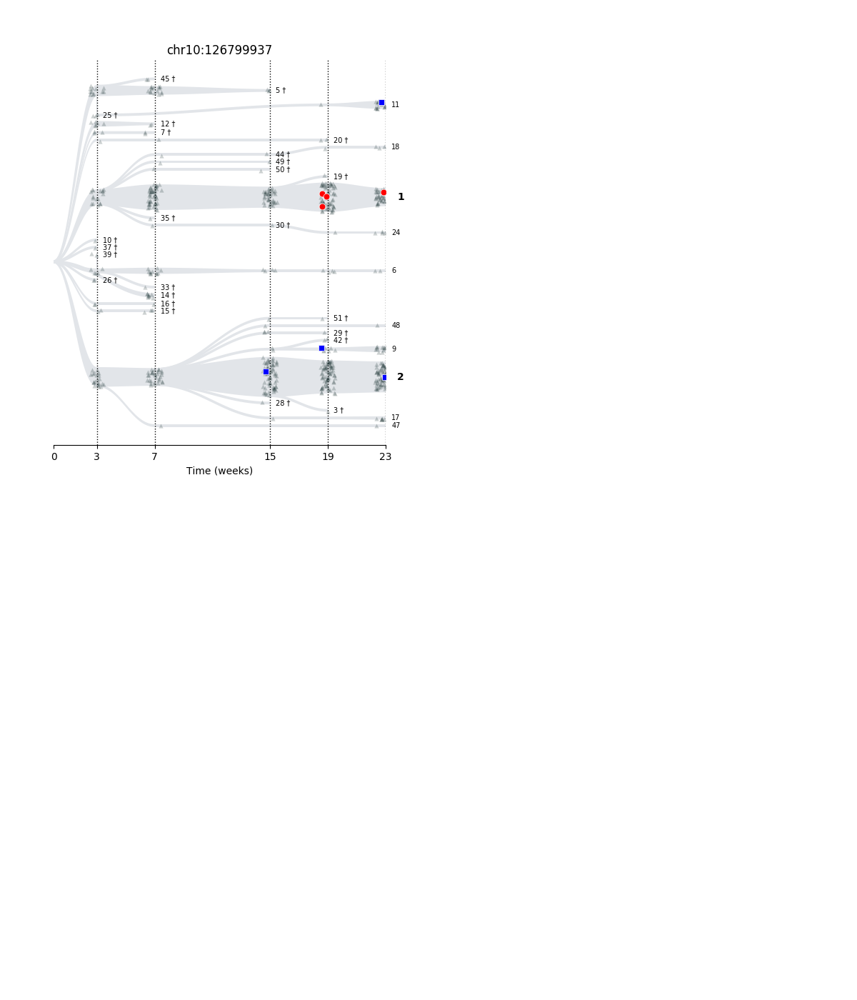

<IPython.core.display.Javascript object>


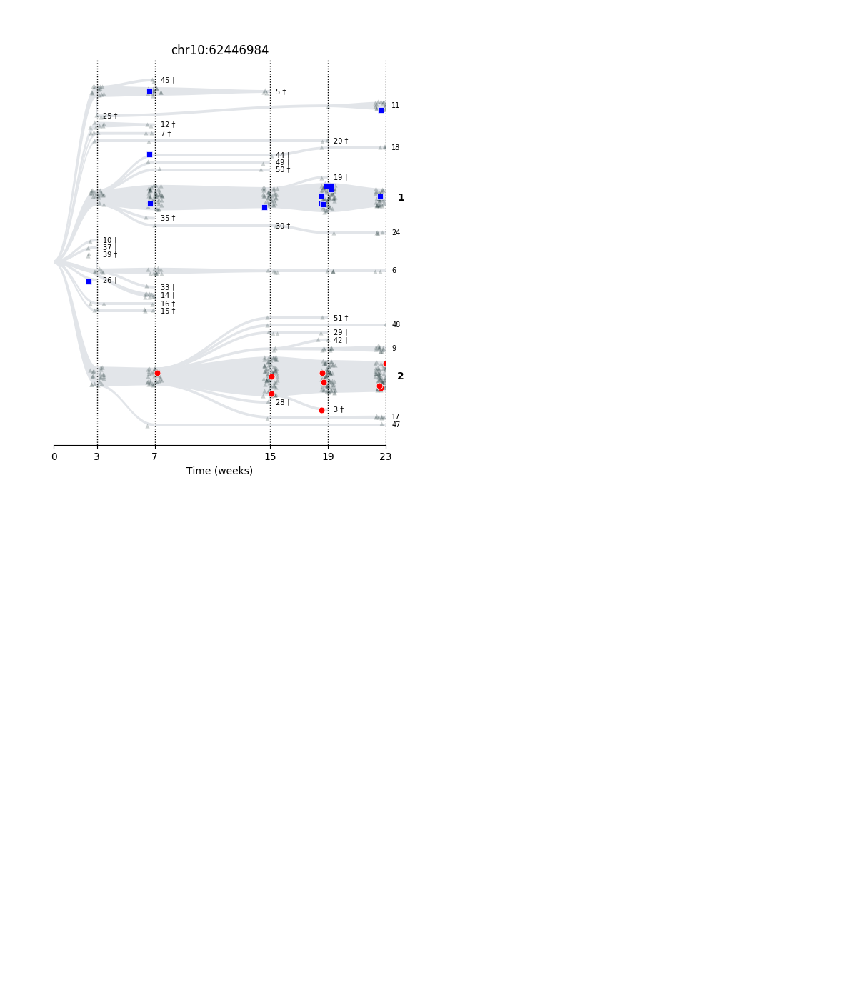

<IPython.core.display.Javascript object>


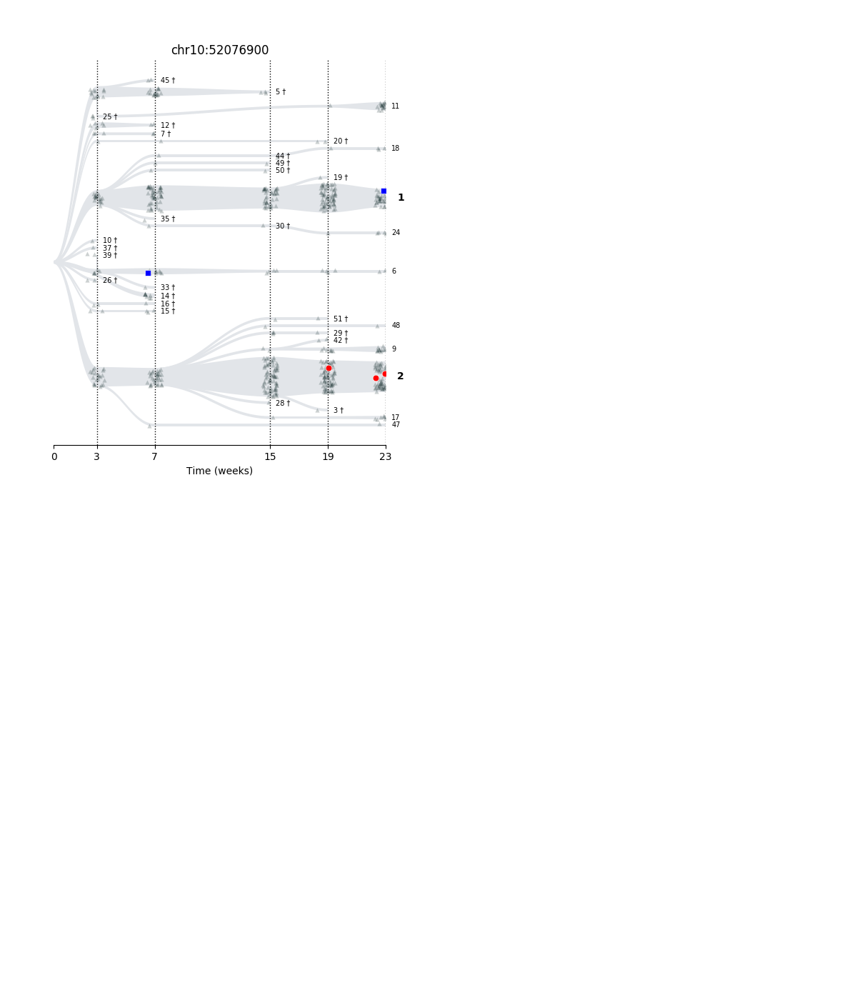

<IPython.core.display.Javascript object>


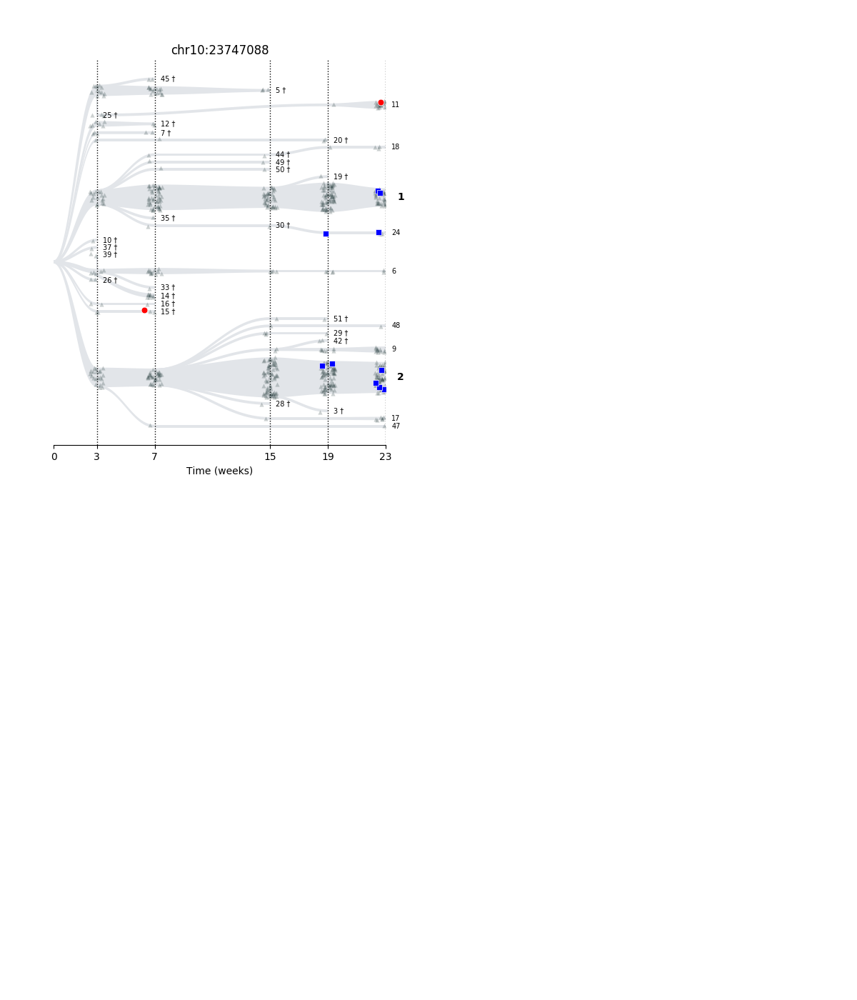

<IPython.core.display.Javascript object>


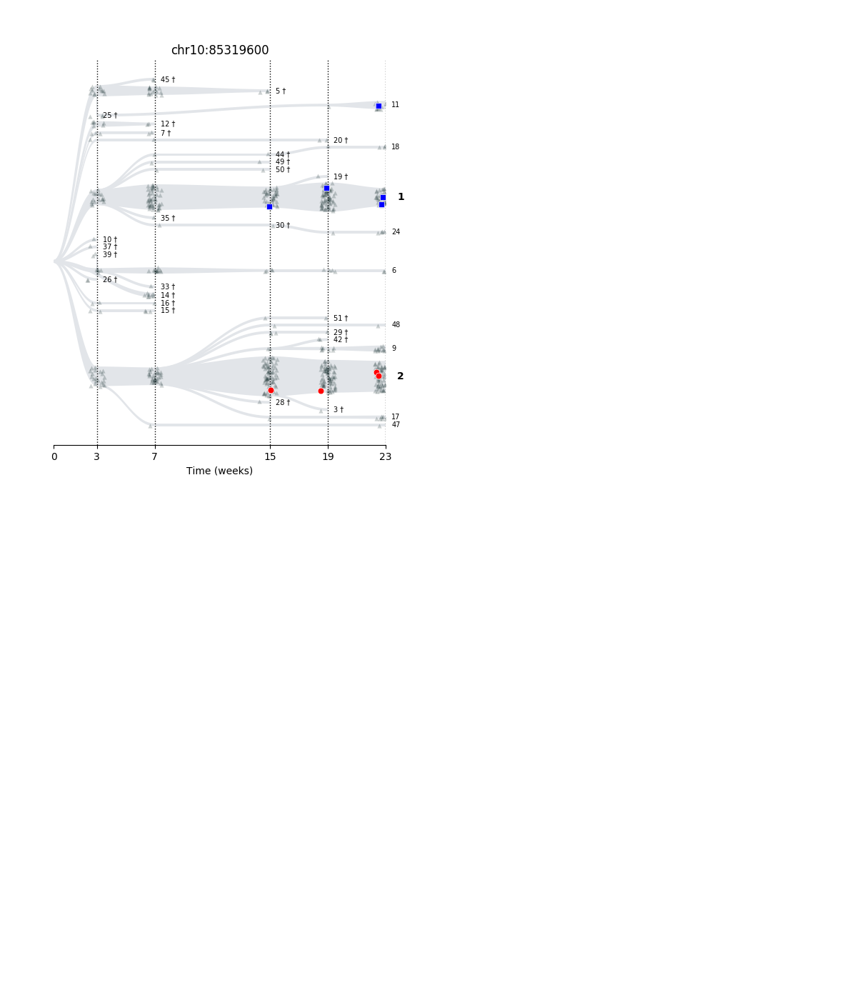

<IPython.core.display.Javascript object>


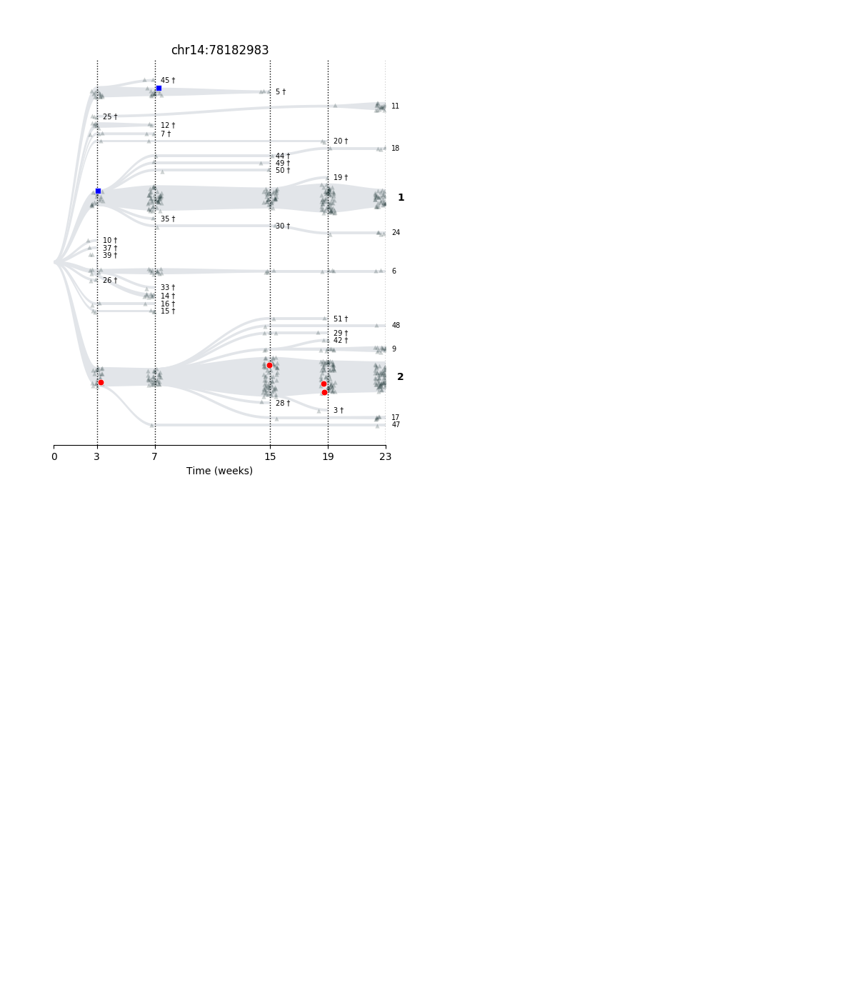

<IPython.core.display.Javascript object>


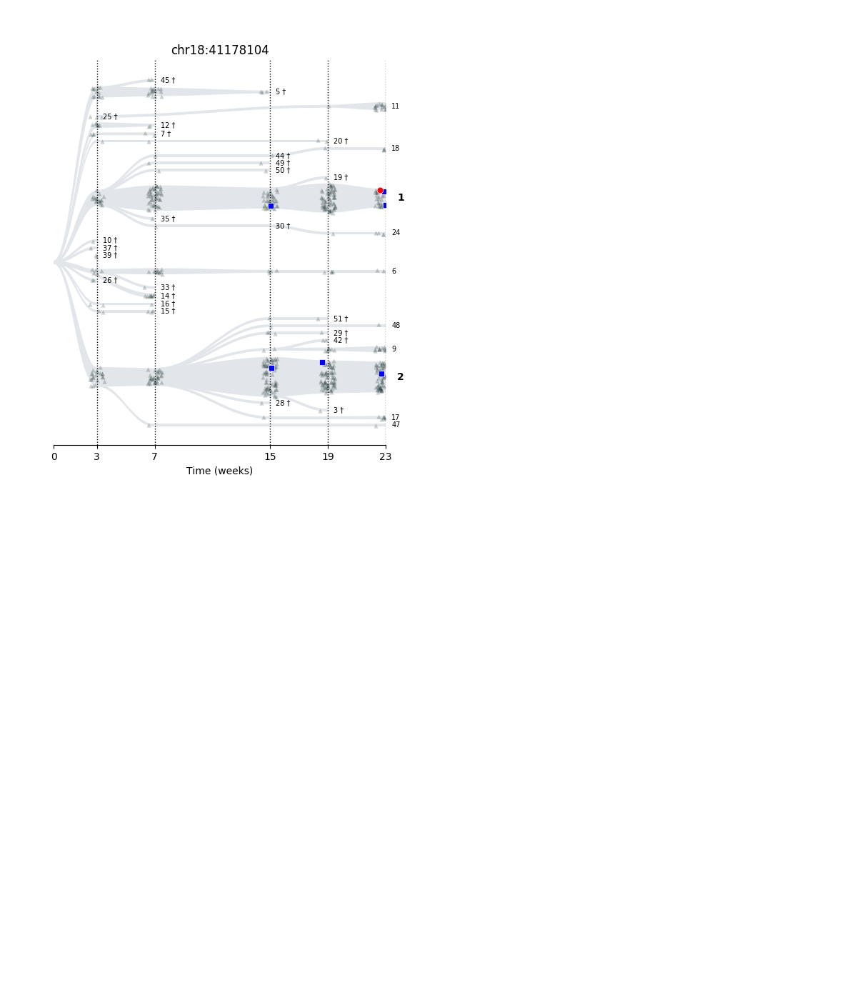

<IPython.core.display.Javascript object>


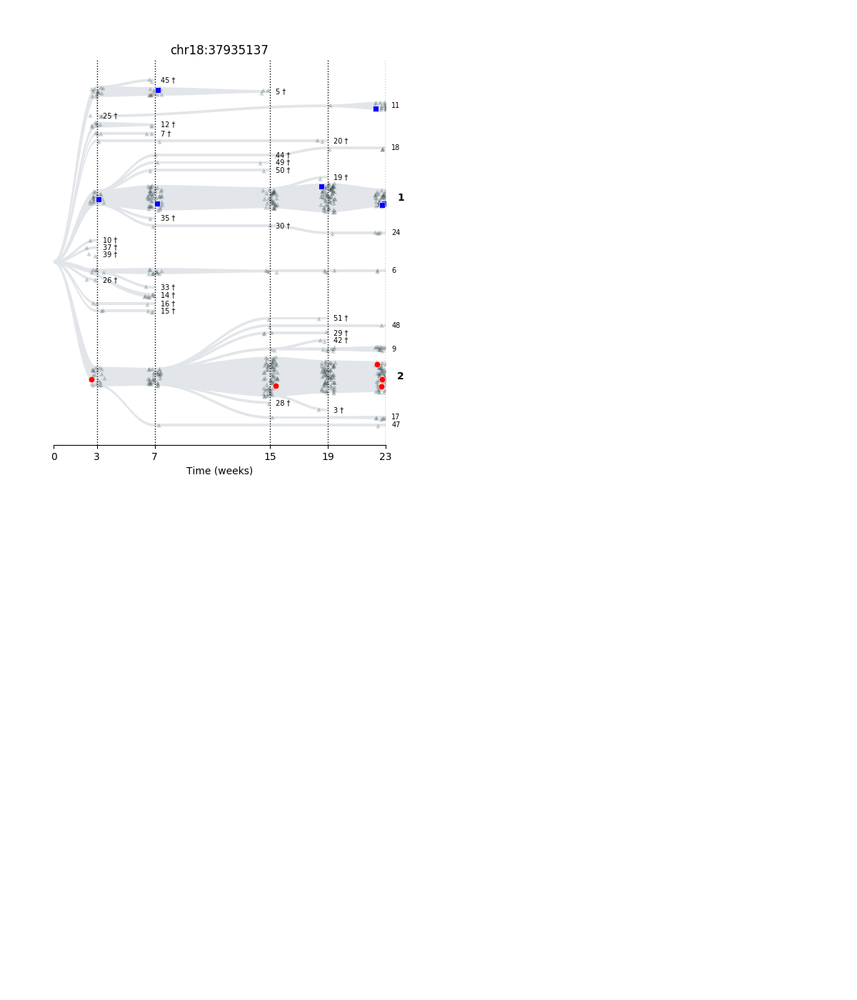

<IPython.core.display.Javascript object>


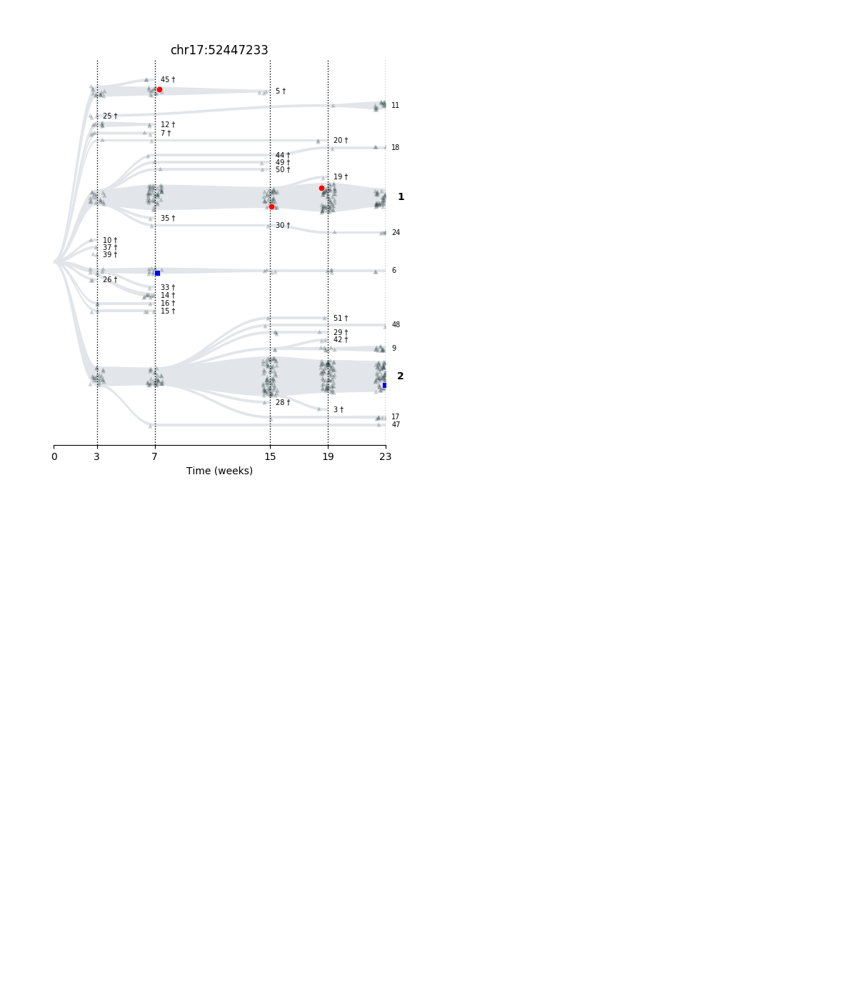

<IPython.core.display.Javascript object>


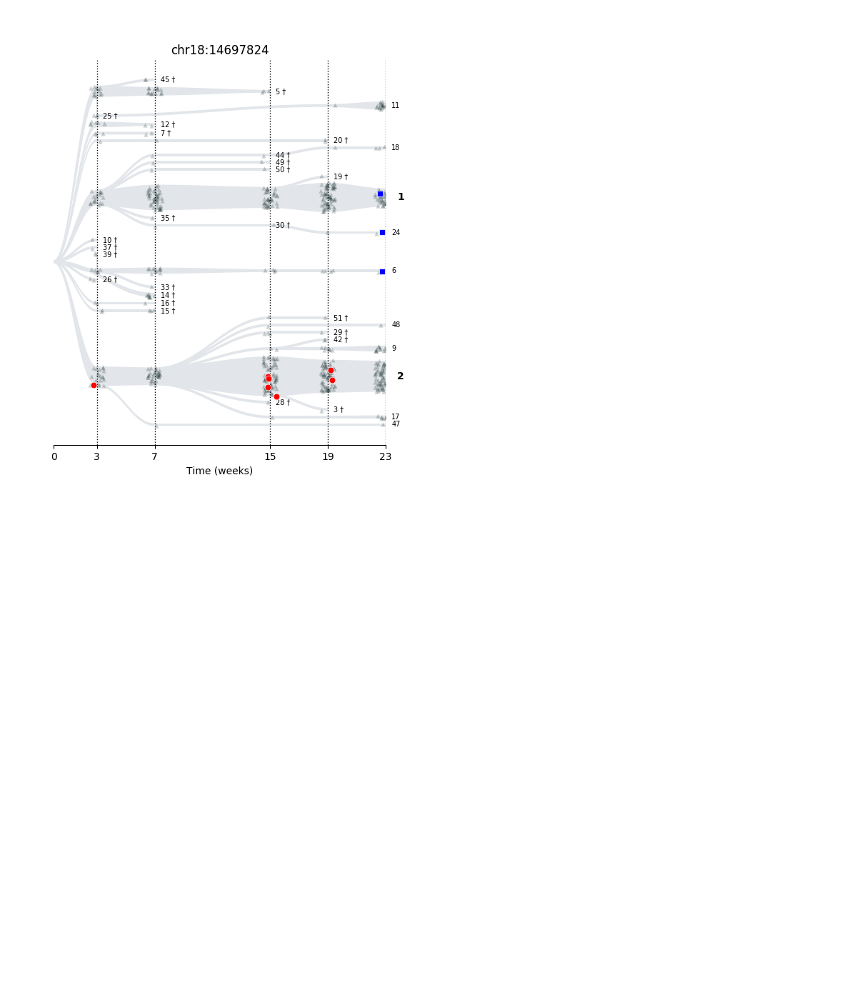

<IPython.core.display.Javascript object>


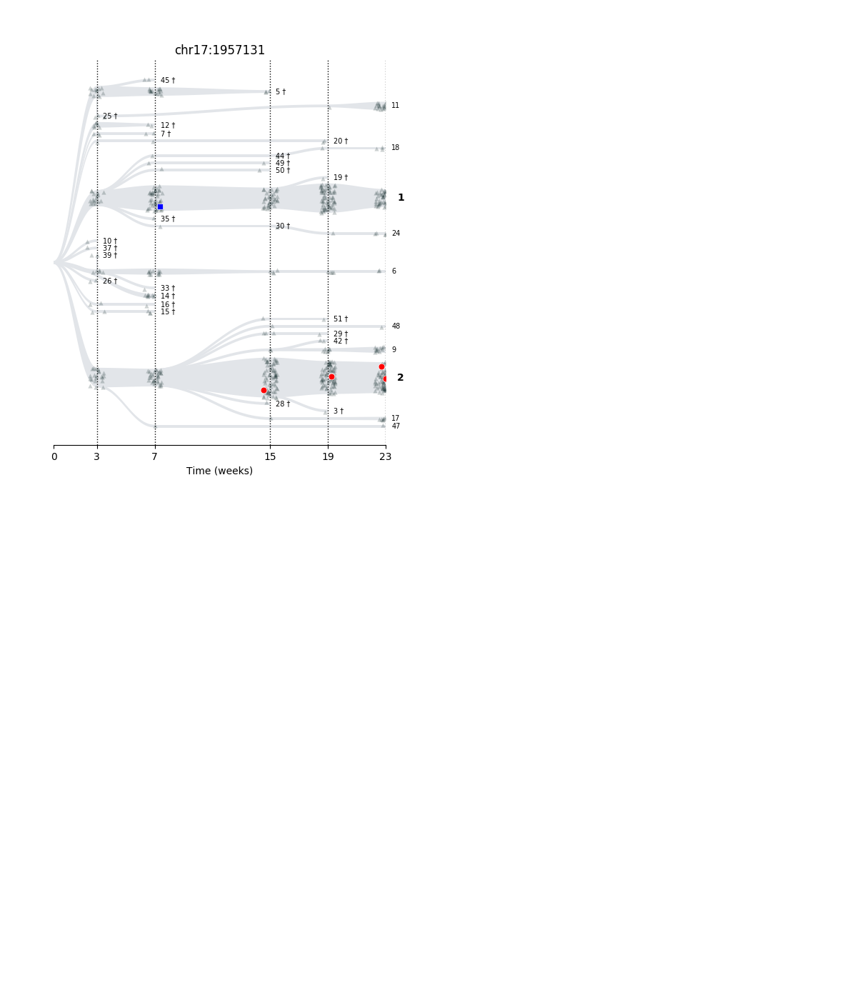

<IPython.core.display.Javascript object>


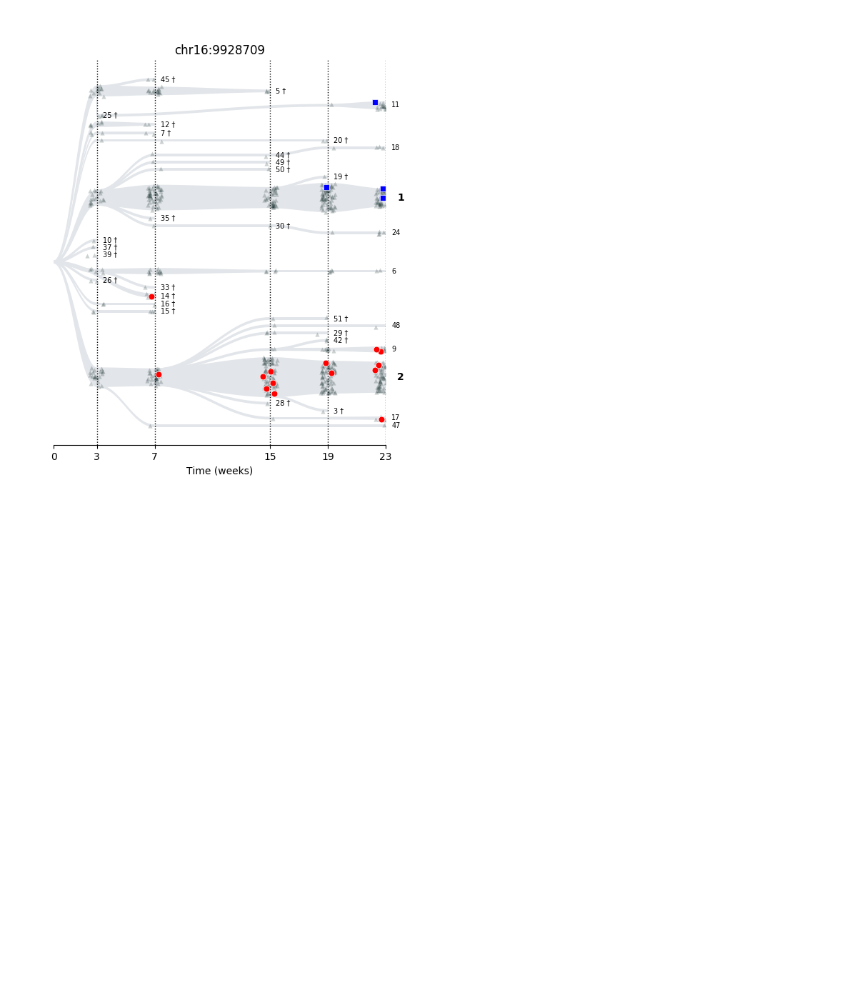

<IPython.core.display.Javascript object>


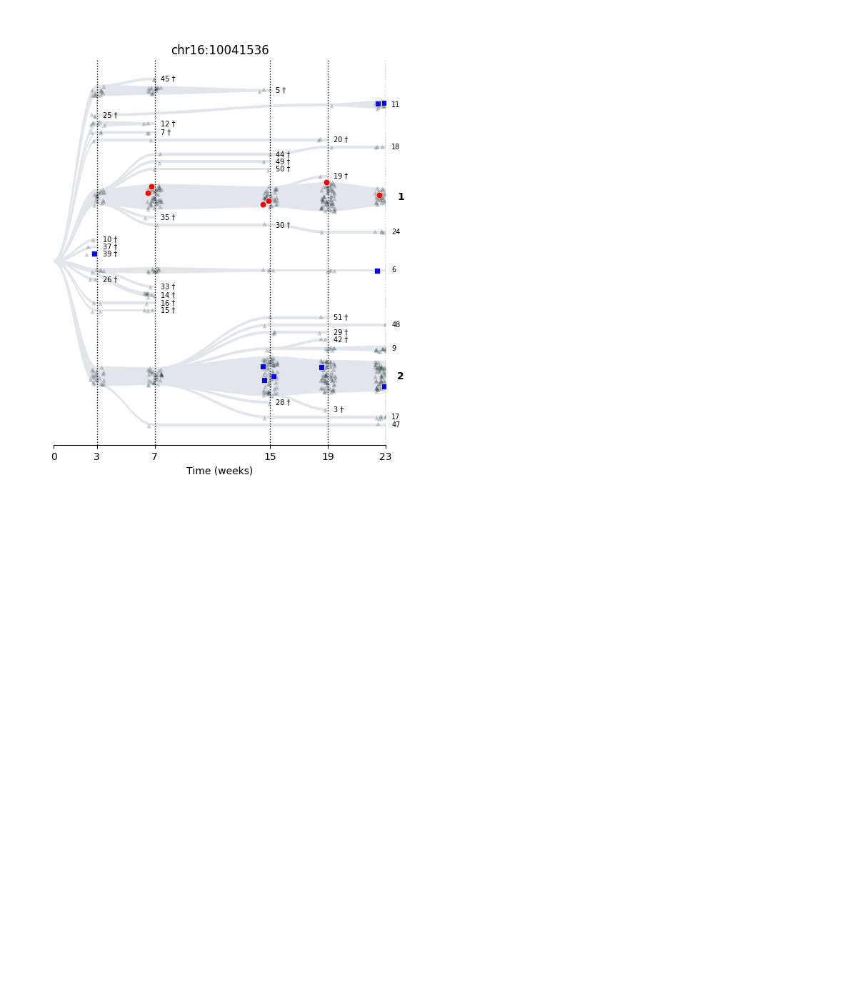

<IPython.core.display.Javascript object>


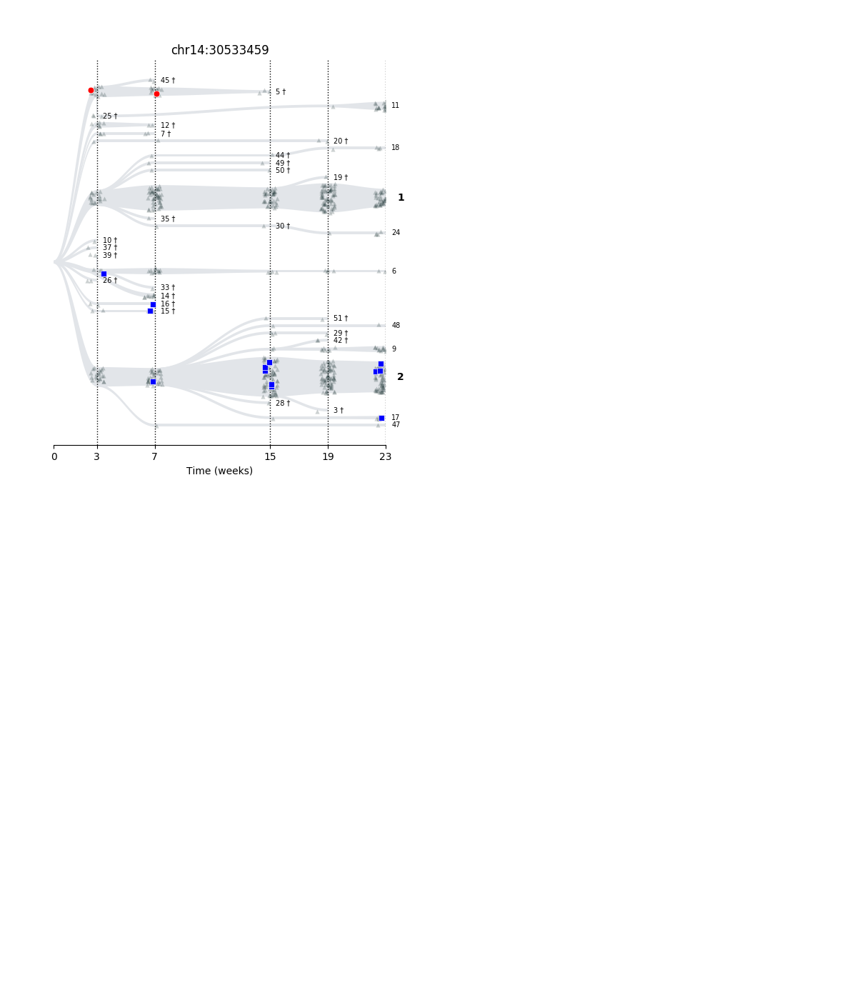

<IPython.core.display.Javascript object>


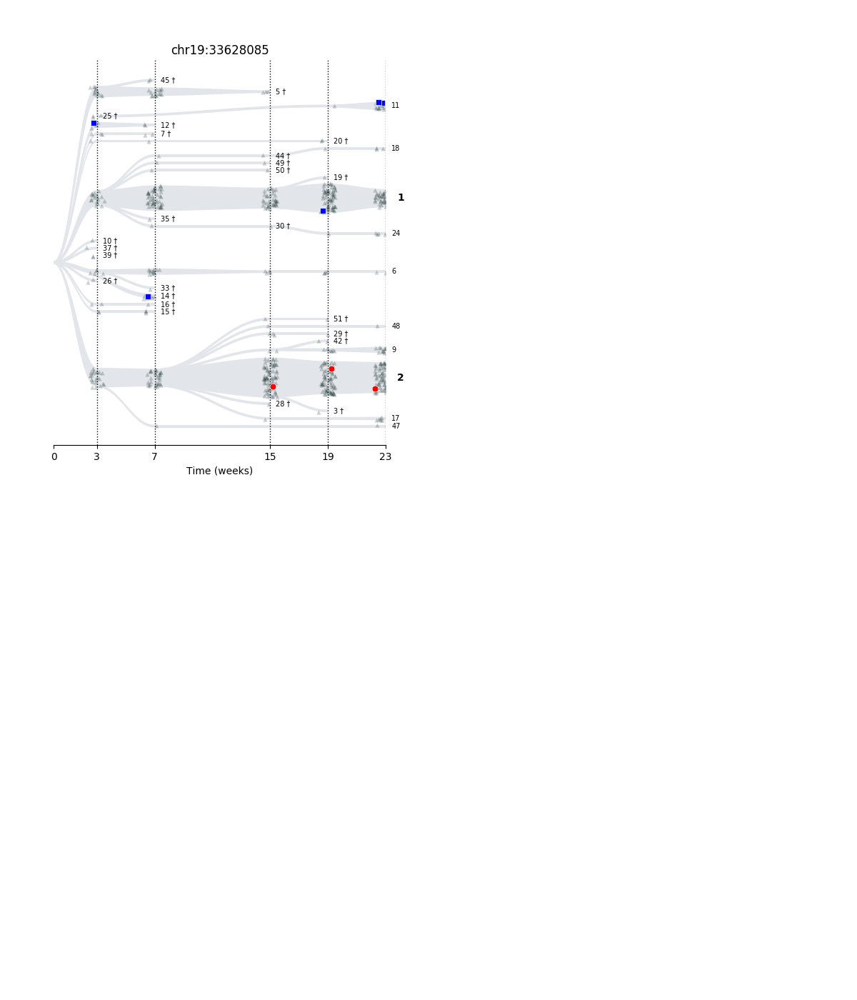

<IPython.core.display.Javascript object>


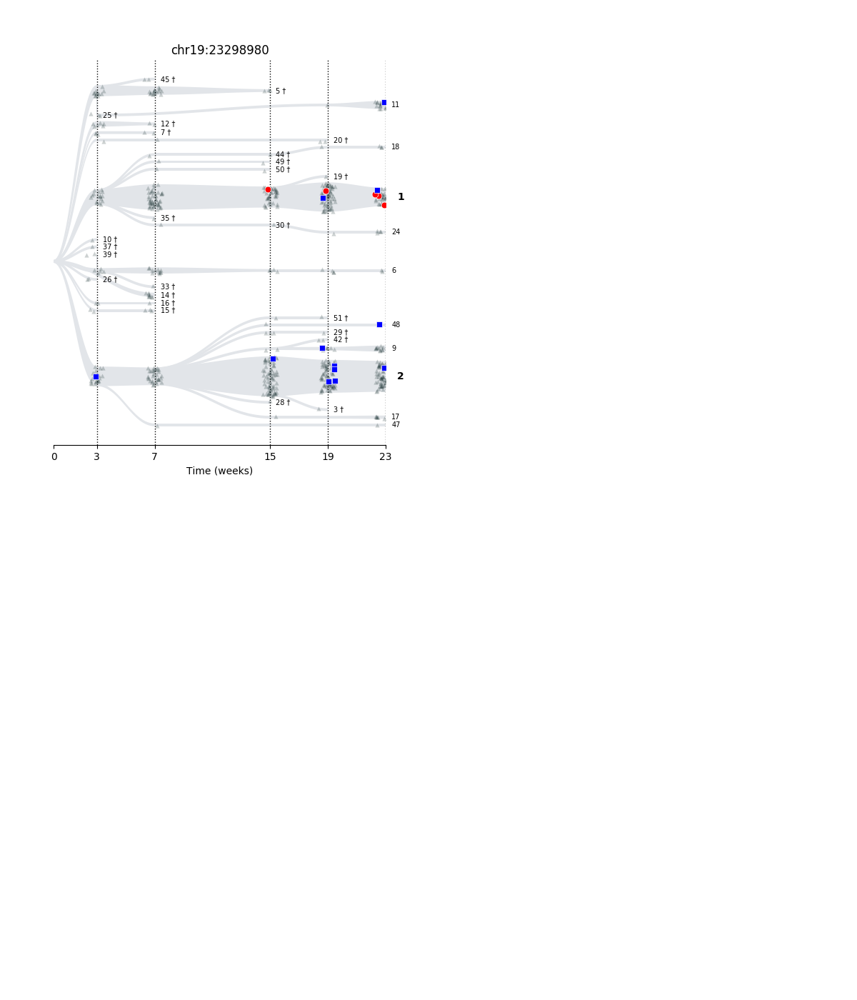

<IPython.core.display.Javascript object>


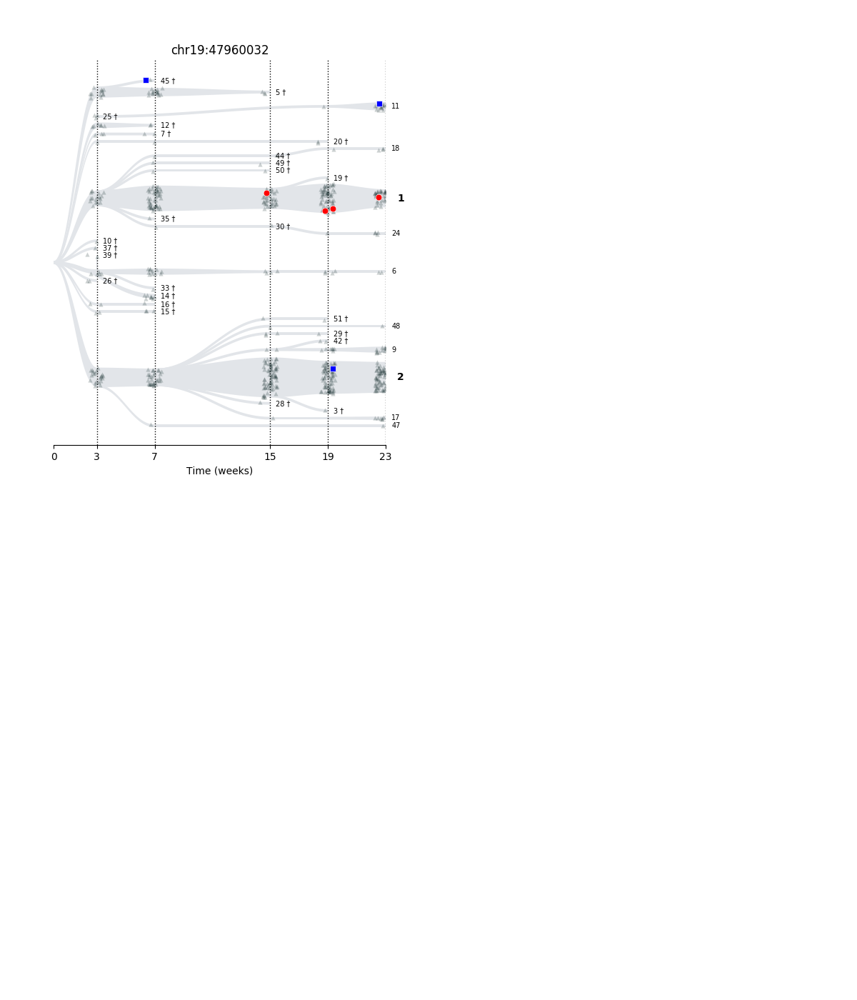

<IPython.core.display.Javascript object>


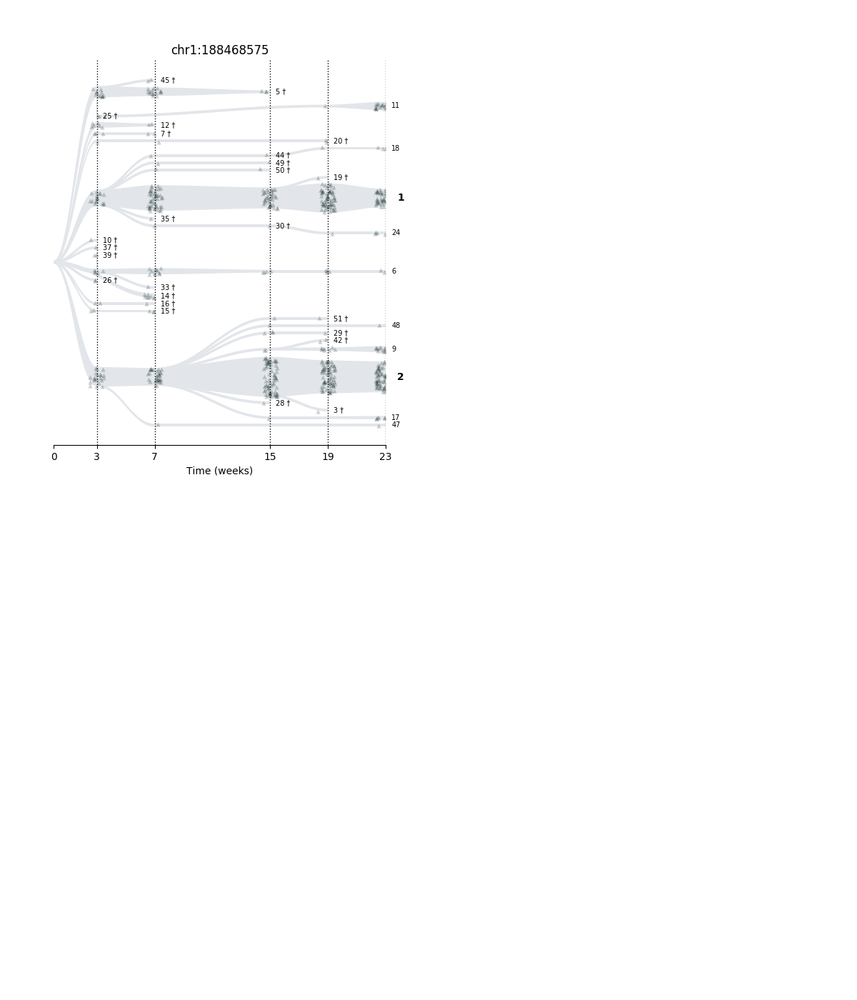

<IPython.core.display.Javascript object>


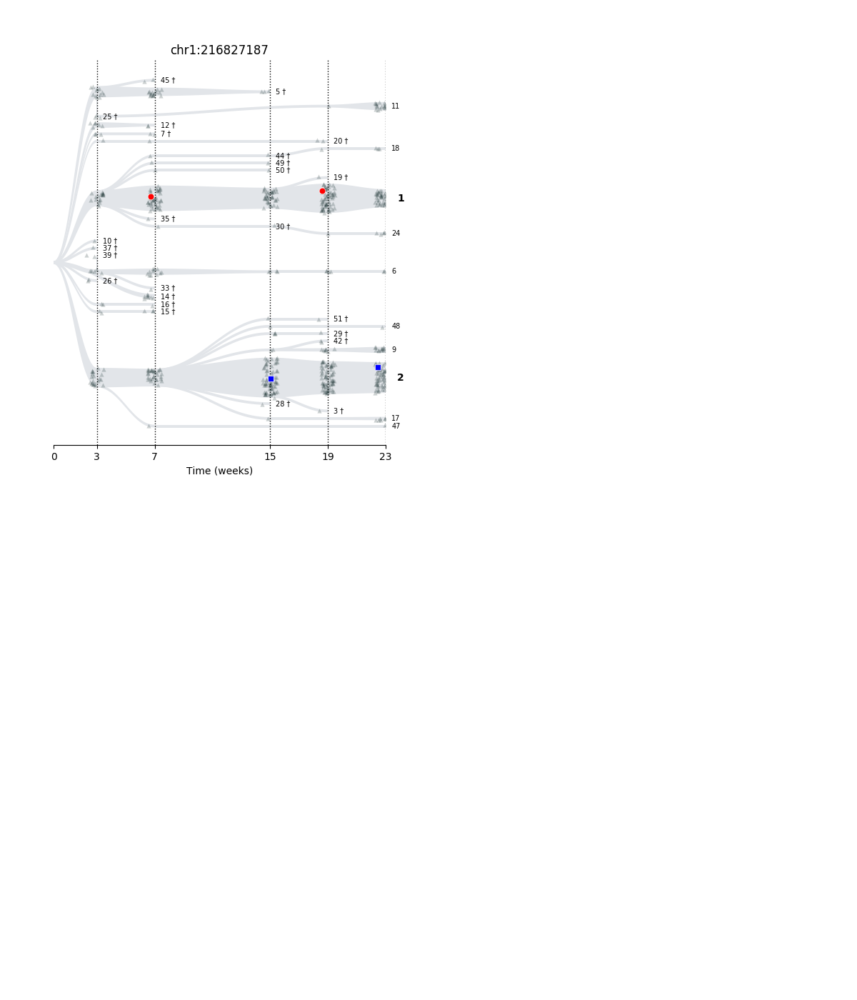

<IPython.core.display.Javascript object>


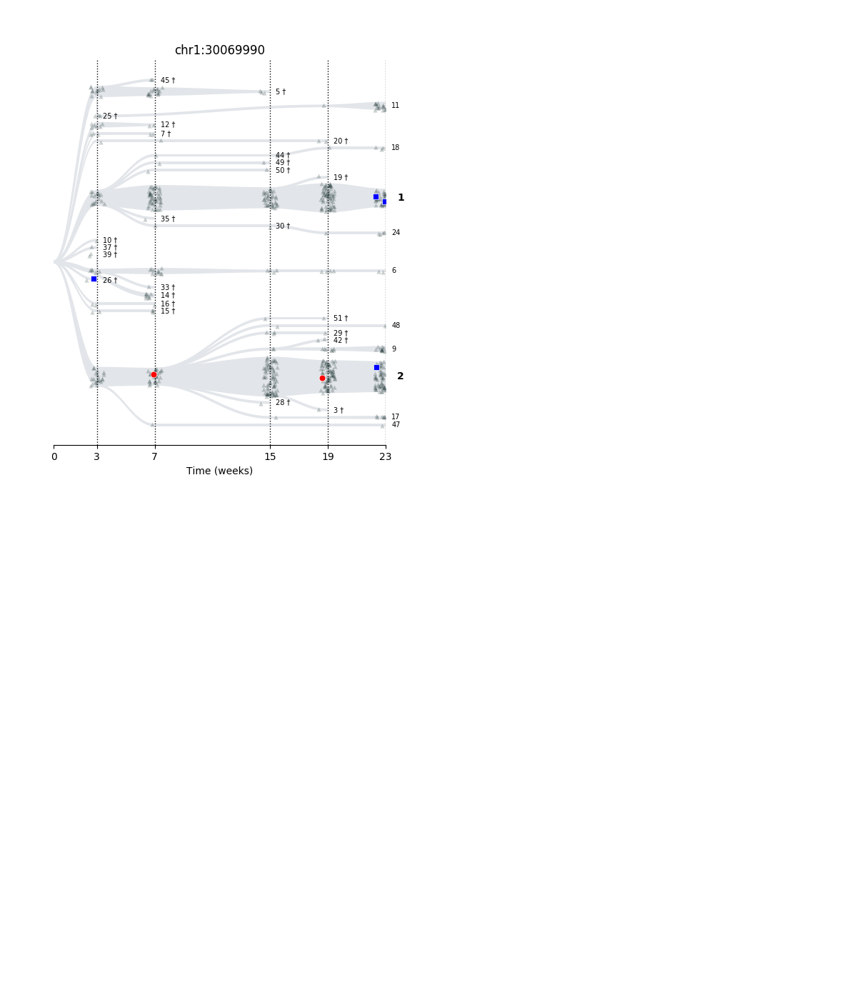

<IPython.core.display.Javascript object>


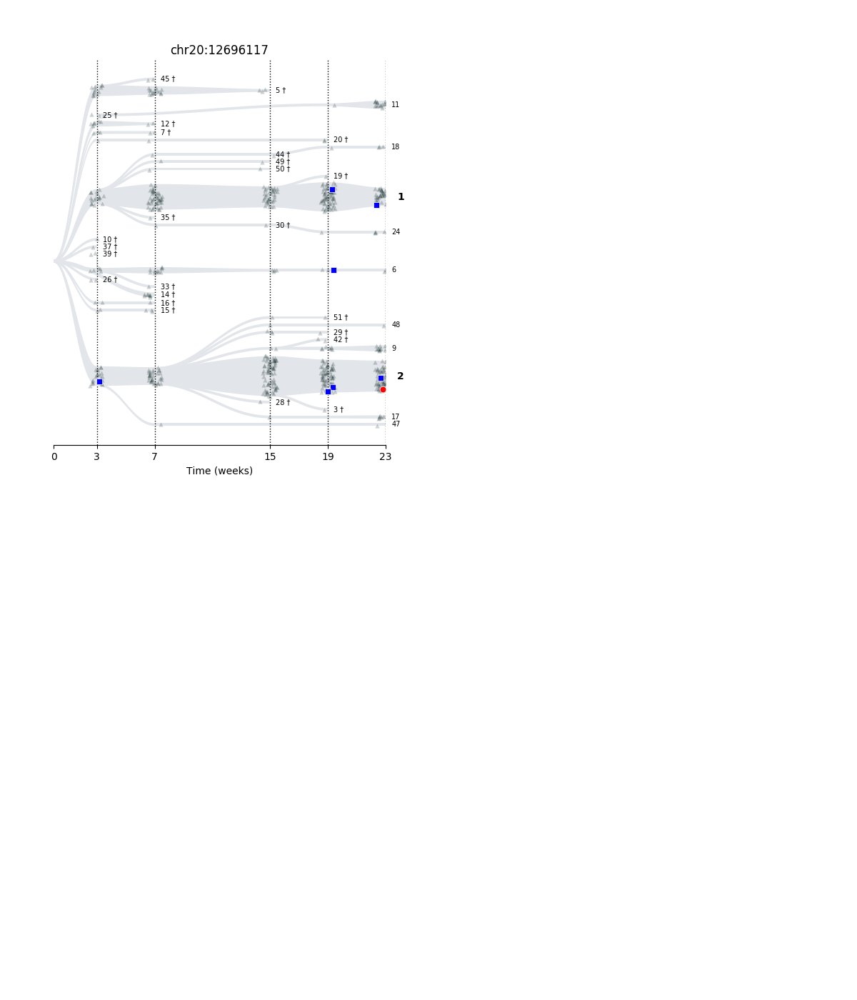

<IPython.core.display.Javascript object>


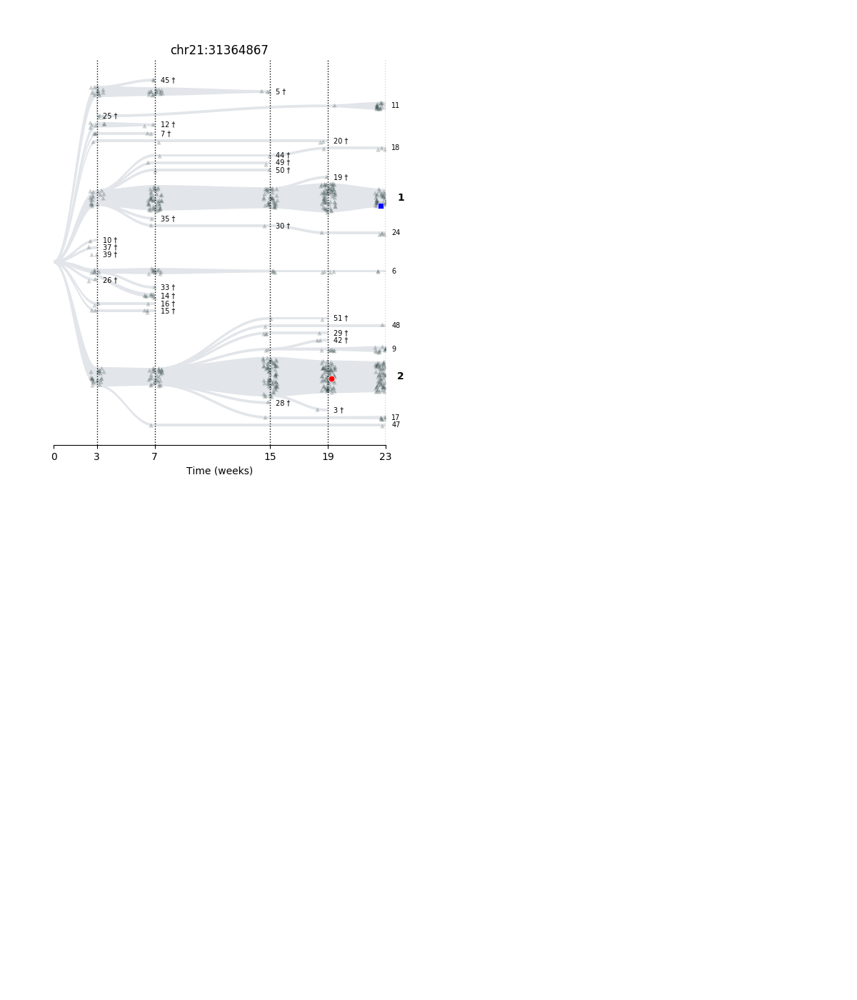

<IPython.core.display.Javascript object>


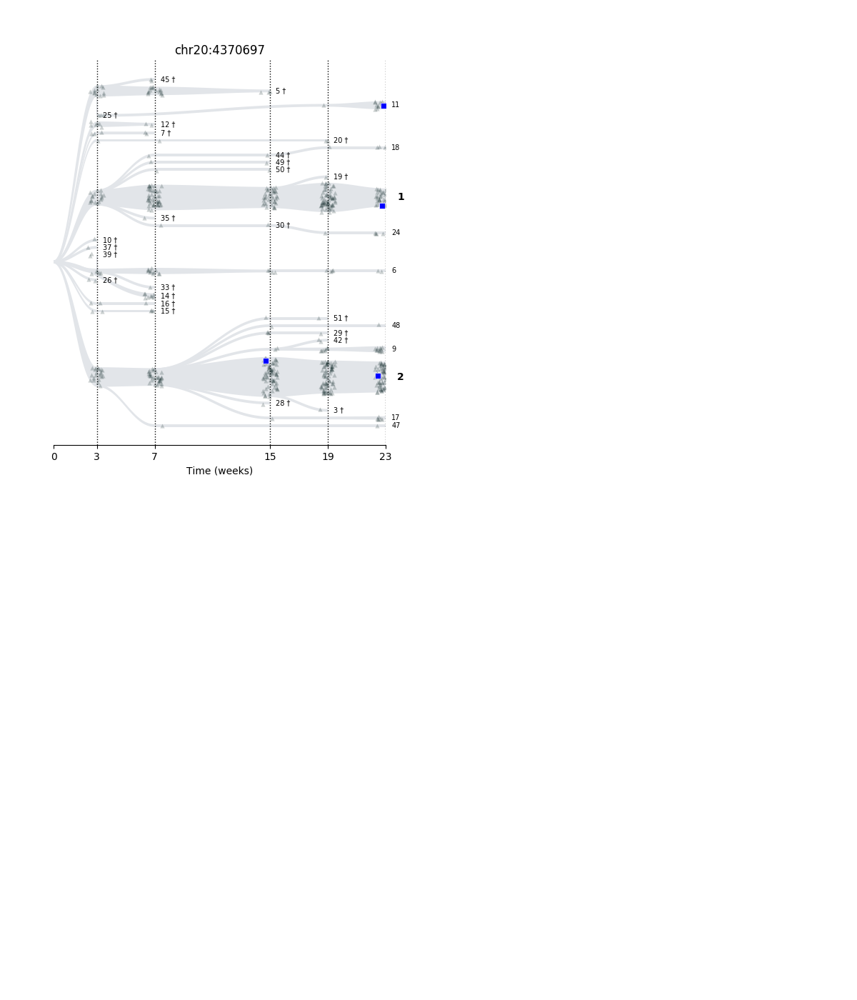

<IPython.core.display.Javascript object>


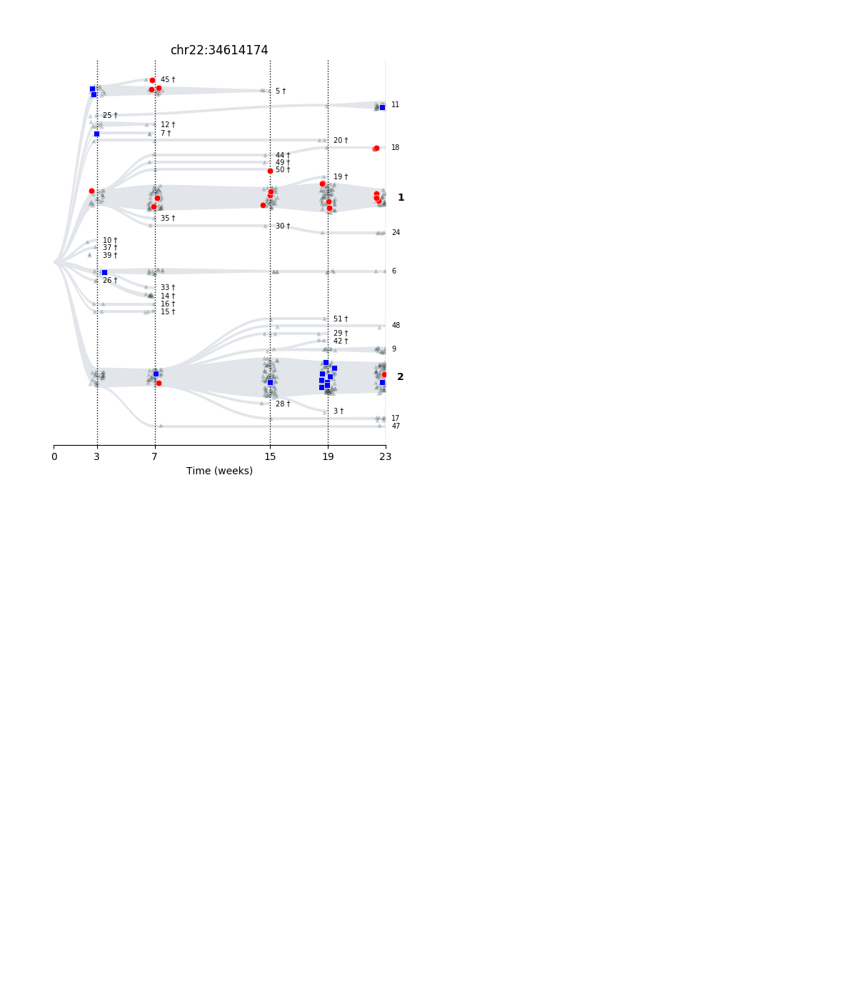

<IPython.core.display.Javascript object>


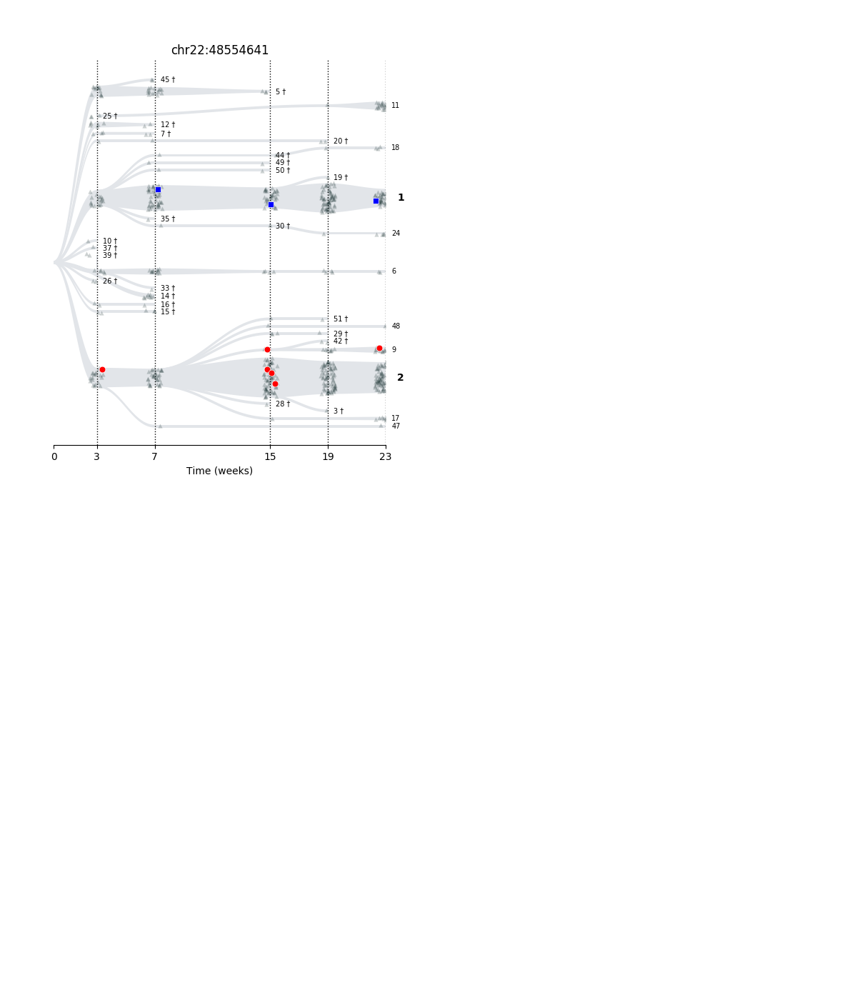

<IPython.core.display.Javascript object>


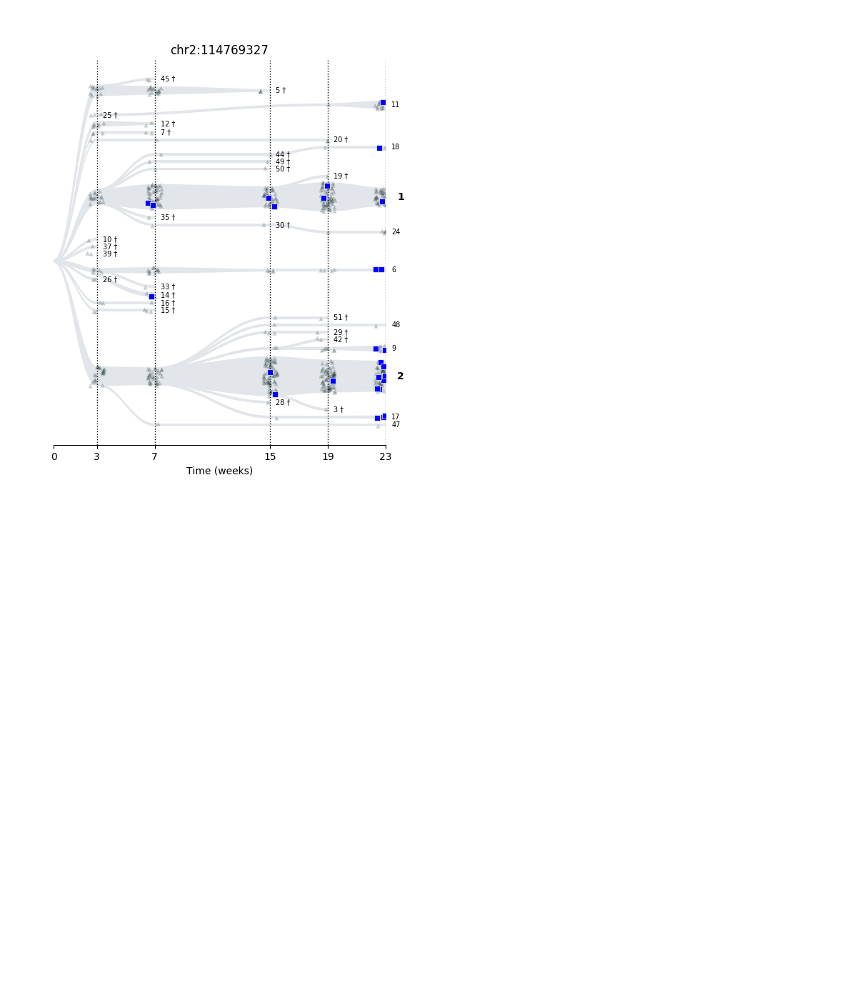

<IPython.core.display.Javascript object>


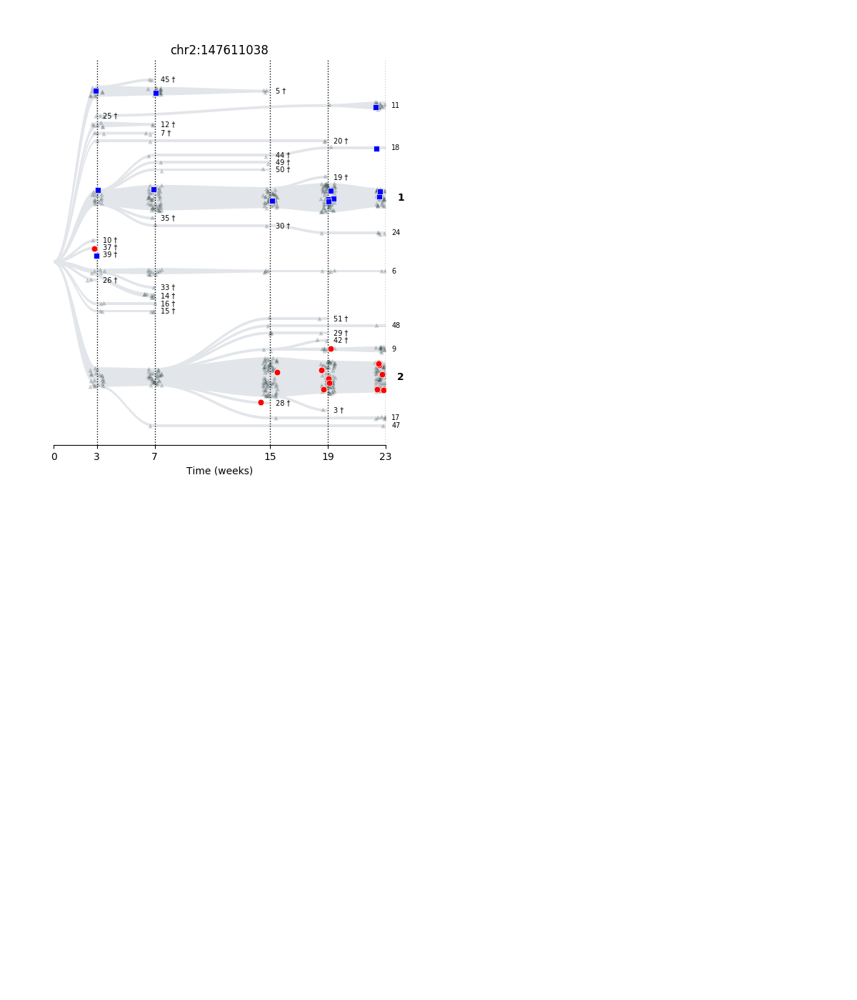

<IPython.core.display.Javascript object>


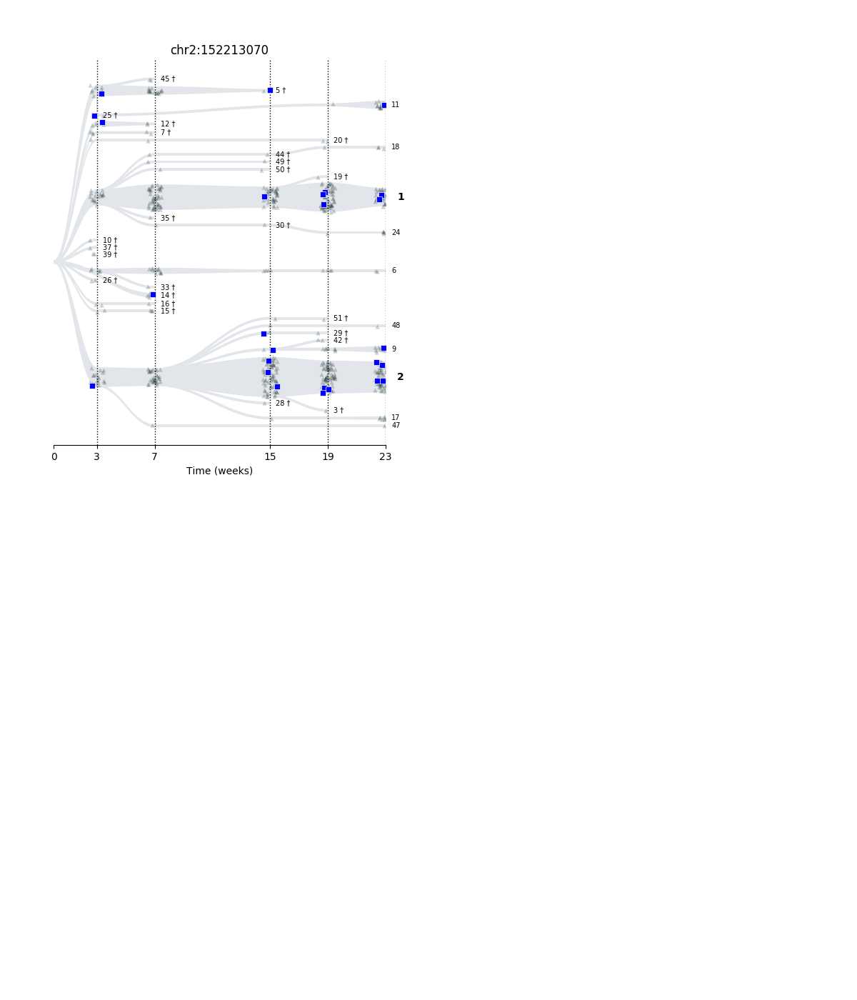

<IPython.core.display.Javascript object>


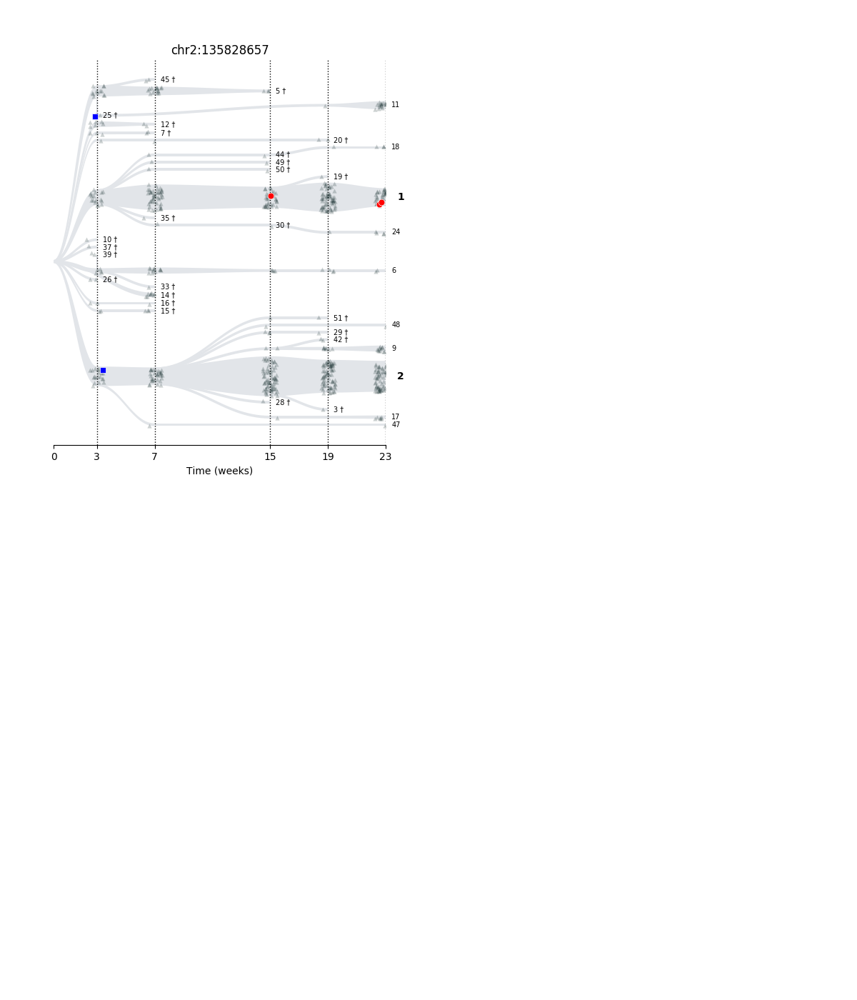

<IPython.core.display.Javascript object>


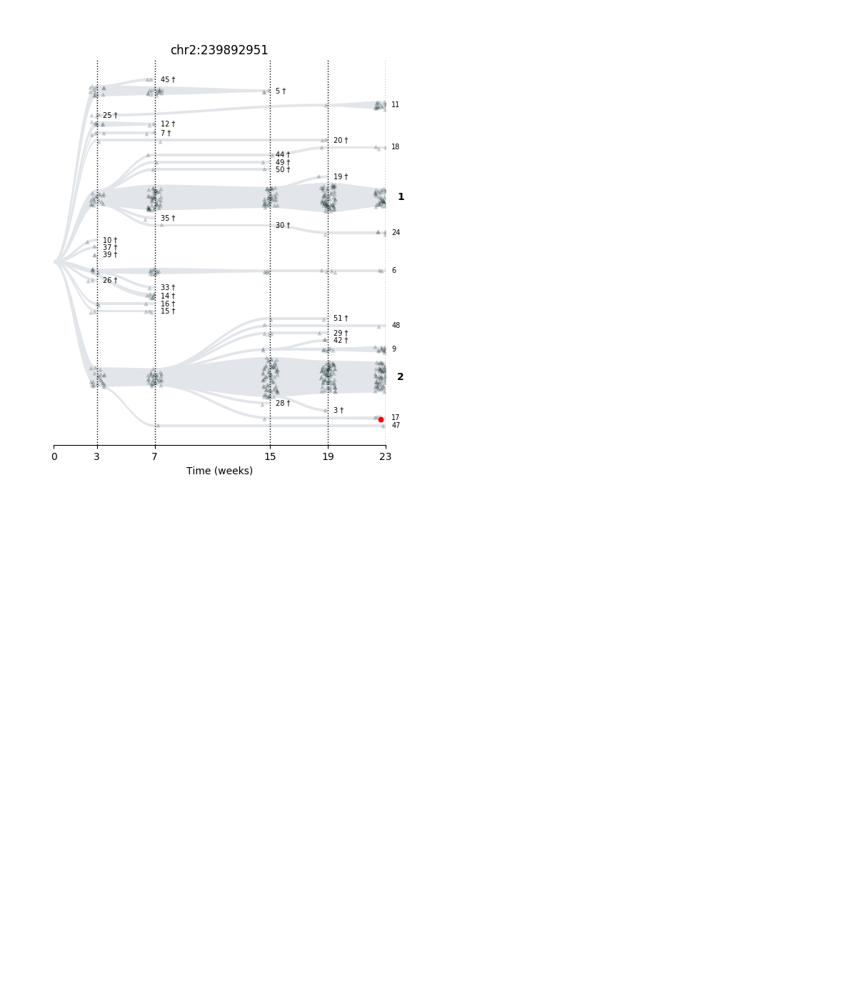

<IPython.core.display.Javascript object>


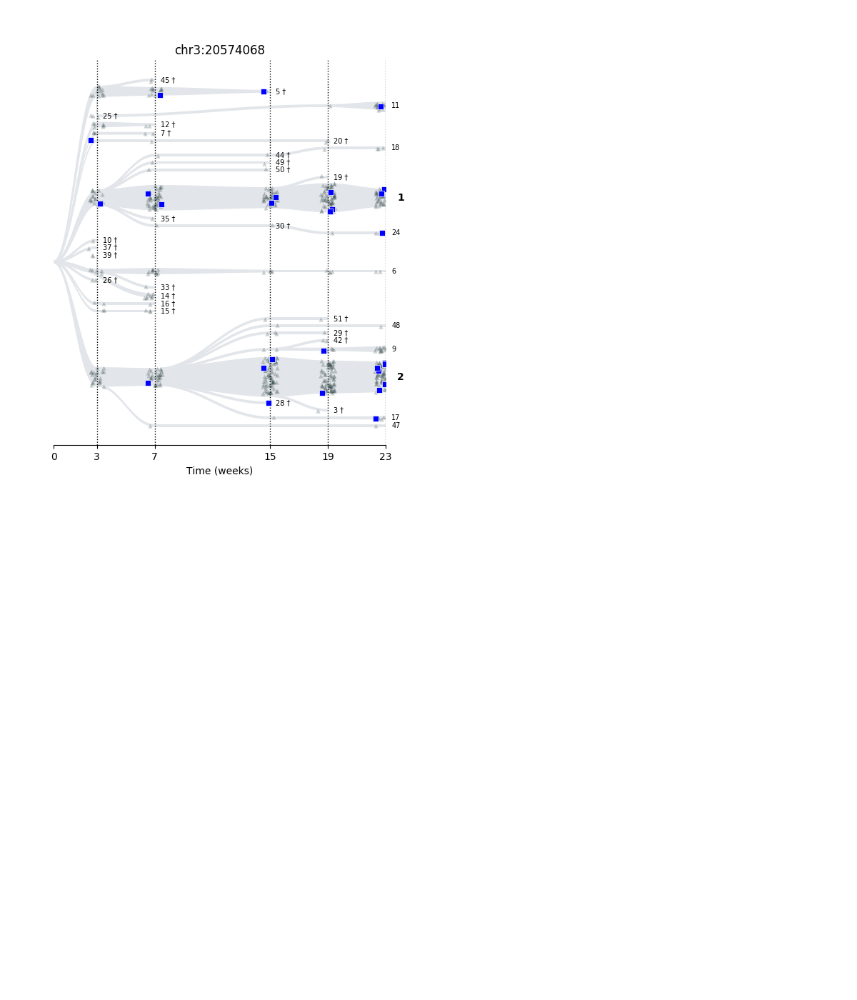

<IPython.core.display.Javascript object>


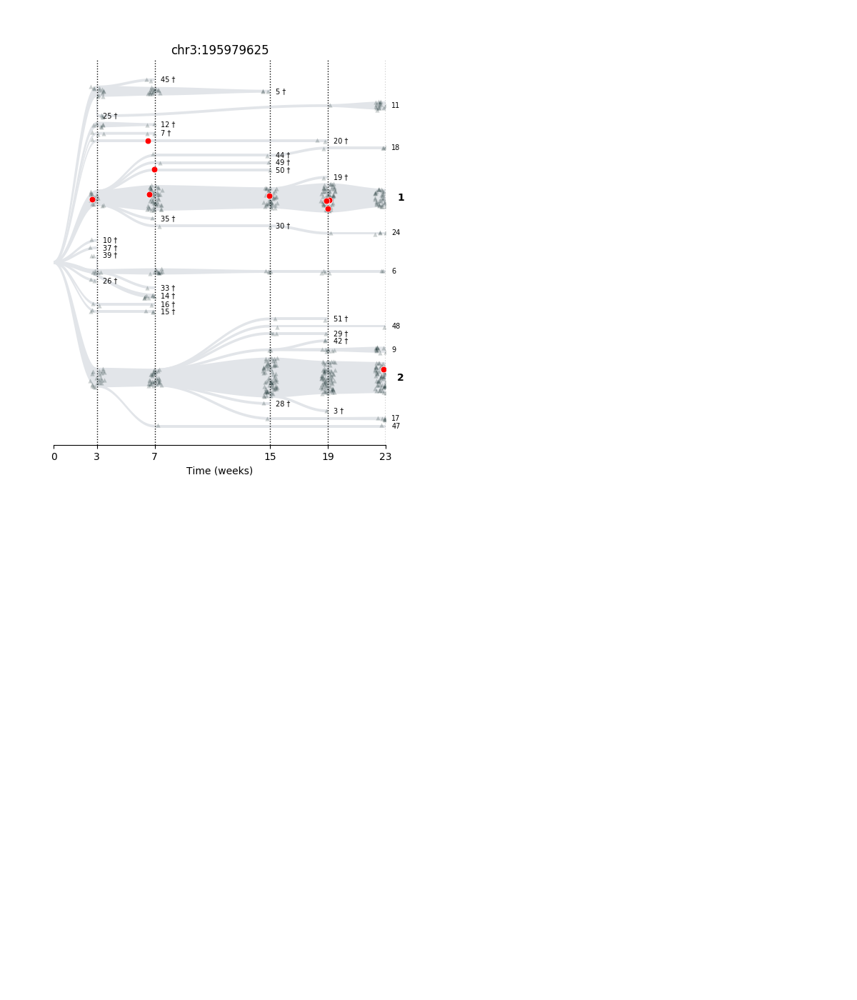

<IPython.core.display.Javascript object>


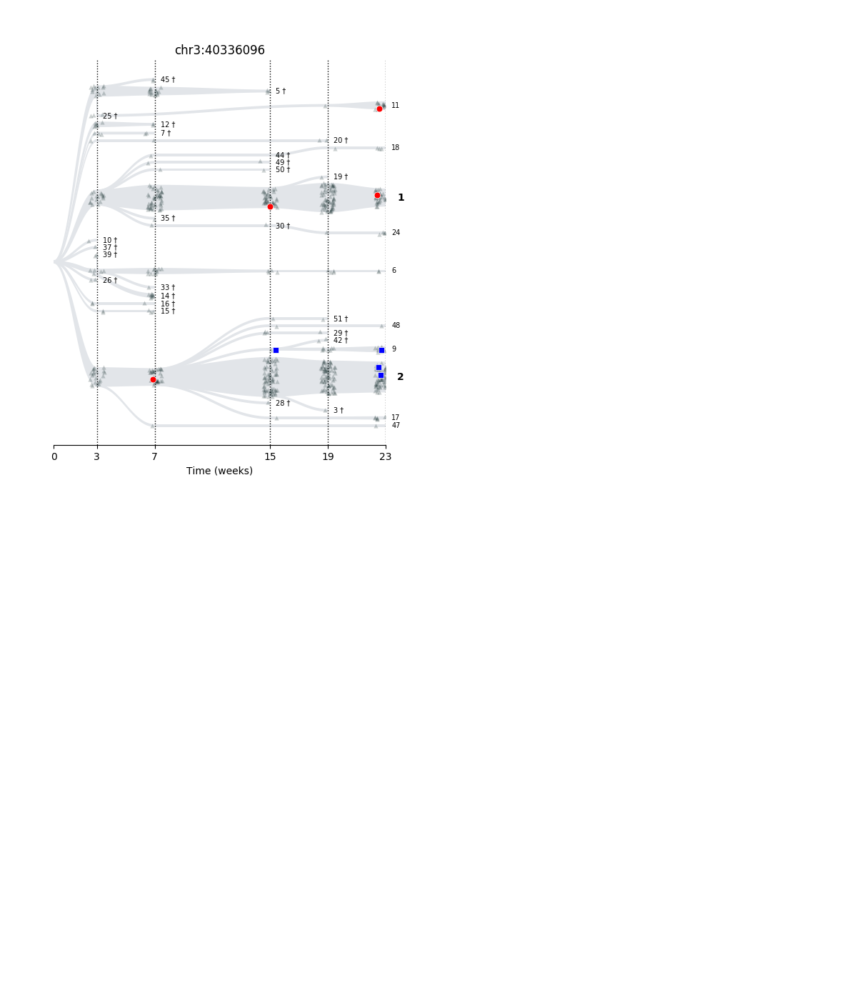

<IPython.core.display.Javascript object>


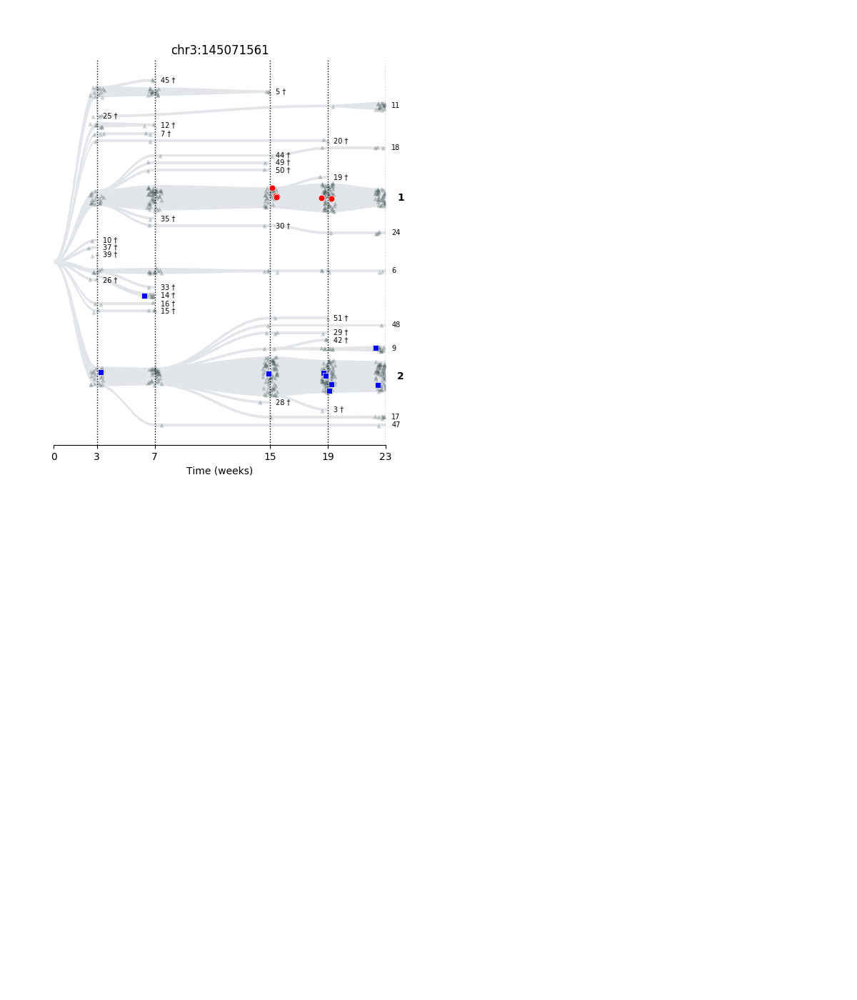

<IPython.core.display.Javascript object>


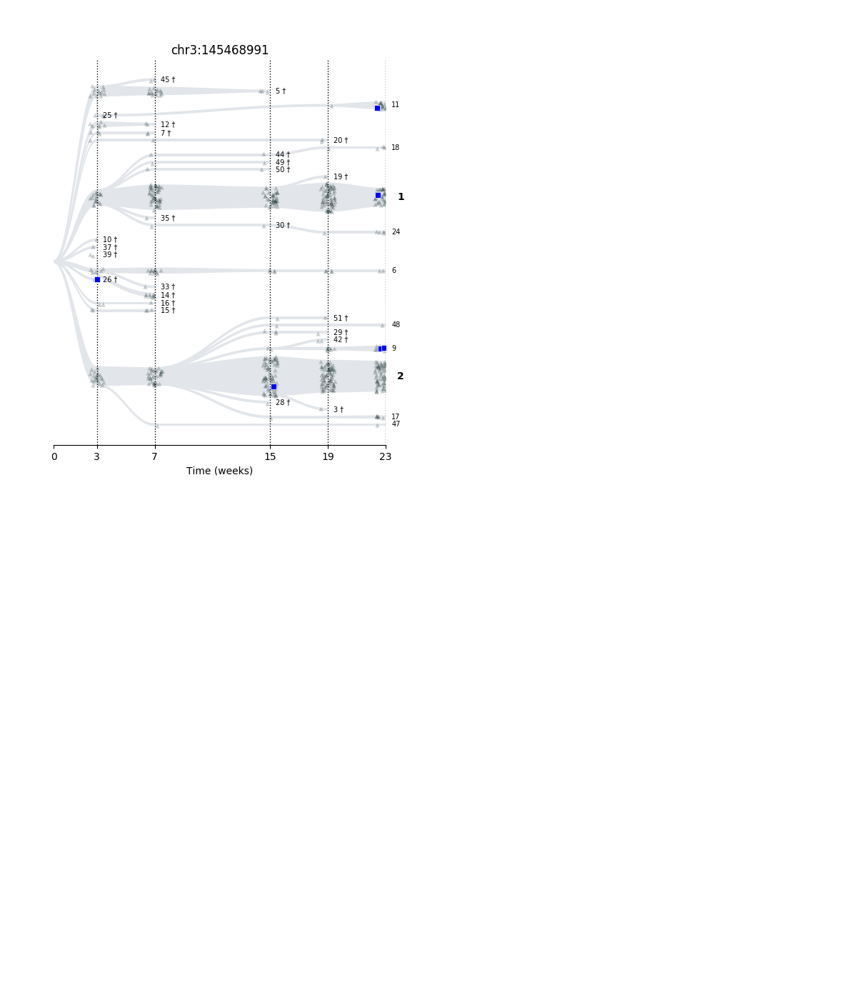

<IPython.core.display.Javascript object>


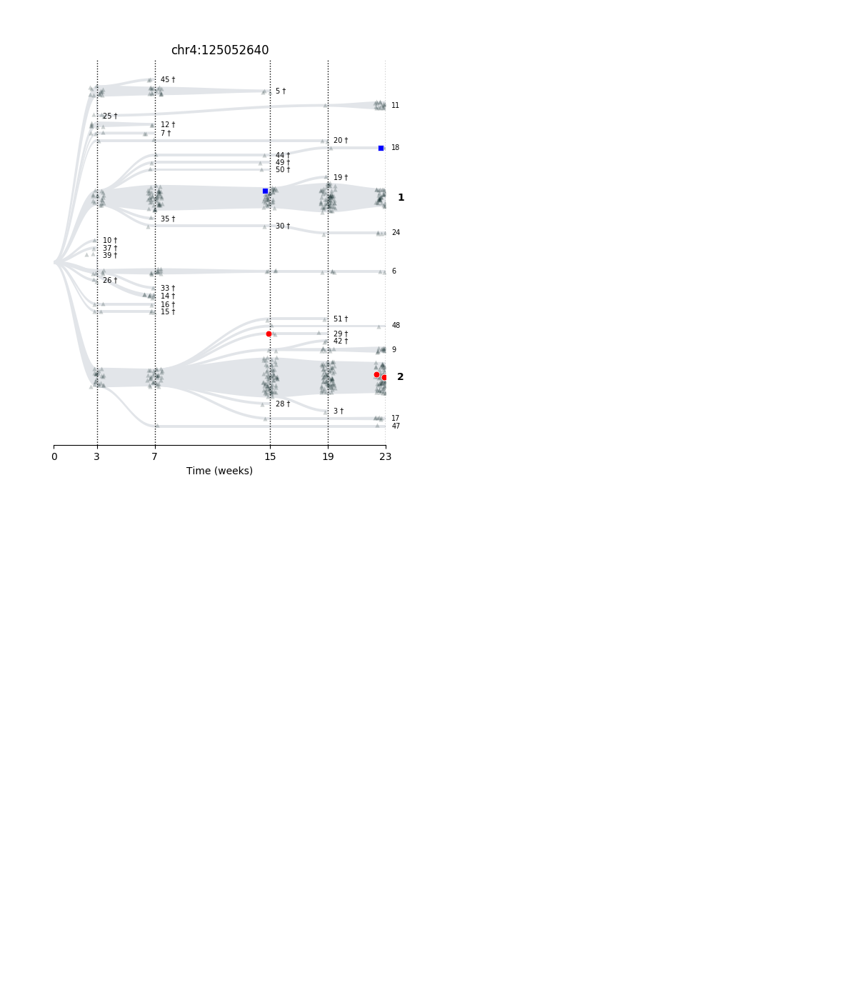

<IPython.core.display.Javascript object>


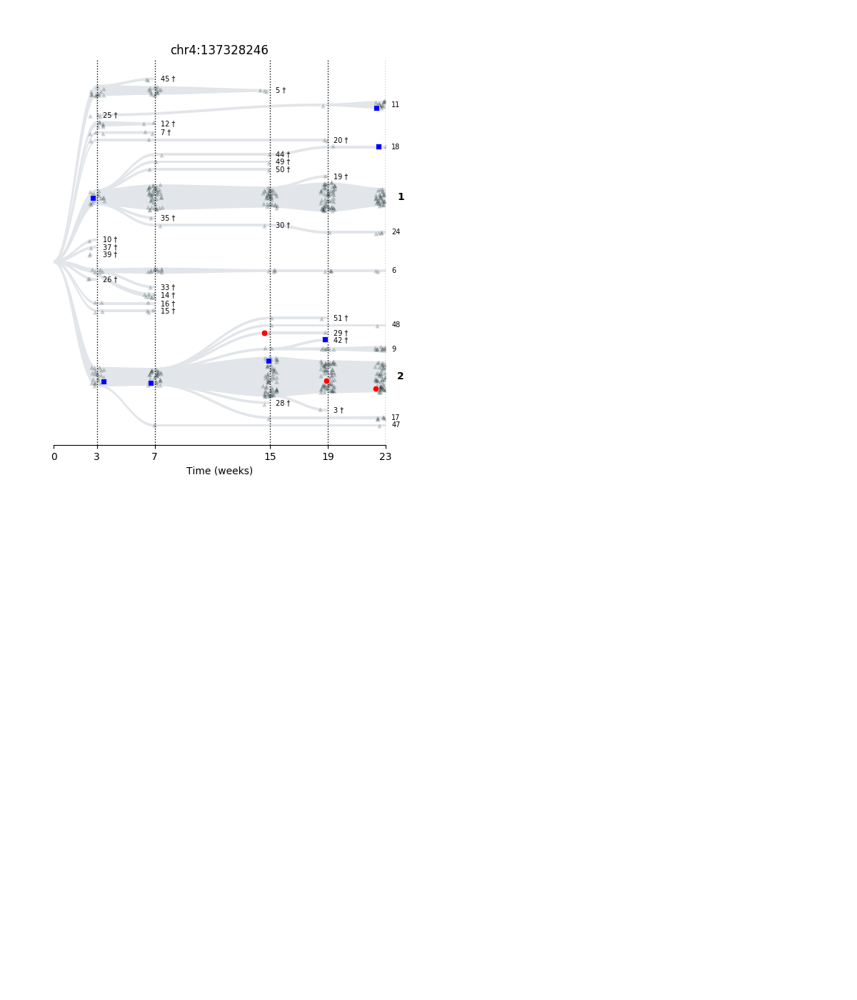

<IPython.core.display.Javascript object>


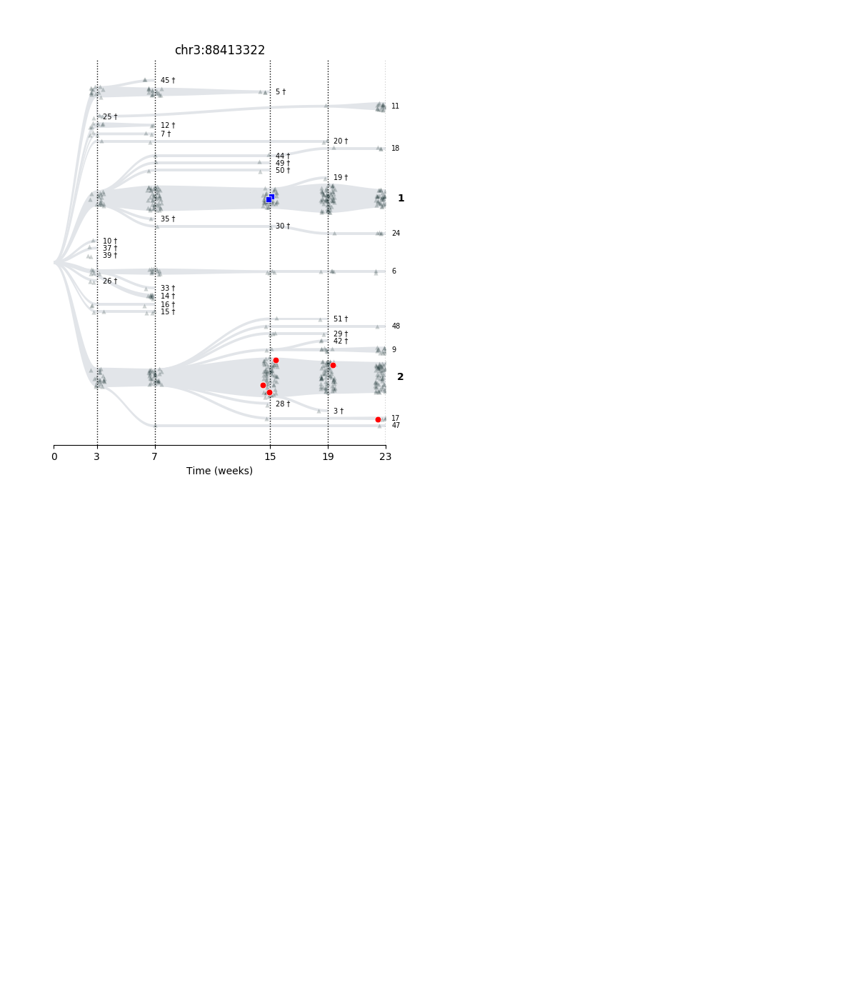

<IPython.core.display.Javascript object>


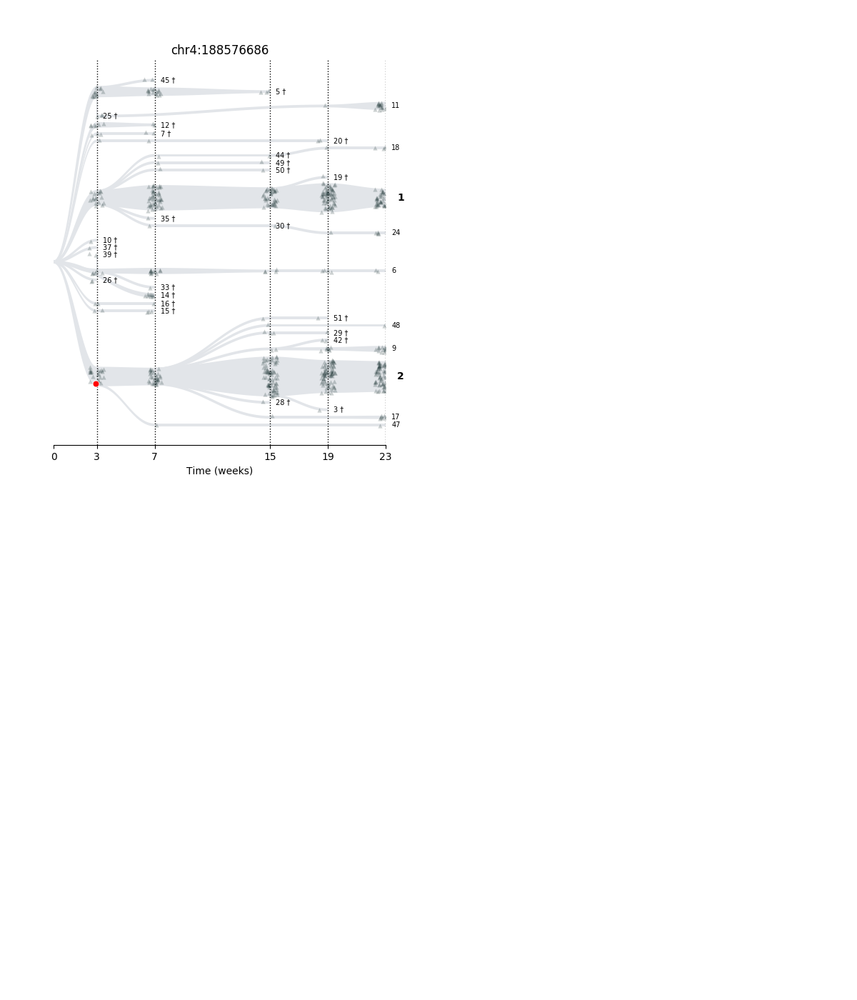

<IPython.core.display.Javascript object>


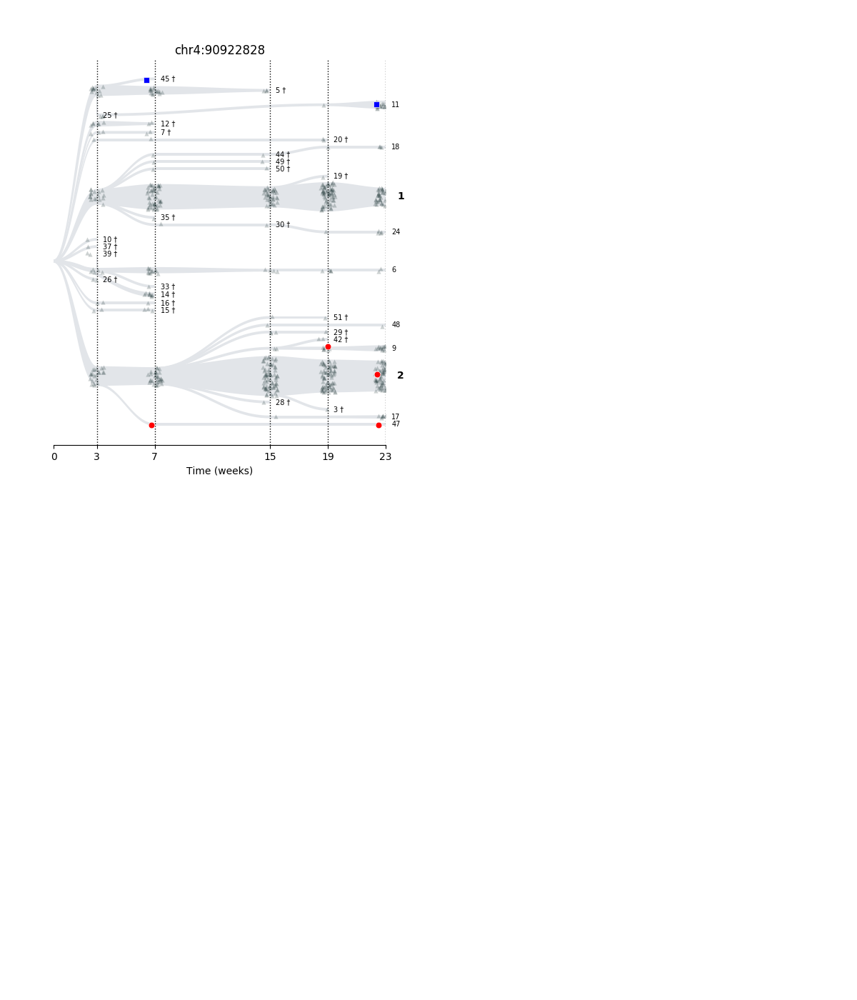

<IPython.core.display.Javascript object>


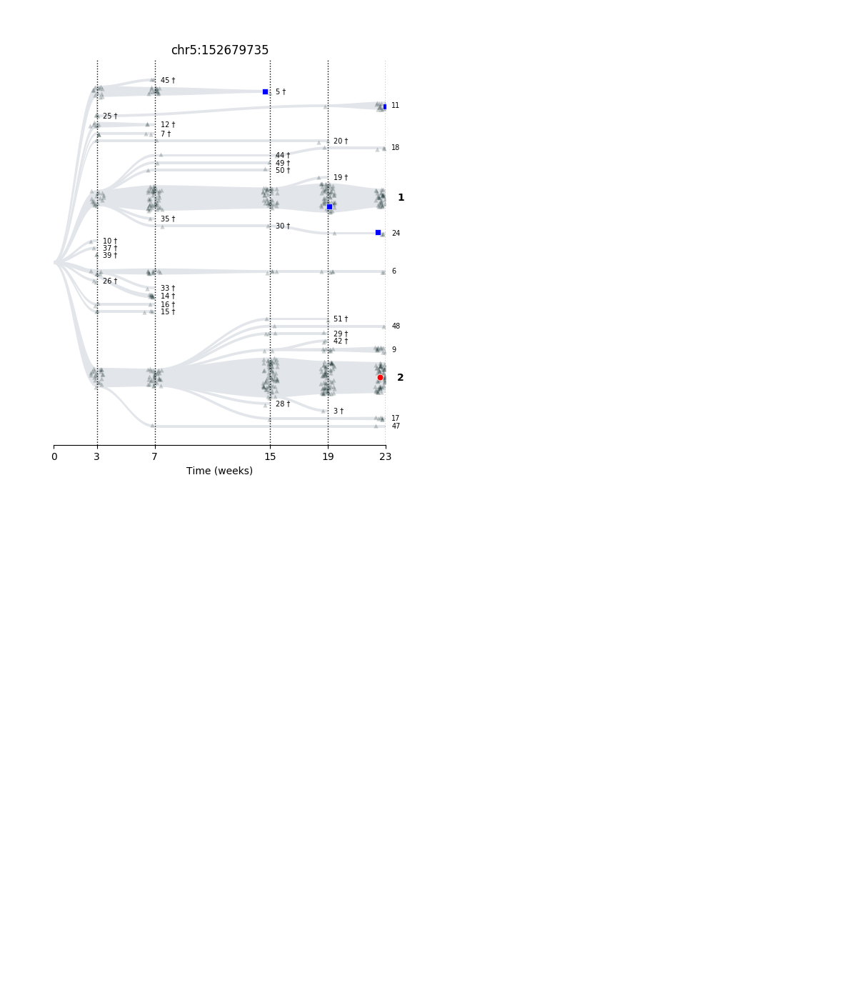

<IPython.core.display.Javascript object>


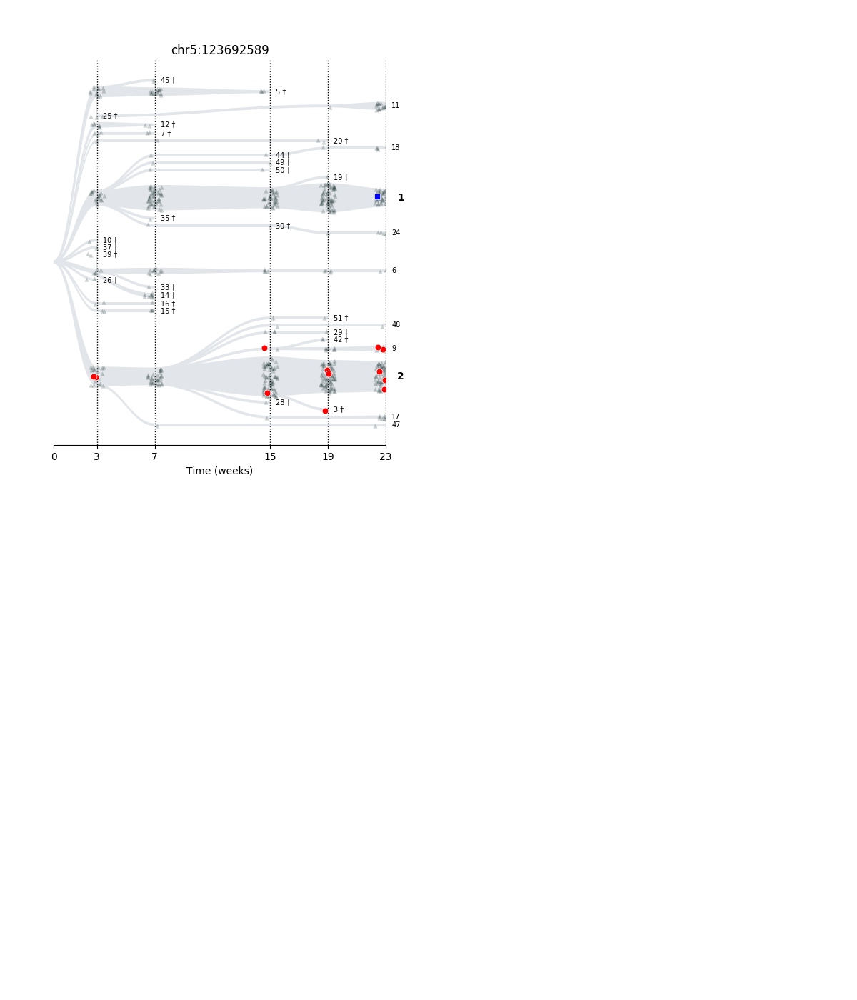

<IPython.core.display.Javascript object>


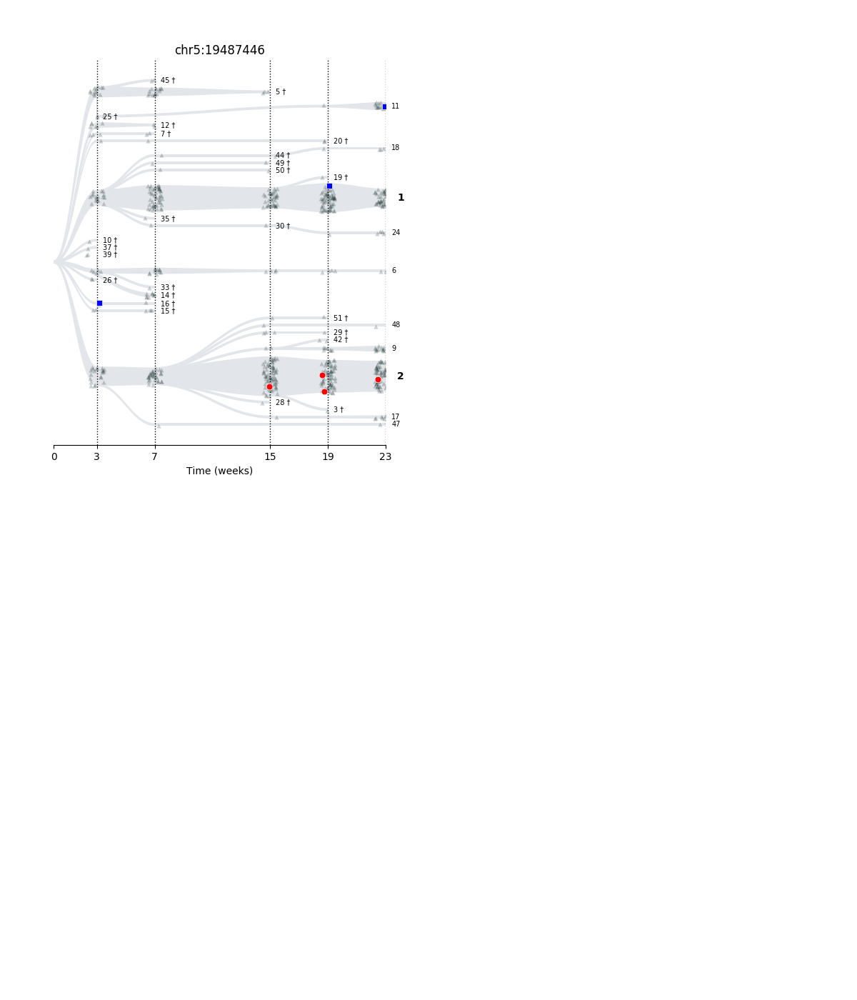

<IPython.core.display.Javascript object>


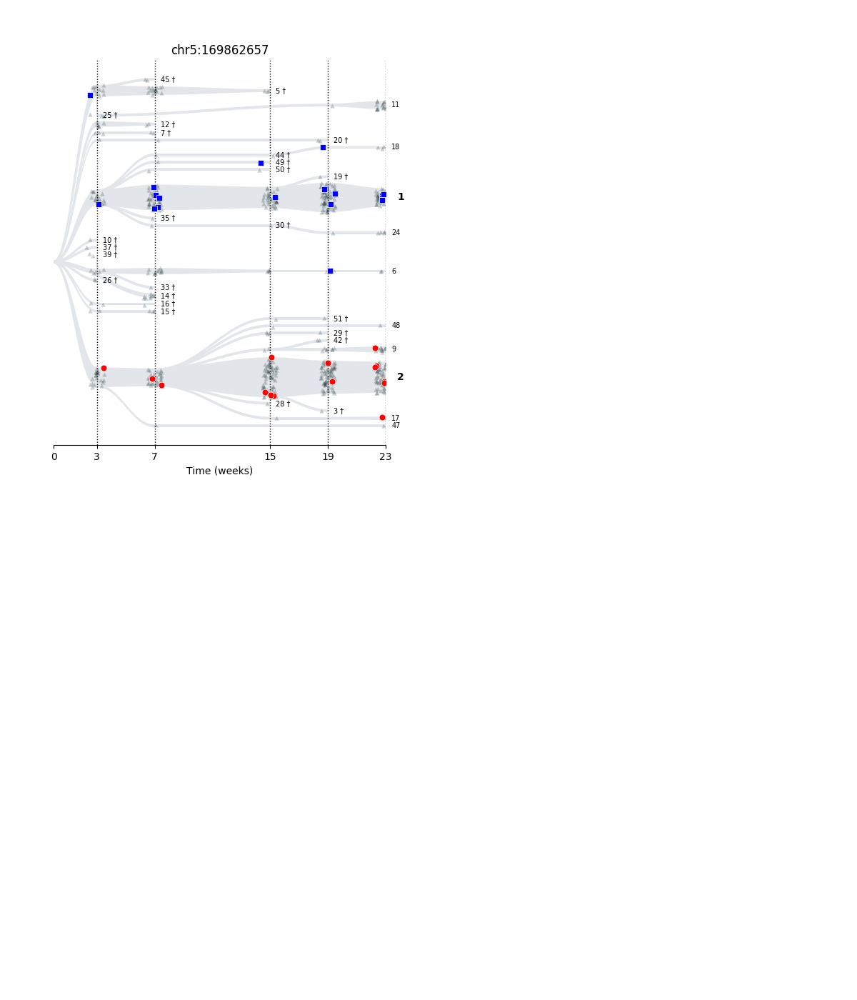

<IPython.core.display.Javascript object>


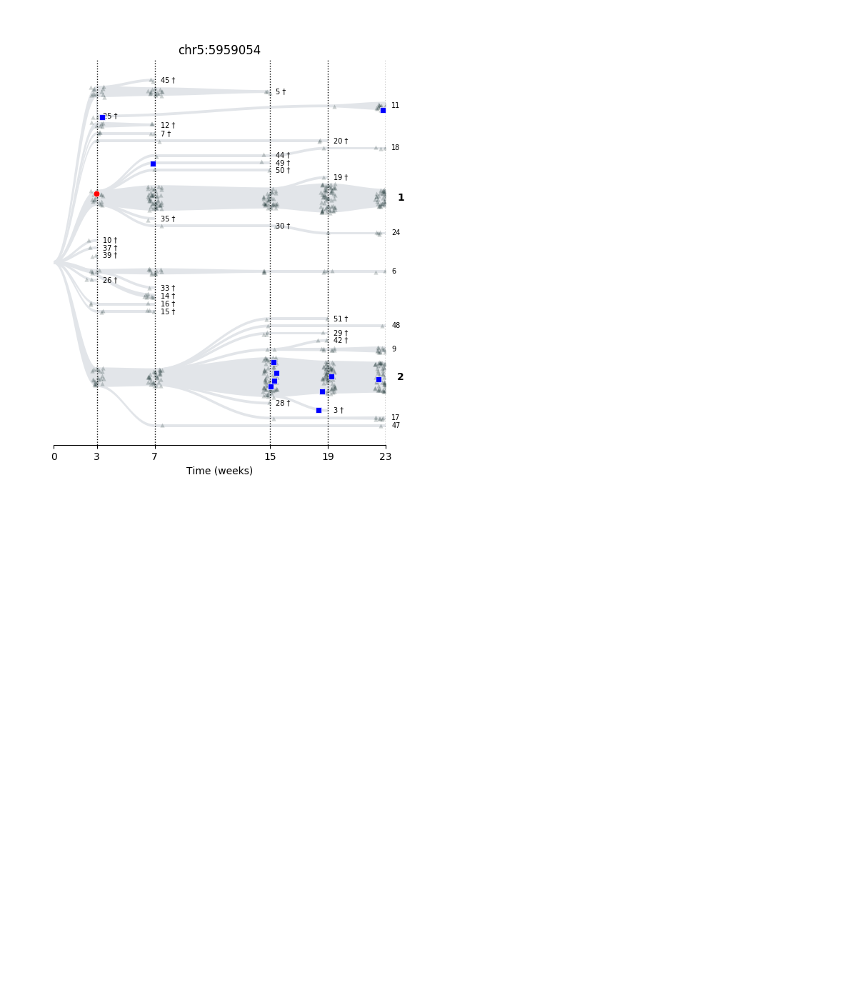

<IPython.core.display.Javascript object>


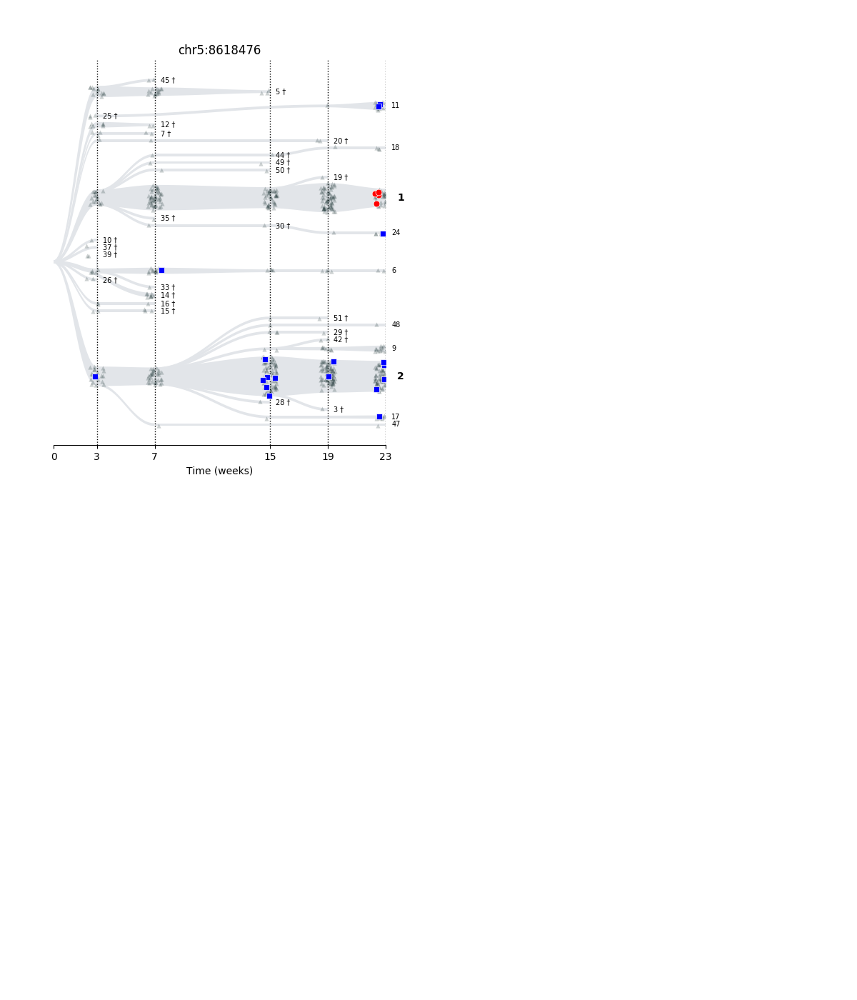

<IPython.core.display.Javascript object>


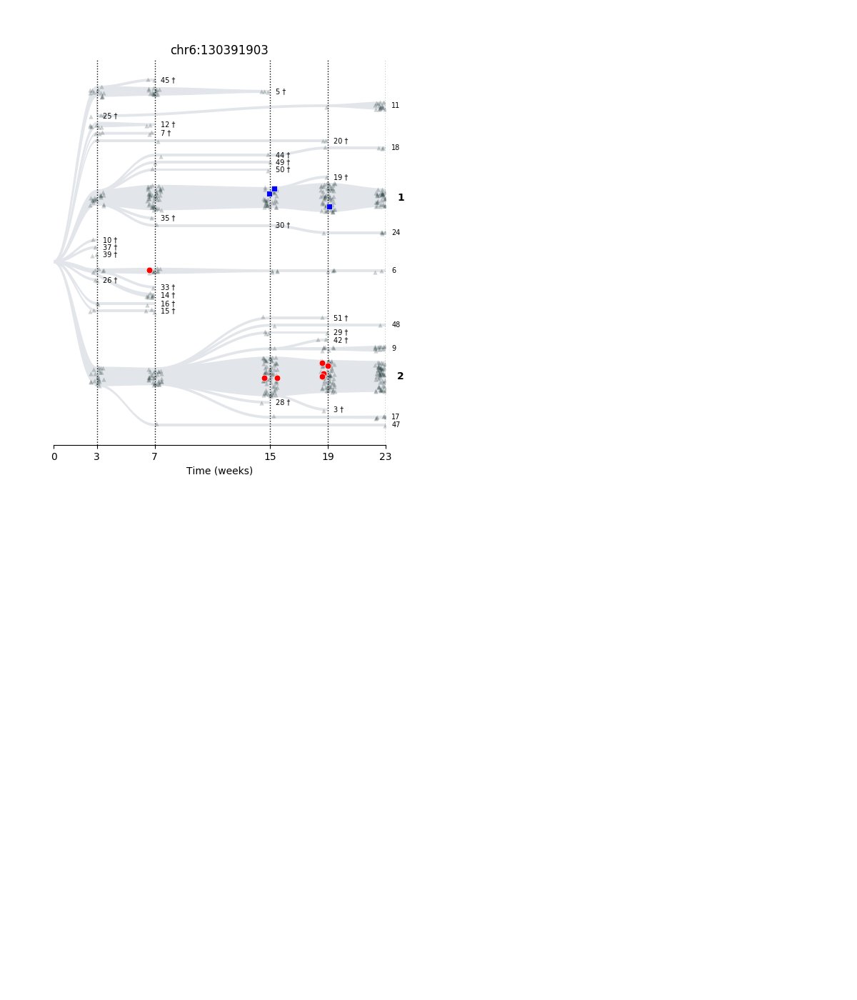

<IPython.core.display.Javascript object>


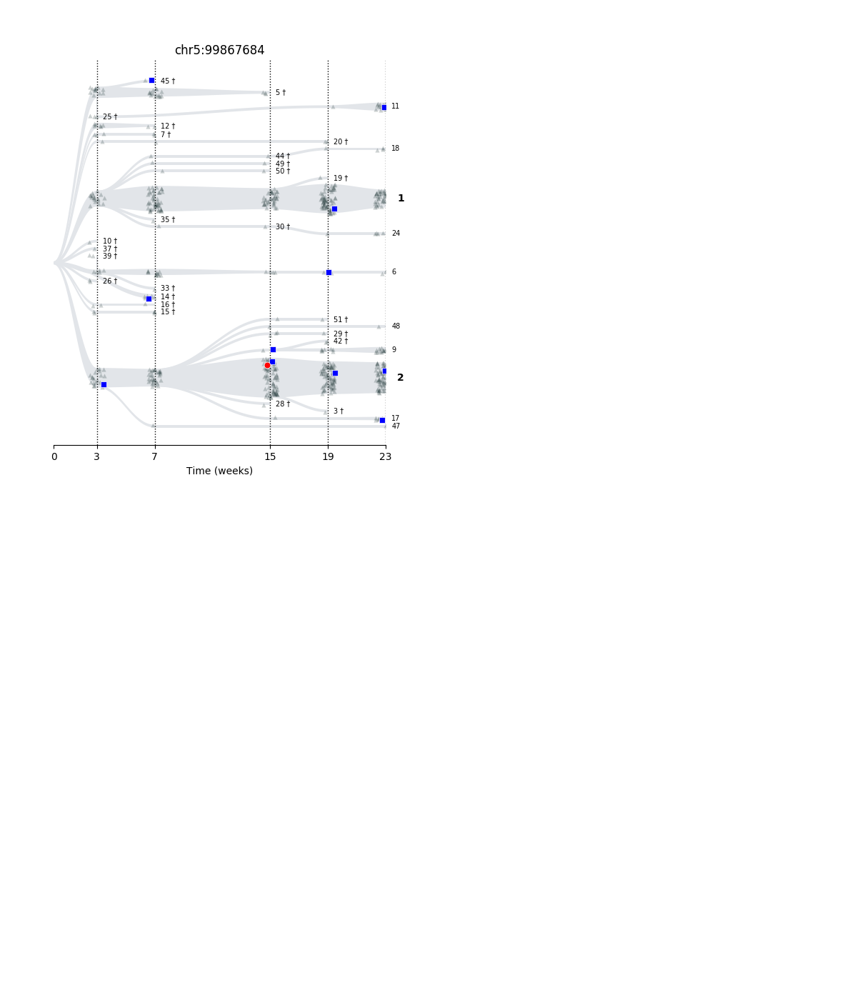

<IPython.core.display.Javascript object>


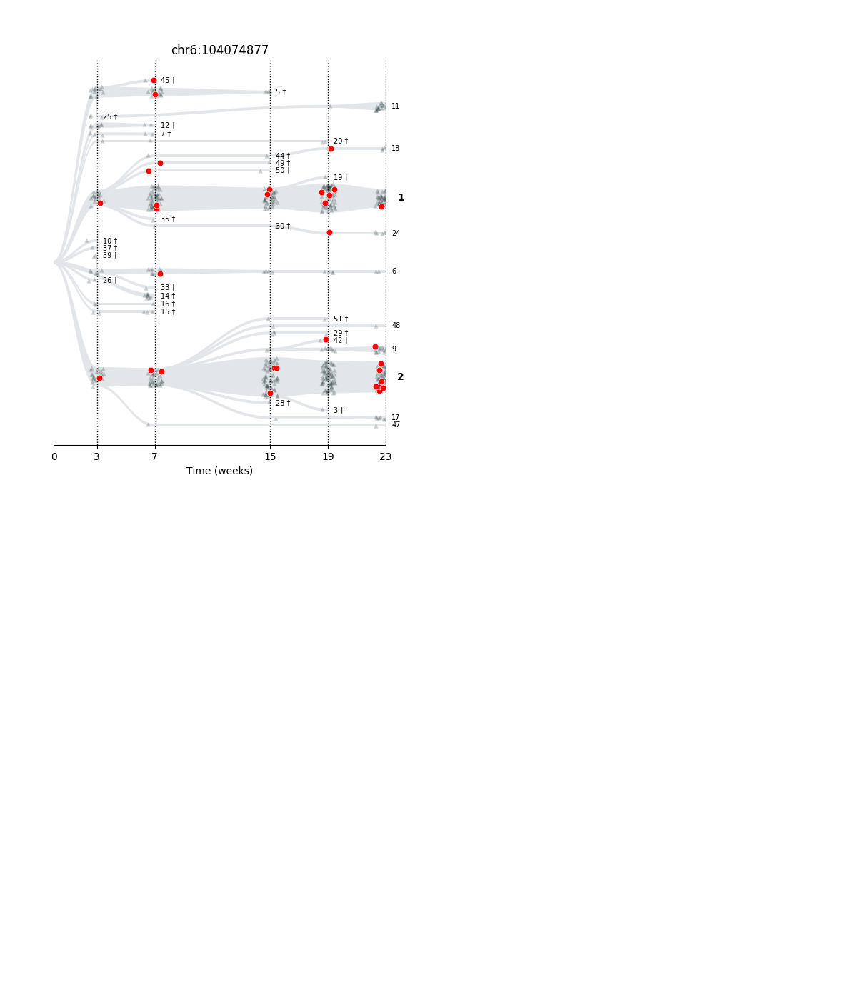

<IPython.core.display.Javascript object>


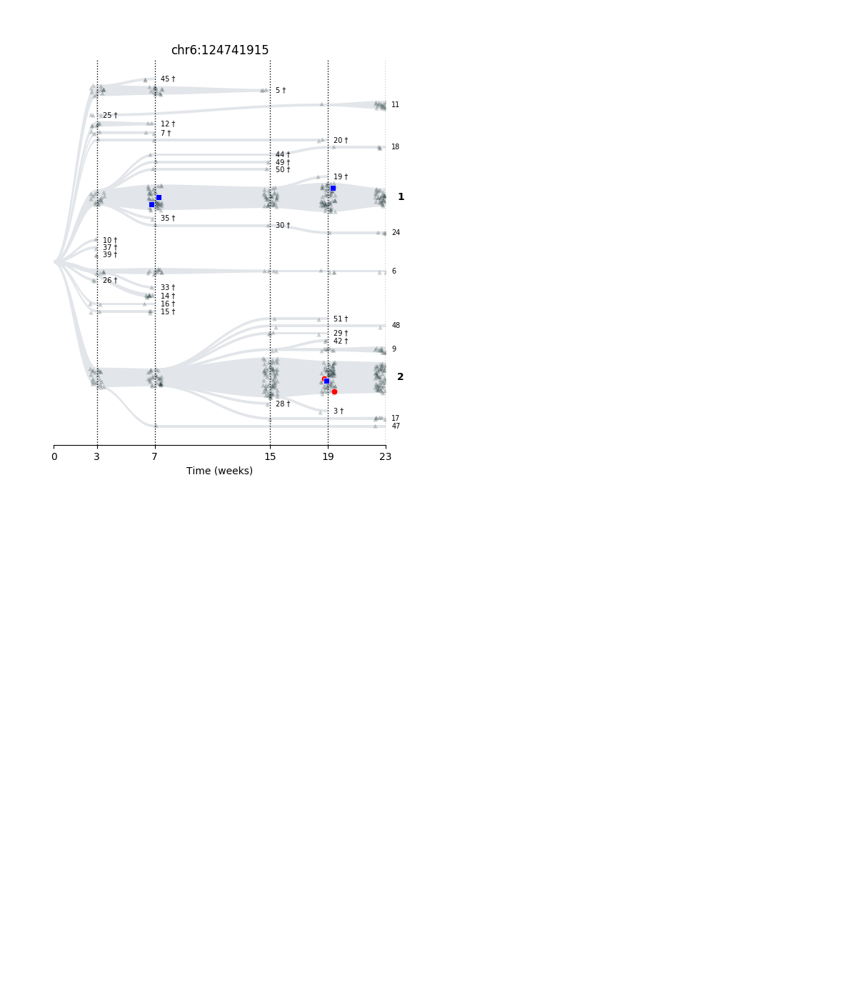

<IPython.core.display.Javascript object>


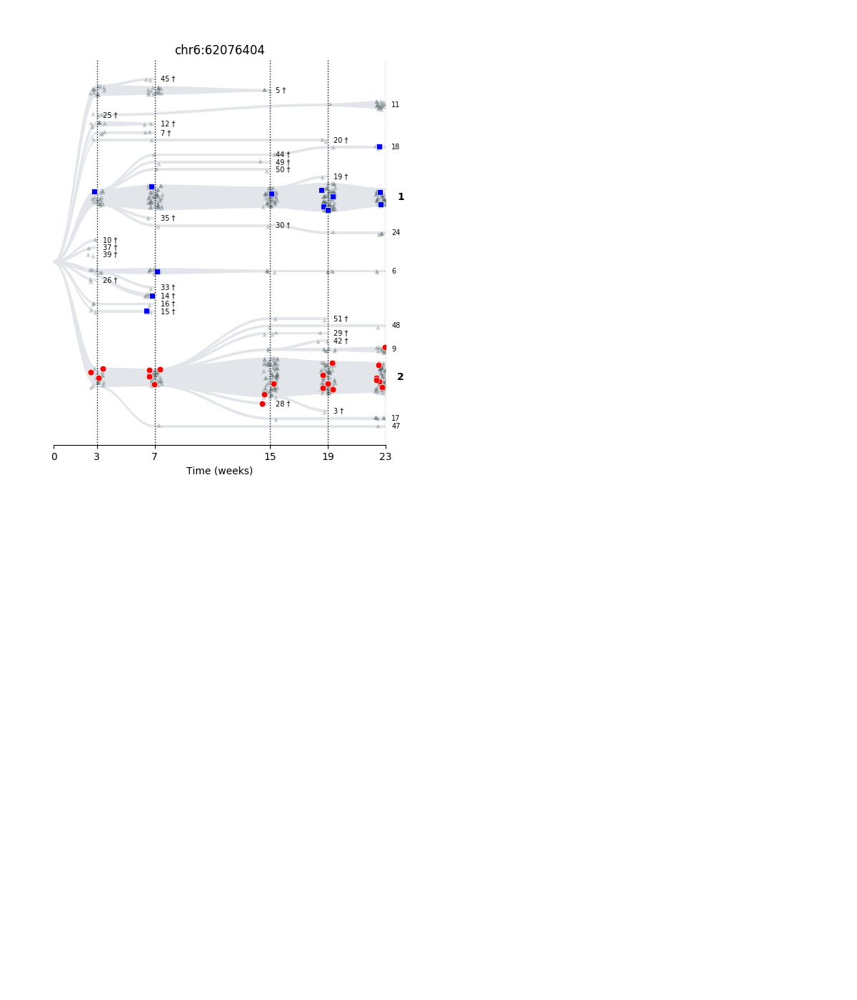

<IPython.core.display.Javascript object>


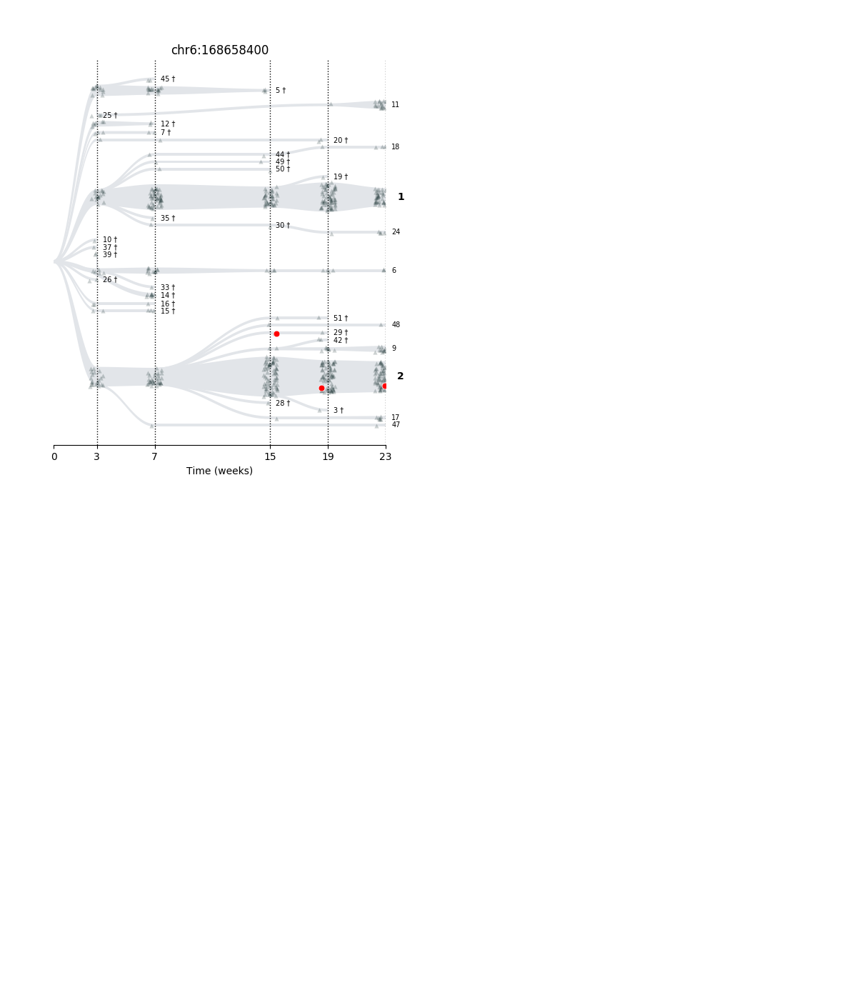

<IPython.core.display.Javascript object>


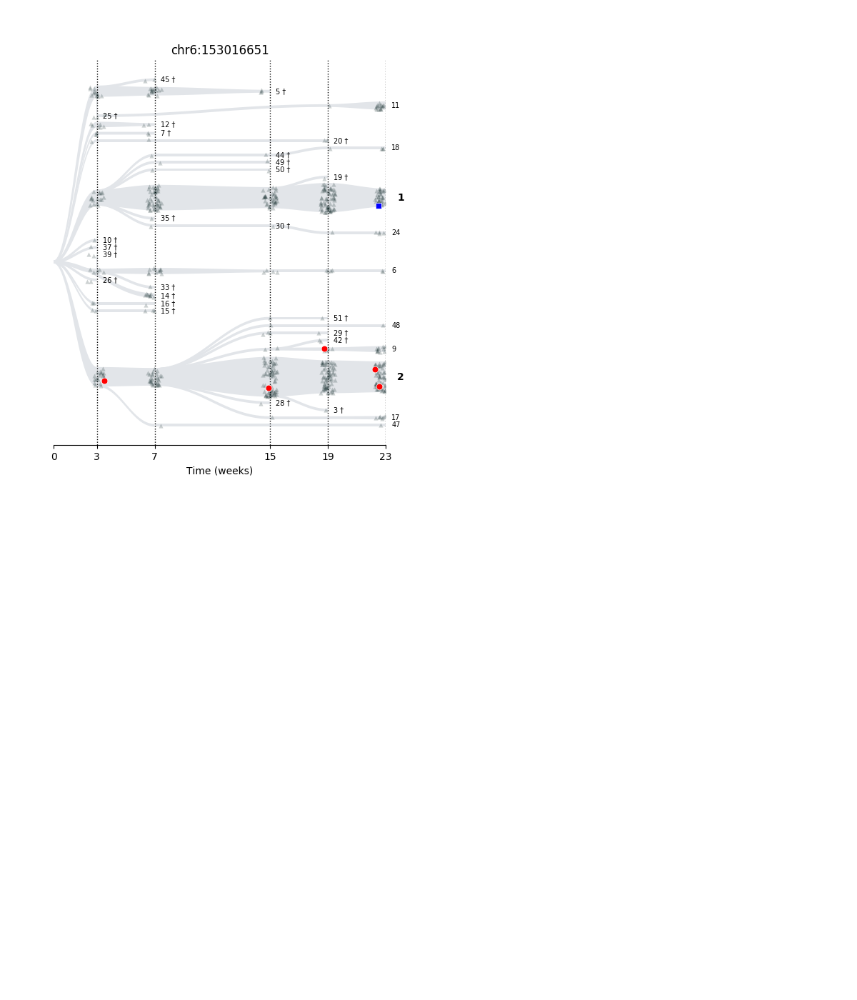

<IPython.core.display.Javascript object>


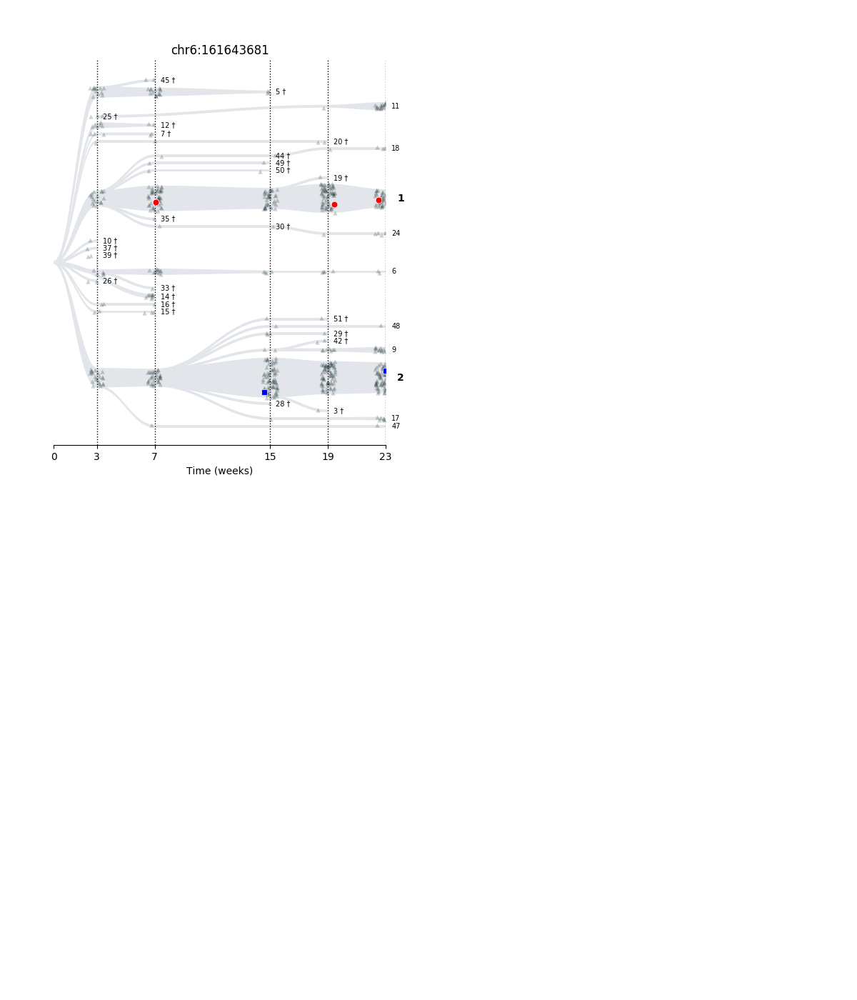

<IPython.core.display.Javascript object>


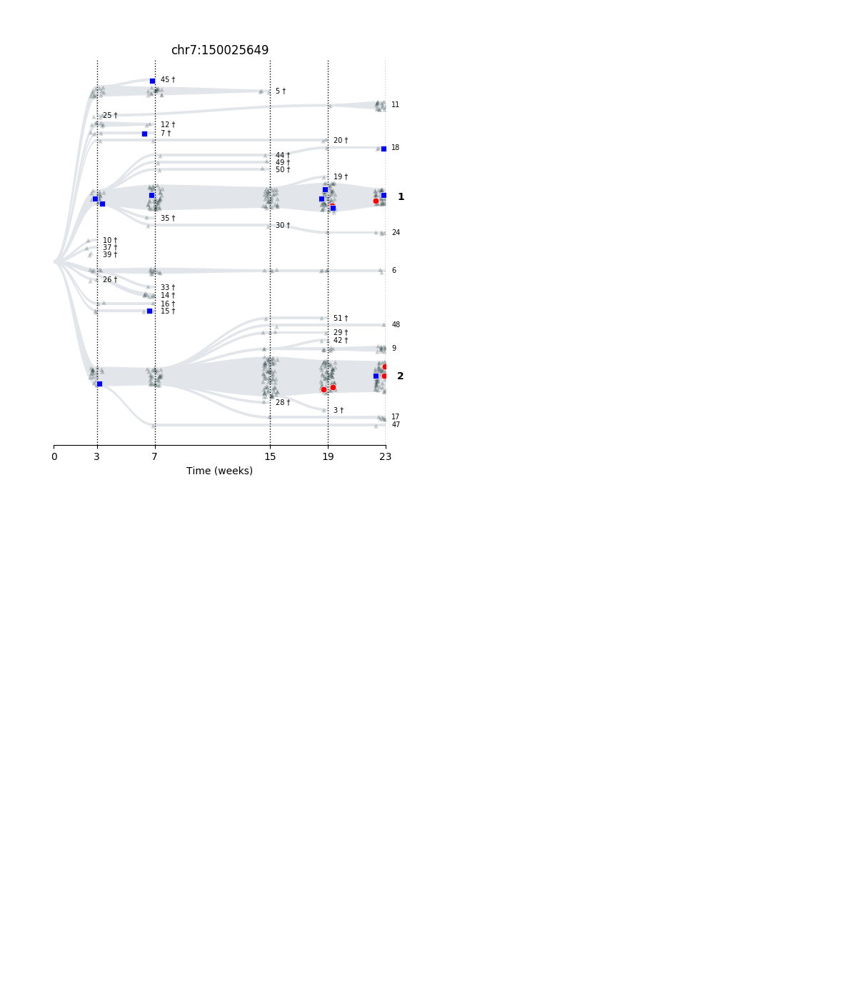

<IPython.core.display.Javascript object>


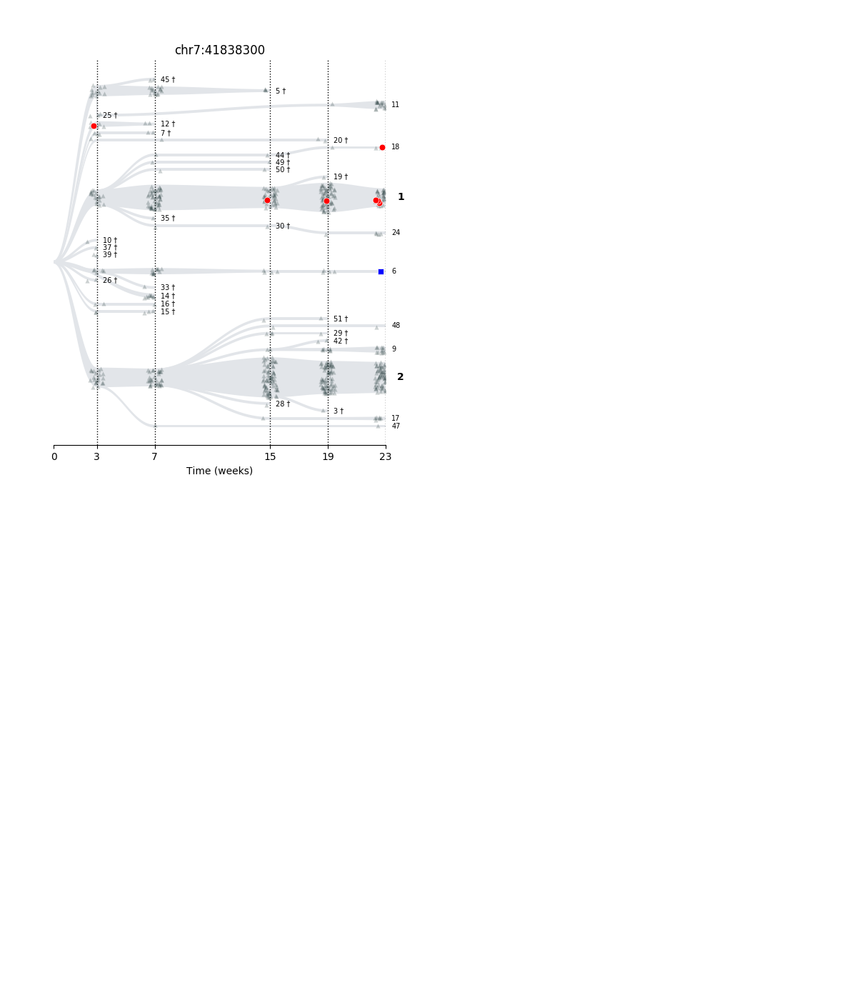

<IPython.core.display.Javascript object>


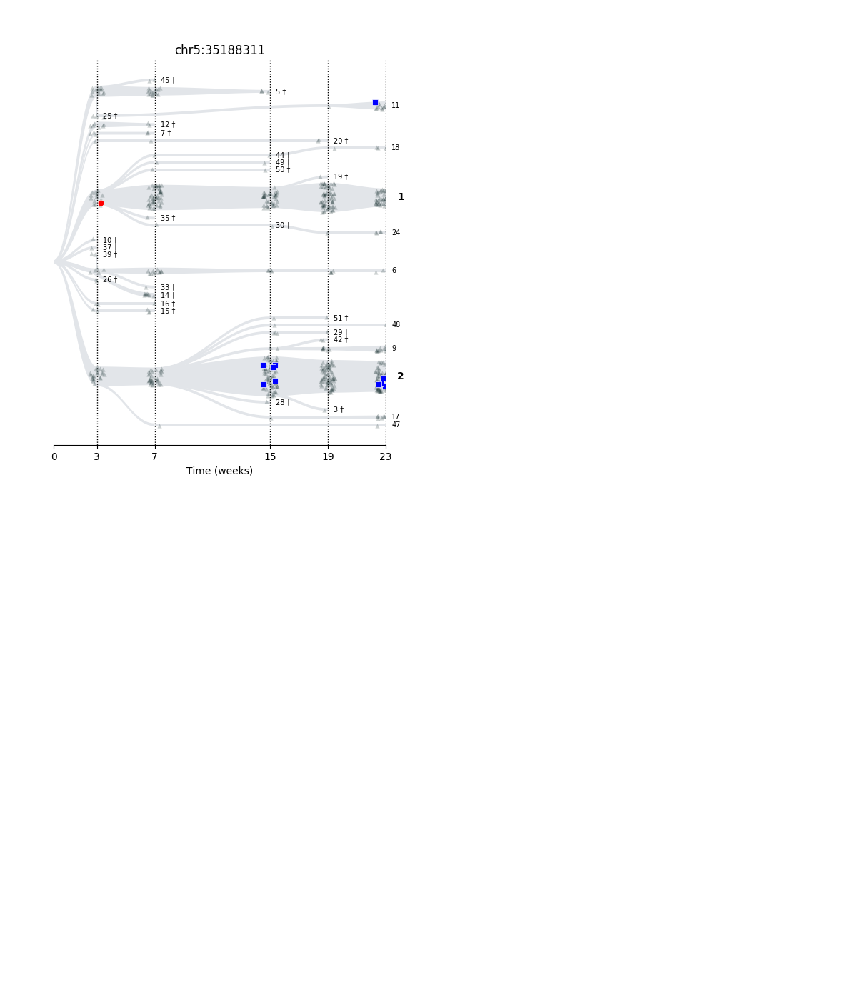

<IPython.core.display.Javascript object>


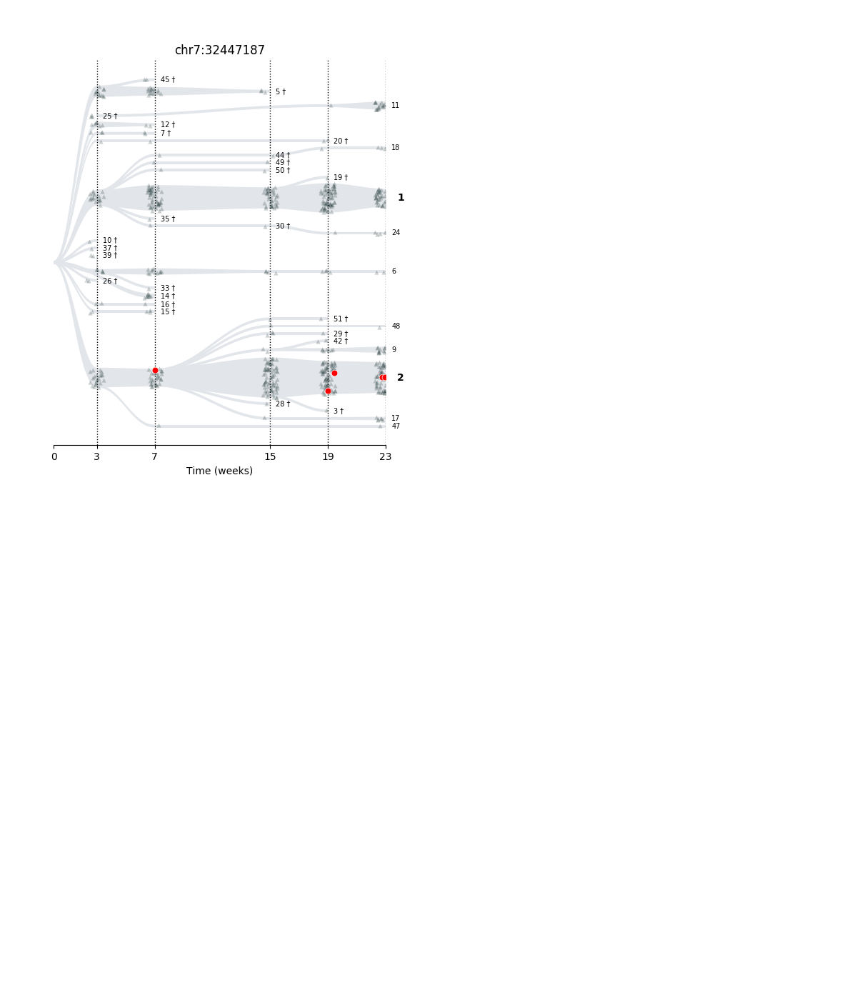

<IPython.core.display.Javascript object>


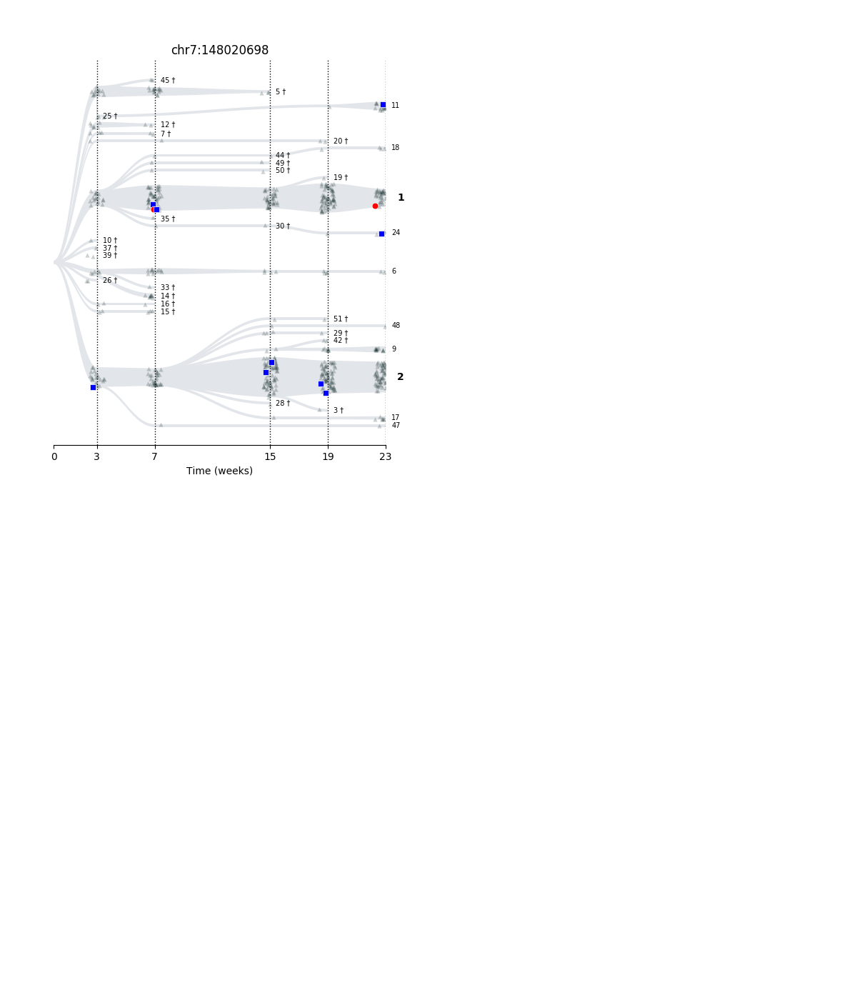

<IPython.core.display.Javascript object>


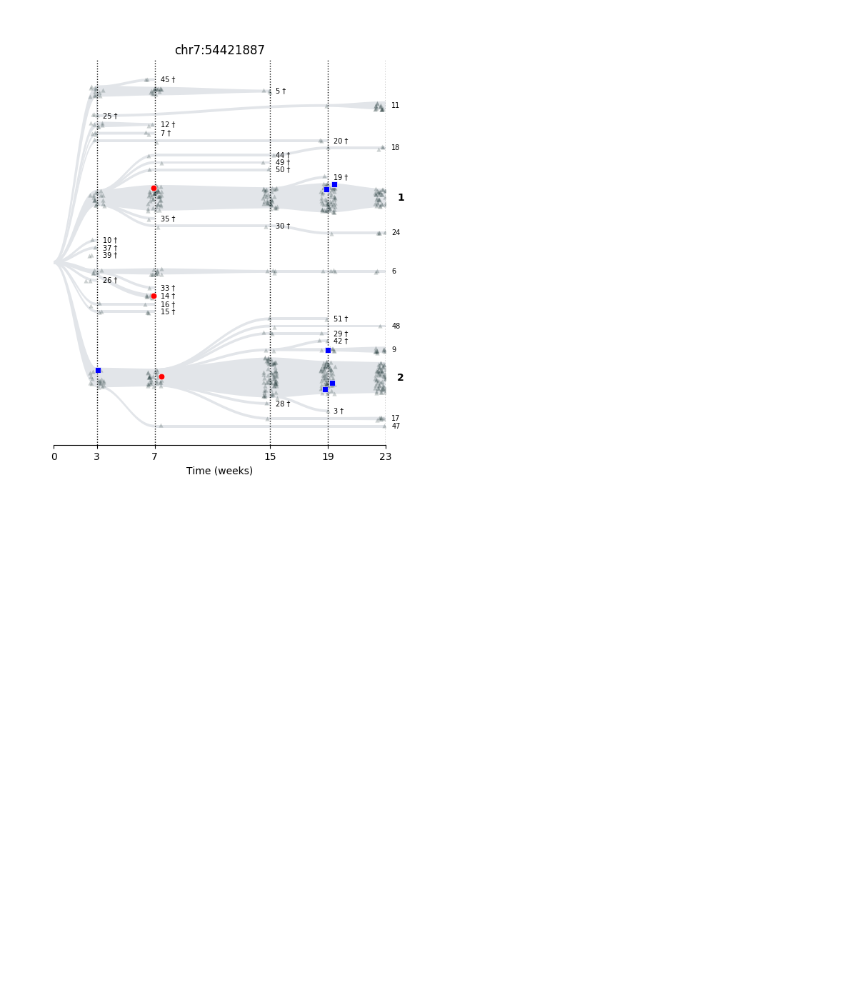

<IPython.core.display.Javascript object>


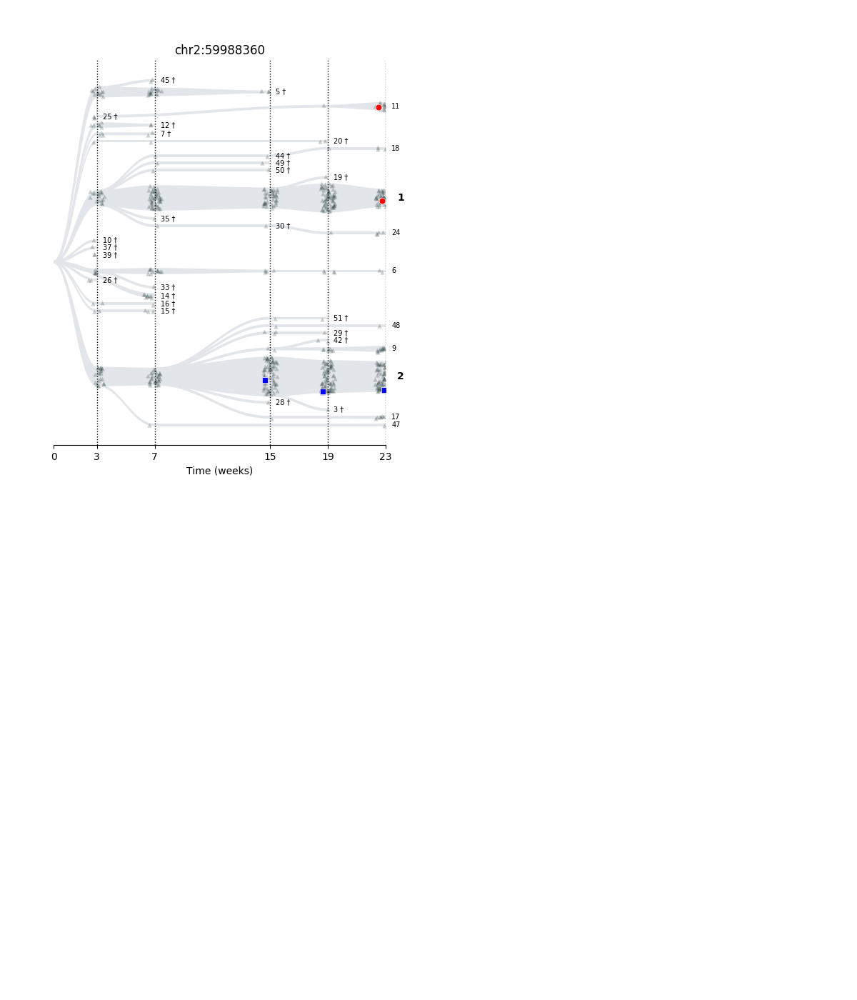

<IPython.core.display.Javascript object>


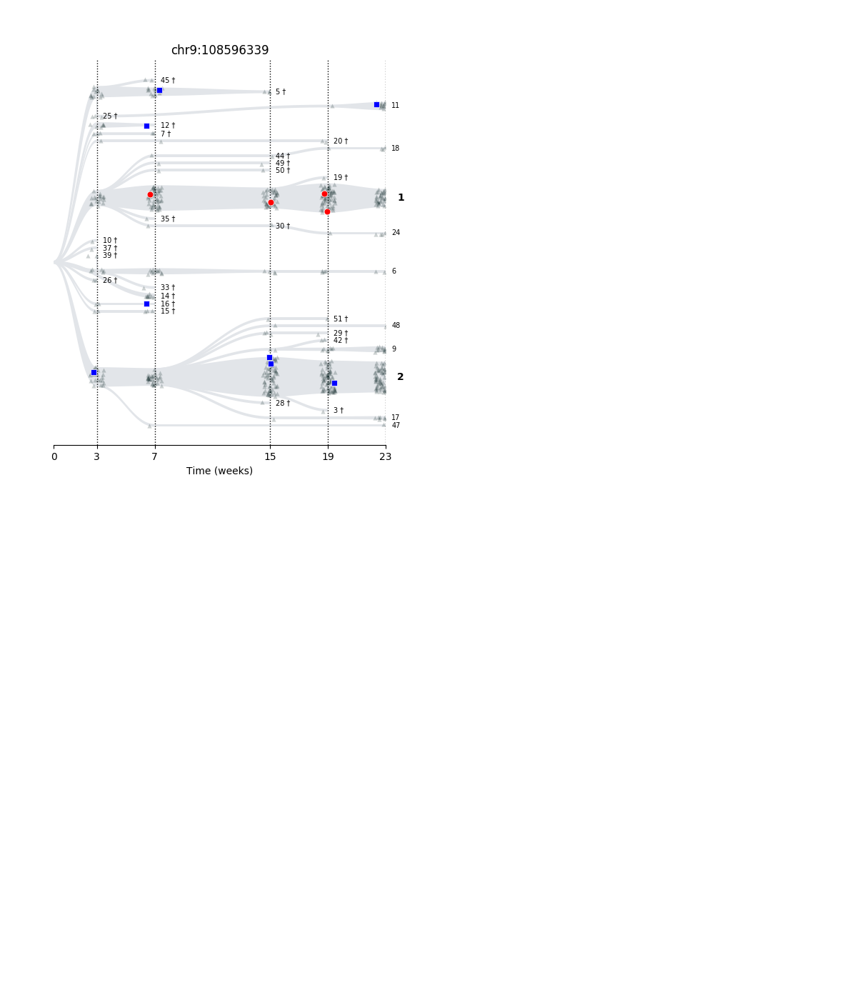

<IPython.core.display.Javascript object>


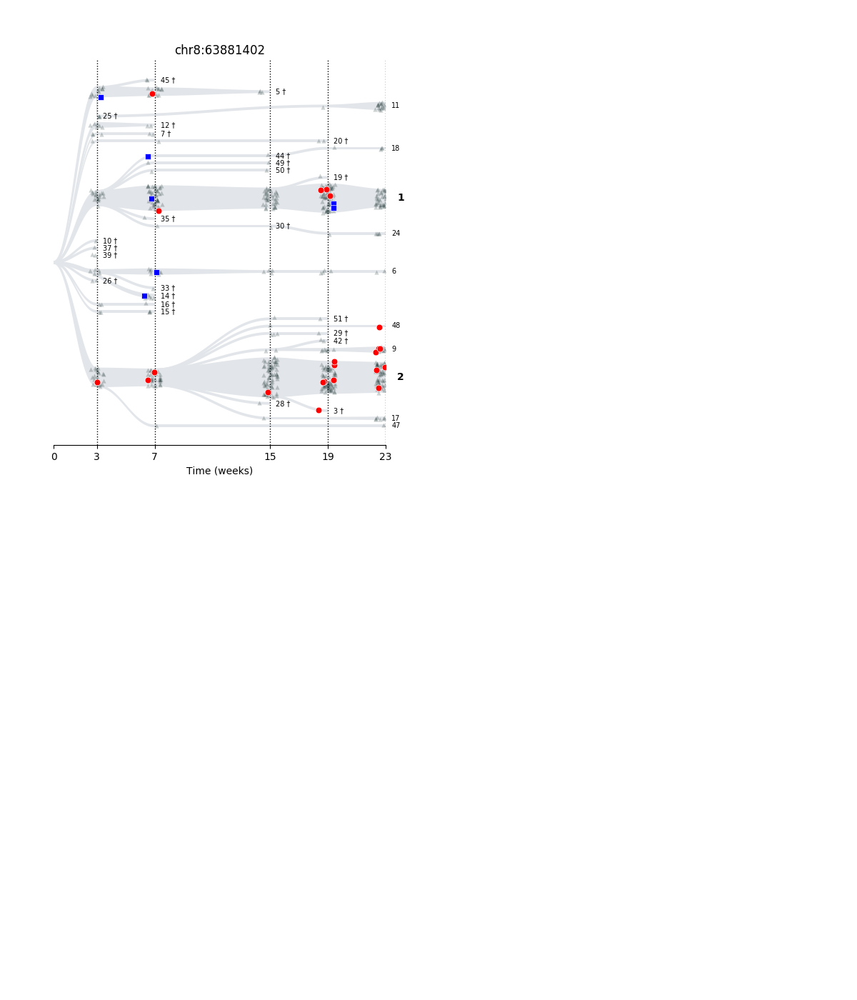

<IPython.core.display.Javascript object>


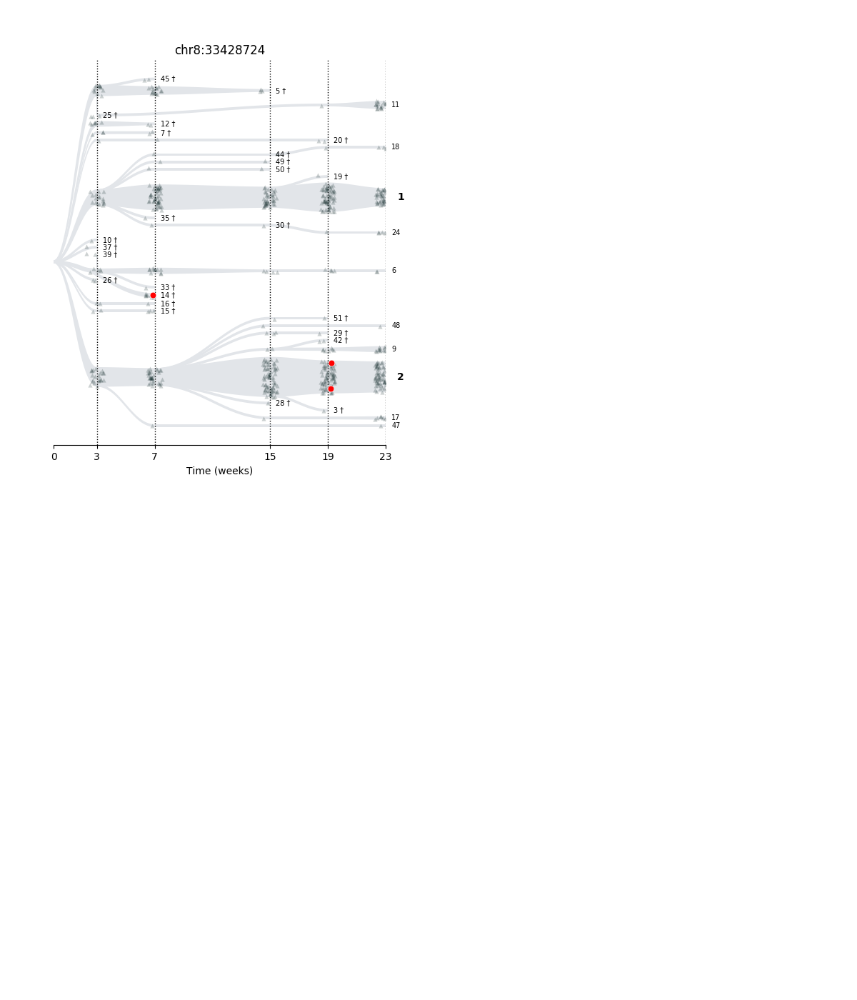

<IPython.core.display.Javascript object>


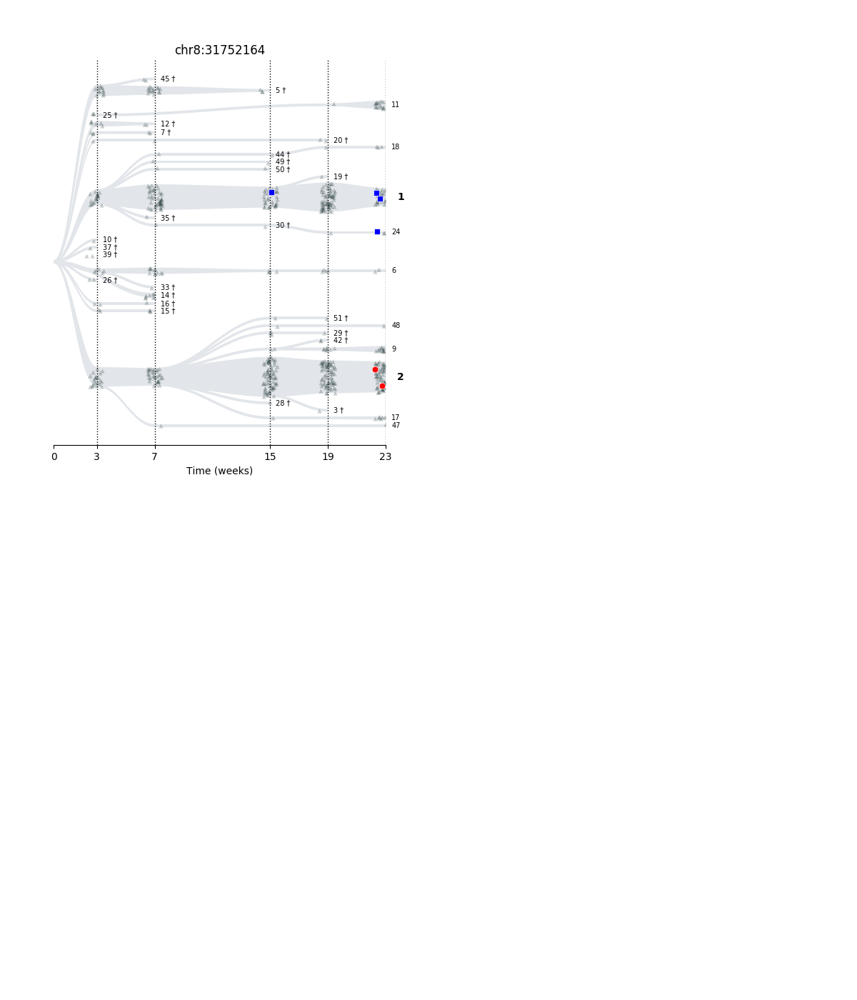

<IPython.core.display.Javascript object>


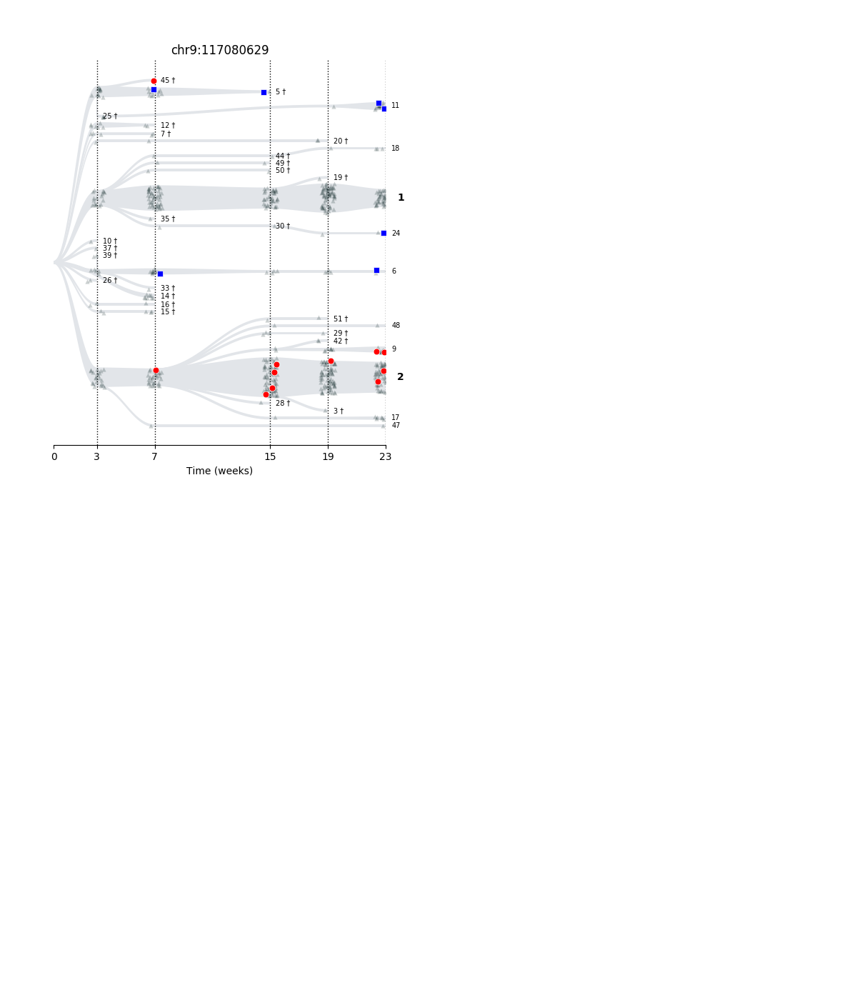

<IPython.core.display.Javascript object>


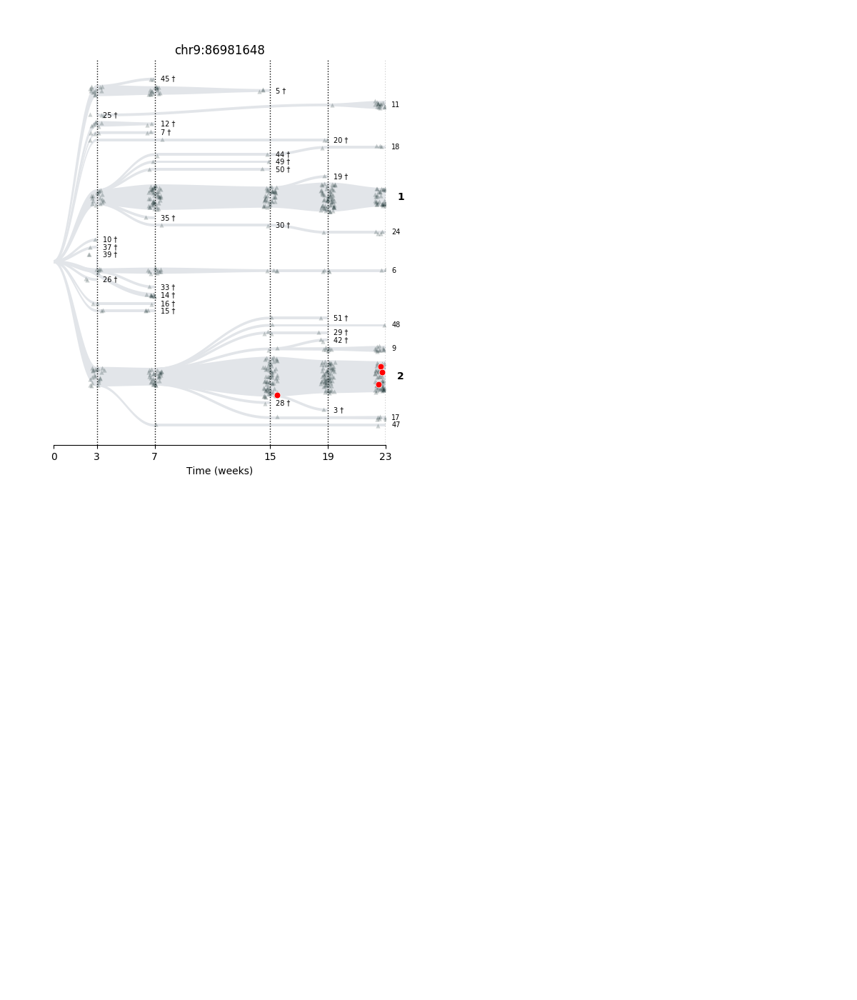

<IPython.core.display.Javascript object>


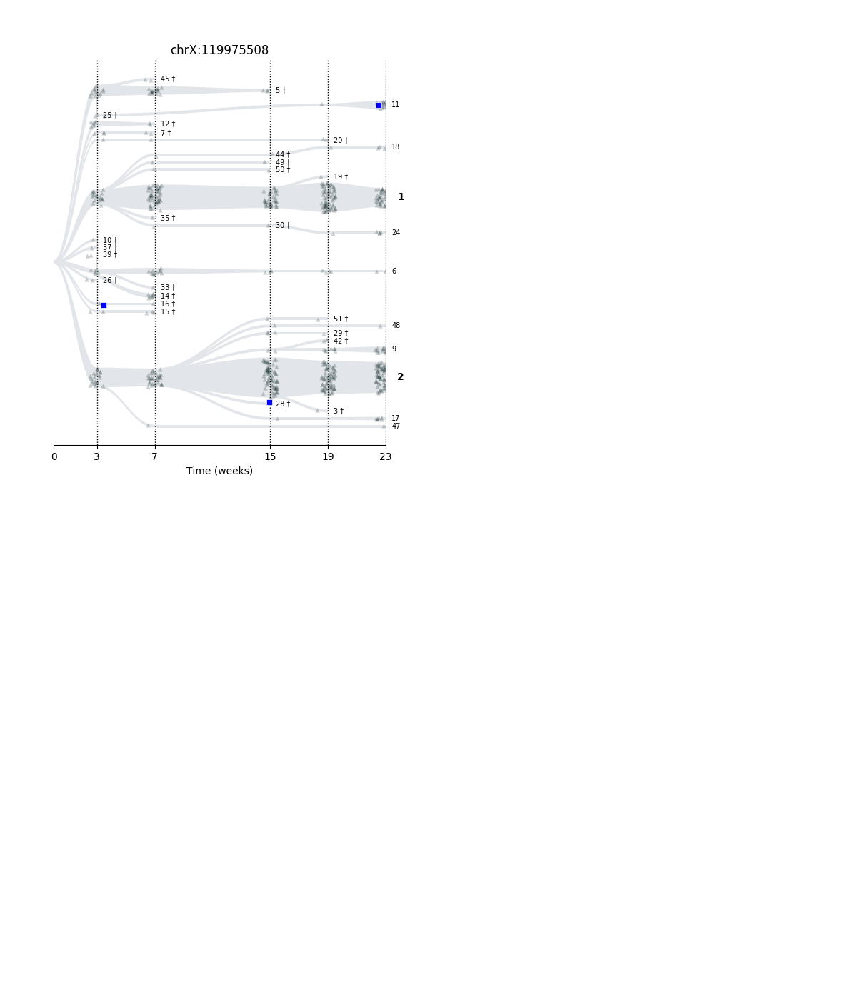

<IPython.core.display.Javascript object>


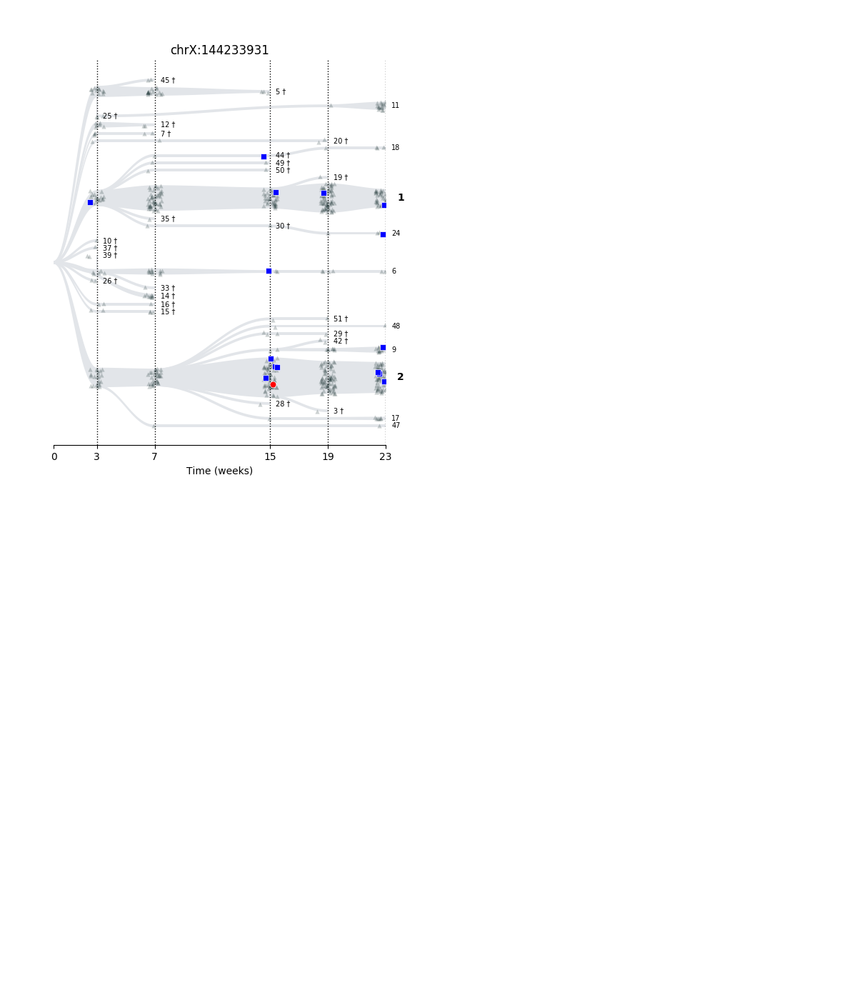

<IPython.core.display.Javascript object>


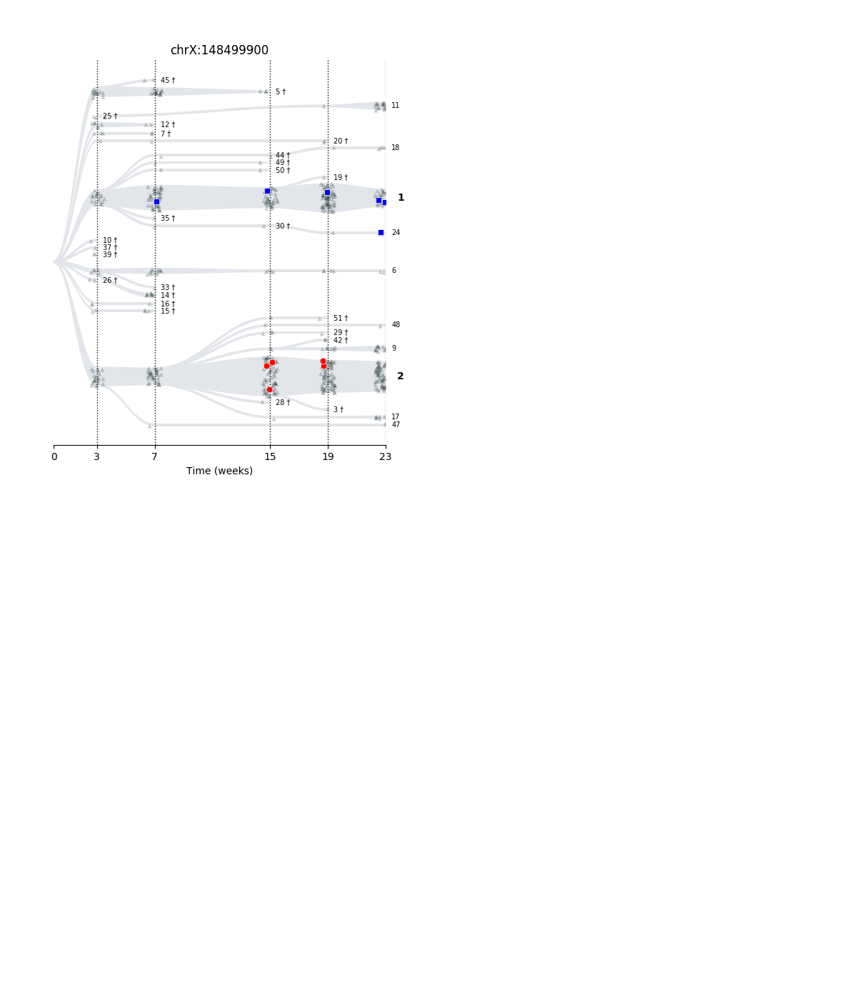

<IPython.core.display.Javascript object>


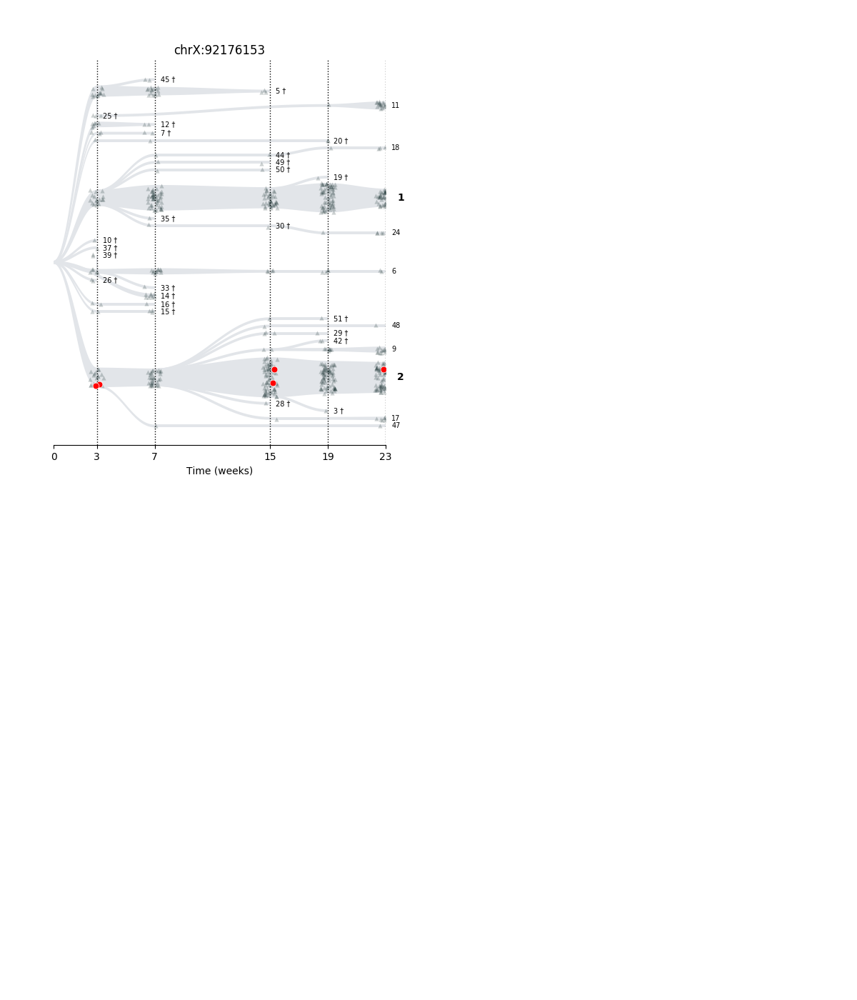

<IPython.core.display.Javascript object>


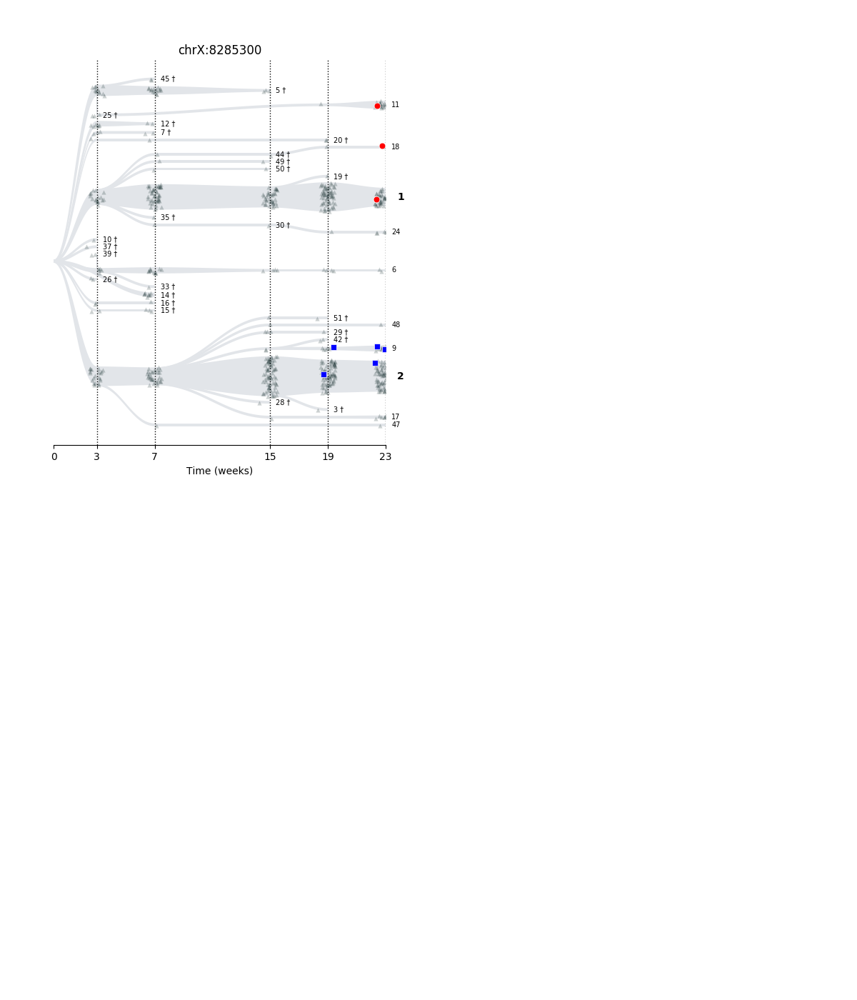

<IPython.core.display.Javascript object>


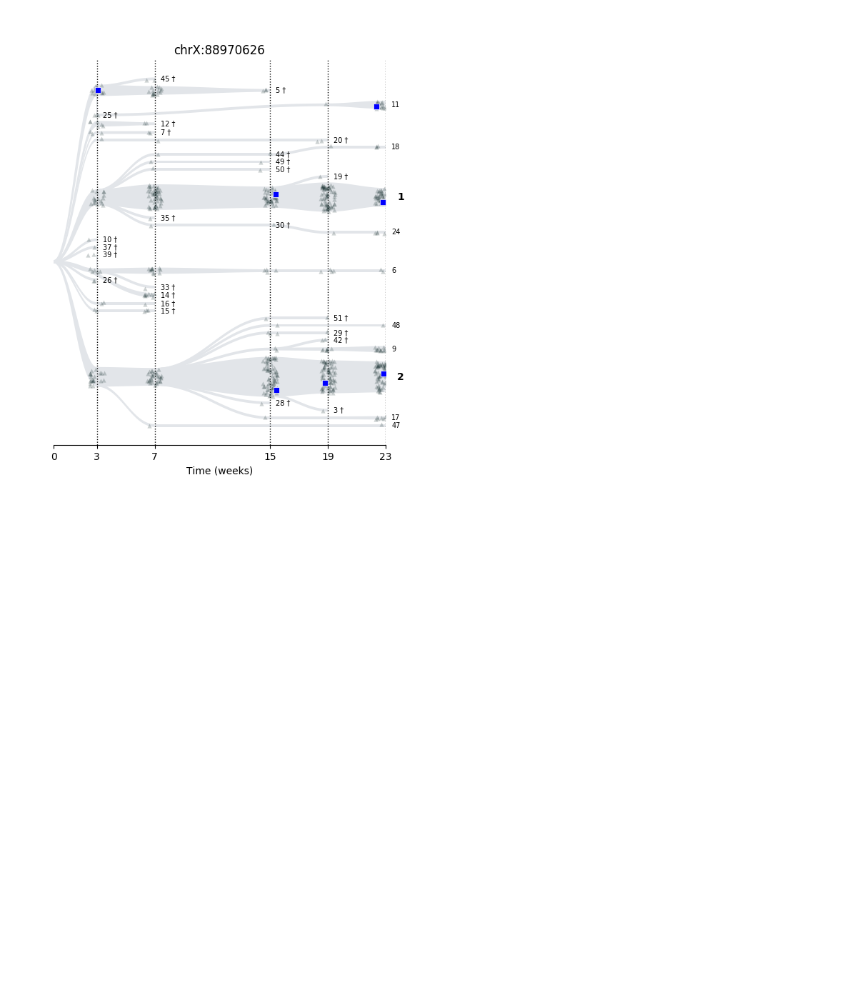

<IPython.core.display.Javascript object>


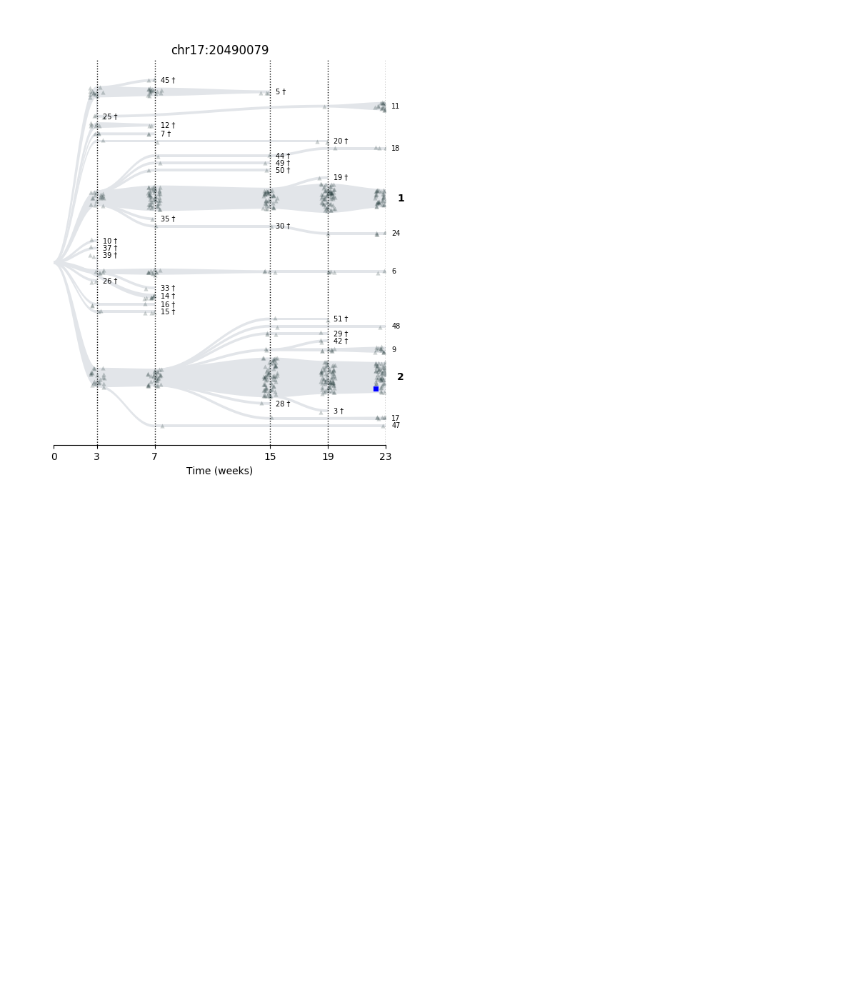

<IPython.core.display.Javascript object>


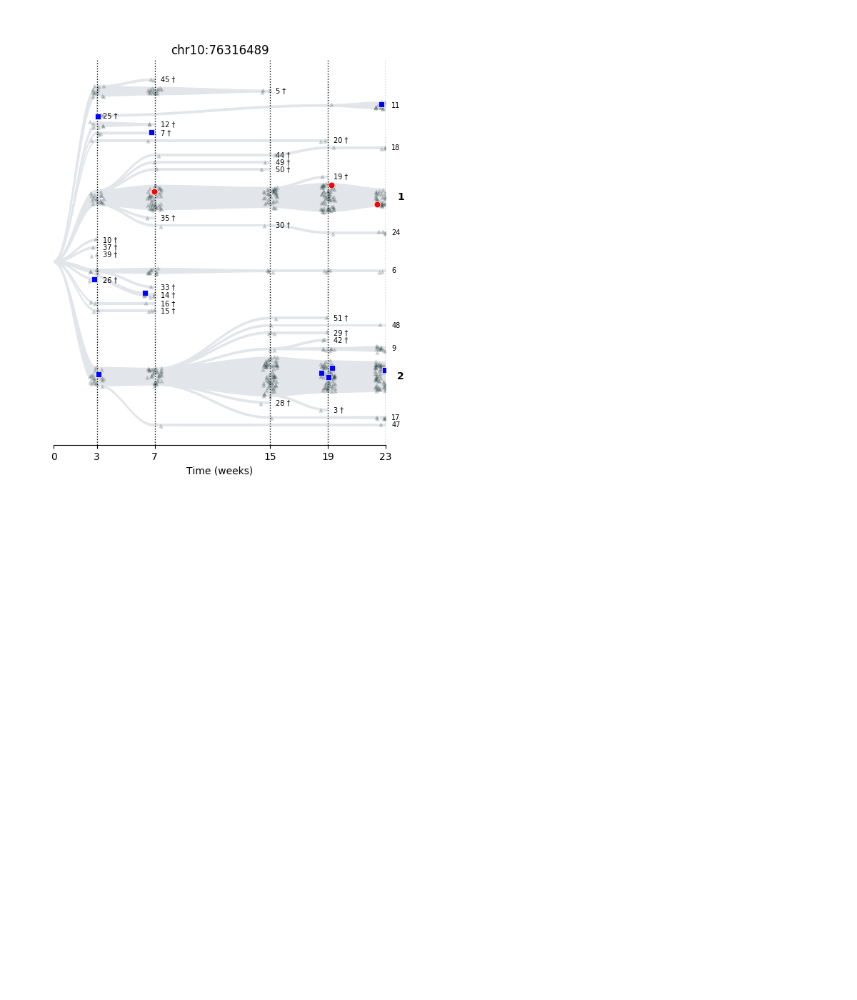

In [163]:
for contig, pos, ref, alt in df_ssnvs.columns:
    plotsnv(contig,pos)    
    plt.close()


In [164]:
from glob import glob
html_page = '<!DOCTYPE html><html><body>'
hits = glob('figures/APKS1*snv_chr*.png')
for hit in hits:
    
    html_page += '<div>\n'
    for r in ['APKS1','APKS2','APKS3']:
        html_page += f'\t<img src="{hit.replace("APKS1",r)}" width="400px">\n'
    html_page += '</div>\n'
    
    
html_page +='</html></body>'
with open('snvs.html', 'w') as o:
    o.write(html_page)
    

In [165]:
hit

'figures/APKS1_2.snv_chr16_9928709_tree.png'

In [166]:
pwd

'/home/buysdb/repos/Analysis/cnv_normaliser'